In [20]:
!nvidia-smi

from google.colab import drive
drive.mount('/content/drive')



#import gigalens
!pip install corner
!pip install lenstronomy==1.13.2
!pip install gigalens --no-deps

import pickle
import matplotlib as mpl
import numpy as np
import seaborn as sns
import tensorflow as tf
import tensorflow_probability as tfp
from matplotlib import pyplot as plt
from corner import corner

sns.set_style('dark')
tf.config.list_physical_devices(
    # device_type=None
)

Fri Dec 12 20:34:41 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   69C    P0             32W /   72W |     259MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [21]:
# %cd /content/drive/MyDrive/gigalens/src/
# import gigalens

# Definitions

## Delensing functions

In [22]:
@tf.function
def _rotate(x, y, phi):
    cos_phi, sin_phi = tf.cos(phi), tf.sin(phi)
    return x * cos_phi + y * sin_phi, -x * sin_phi + y * cos_phi

@tf.function
def deriv_epl(x, y, theta_E, gamma, e1, e2, center_x, center_y):
  phi = tf.atan2(e2, e1) / 2
  c = tf.clip_by_value(tf.math.sqrt(e1 ** 2 + e2 ** 2), 0, 1)
  q = (1 - c) / (1 + c)
  theta_E_conv = theta_E / (tf.math.sqrt((1.0 + q ** 2) / (2.0 * q)))
  b = theta_E_conv * tf.math.sqrt((1 + q ** 2) / 2)
  t = gamma - 1

  x, y = x - center_x, y - center_y
  x, y = _rotate(x, y, phi)


  R = tf.clip_by_value(tf.math.sqrt((q * x) ** 2 + y ** 2), 1e-10, 1e10)
  angle = tf.math.atan2(y, q * x)
  f = (1 - q) / (1 + q)
  Cs, Ss = tf.math.cos(angle), tf.math.sin(angle)
  Cs2, Ss2 = tf.math.cos(2 * angle), tf.math.sin(2 * angle)

  niter = tf.stop_gradient(tf.math.log(1e-12) / tf.math.log(tf.reduce_max(f)) + 2)

  def body(n, p):
      last_x, last_y, f_x, f_y = p
      prefac = -f * (2 * n - (2 - t)) / (2 * n + (2 - t))
      last_x, last_y = prefac * (Cs2 * last_x - Ss2 * last_y), prefac * (
              Ss2 * last_x + Cs2 * last_y
      )
      return n + 1, (last_x, last_y, f_x + last_x, f_y + last_y)

  _, _, fx, fy = tf.while_loop(
      lambda i, p: i < niter,
      body, (1.0, (Cs, Ss, Cs, Ss)),
      maximum_iterations = 500,
      swap_memory=True,
  )[1]

  prefac = (2 * b) / (1 + q) * tf.math.pow(b / R, t - 1)
  fx, fy = fx * prefac, fy * prefac
  return _rotate(fx, fy, -phi)

@tf.function
def deriv_shear(x, y, gamma1, gamma2):
  return gamma1 * x + gamma2 * y, gamma2 * x - gamma1 * y

##########################################################
@tf.function
def _deriv_epl_shear(x, y, lens_params):
  f_xi1, f_yi1 = deriv_epl(x, y, **lens_params[0][0])
  f_xi2, f_yi2 = deriv_shear(x, y, **lens_params[0][1])
  f_xi, f_yi = f_xi1 + f_xi2, f_yi1 + f_yi2
  return f_xi,f_yi
#########################################################

@tf.function
def _beta_epl_shear(x, y, lens_params):

 f_xi, f_yi = deriv_epl(x, y, **lens_params[0][0])
 beta_x, beta_y = x - f_xi, y - f_yi

 f_xi, f_yi = deriv_shear(x, y, **lens_params[0][1])
 beta_x, beta_y = beta_x - f_xi, beta_y - f_yi

 return beta_x, beta_y

In [23]:
@tf.function
def _hessian_differential_cross(x, y, kwargs, diff=0.0001):
        """
        computes the numerical differentials over a finite range for f_xx, f_yy, f_xy from f_x and f_y
        The differentials are computed along the cross centered at (x, y).

        :param x: x-coordinate
        :param y: y-coordinate
        :param kwargs: lens model keyword argument list
        :param k: int, list of bools or None, indicating a subset of lens models to be evaluated
        :param diff: float, scale of the finite differential (diff/2 in each direction used to compute the differential
        :return: f_xx, f_xy, f_yx, f_yy
        """
        # alpha_ra_dx, alpha_dec_dx = _beta_EPL_shear(x + diff/2, y, kwargs)
        # alpha_ra_dy, alpha_dec_dy = _beta_EPL_shear(x, y + diff/2, kwargs)

        # alpha_ra_dx_, alpha_dec_dx_ = _beta_EPL_shear(x - diff/2, y, kwargs)
        # alpha_ra_dy_, alpha_dec_dy_ = _beta_EPL_shear(x, y - diff/2, kwargs)

        alpha_ra_dx, alpha_dec_dx = _deriv_epl_shear(x + diff/2, y, kwargs)
        alpha_ra_dy, alpha_dec_dy = _deriv_EPL_shear(x, y + diff/2, kwargs)

        alpha_ra_dx_, alpha_dec_dx_ = _deriv_epl_shear(x - diff/2, y, kwargs)
        alpha_ra_dy_, alpha_dec_dy_ = _deriv_epl_shear(x, y - diff/2, kwargs)

        dalpha_rara = (alpha_ra_dx - alpha_ra_dx_) / diff
        dalpha_radec = (alpha_ra_dy - alpha_ra_dy_) / diff
        dalpha_decra = (alpha_dec_dx - alpha_dec_dx_) / diff
        dalpha_decdec = (alpha_dec_dy - alpha_dec_dy_) / diff

        f_xx = dalpha_rara
        f_yy = dalpha_decdec
        f_xy = dalpha_radec
        f_yx = dalpha_decra
        return f_xx, f_xy, f_yx, f_yy


## Magnification functions

In [ ]:

@tf.function
def _hessian_differential_square(x, y, kwargs, diff=0.00001):
        """
        computes the numerical differentials over a finite range for f_xx, f_yy, f_xy from f_x and f_y
        The differentials are computed on the square around (x, y). This minimizes curl.

        :param x: x-coordinate
        :param y: y-coordinate
        :param kwargs: lens model keyword argument list
        :param k: int, list of booleans or None, indicating a subset of lens models to be evaluated
        :param diff: float, scale of the finite differential (diff/2 in each direction used to compute the differential
        :return: f_xx, f_xy, f_yx, f_yy
        # """
        # alpha_ra_pp, alpha_dec_pp = _beta_EPL_shear(x + diff/2, y + diff/2, kwargs)
        # alpha_ra_pn, alpha_dec_pn = _beta_EPL_shear(x + diff/2, y - diff/2, kwargs)

        # alpha_ra_np, alpha_dec_np = _beta_EPL_shear(x - diff / 2, y + diff / 2, kwargs)
        # alpha_ra_nn, alpha_dec_nn = _beta_EPL_shear(x - diff / 2, y - diff / 2, kwargs)

        alpha_ra_pp, alpha_dec_pp = _deriv_epl_shear(x + diff/2, y + diff/2, kwargs)
        alpha_ra_pn, alpha_dec_pn = _deriv_epl_shear(x + diff/2, y - diff/2, kwargs)

        alpha_ra_np, alpha_dec_np = _deriv_epl_shear(x - diff / 2, y + diff / 2, kwargs)
        alpha_ra_nn, alpha_dec_nn = _deriv_epl_shear(x - diff / 2, y - diff / 2, kwargs)

        f_xx = (alpha_ra_pp - alpha_ra_np + alpha_ra_pn - alpha_ra_nn) / diff / 2
        f_xy = (alpha_ra_pp - alpha_ra_pn + alpha_ra_np - alpha_ra_nn) / diff / 2
        f_yx = (alpha_dec_pp - alpha_dec_np + alpha_dec_pn - alpha_dec_nn) / diff / 2
        f_yy = (alpha_dec_pp - alpha_dec_pn + alpha_dec_np - alpha_dec_nn) / diff / 2

        return f_xx, f_xy, f_yx, f_yy
@tf.function
def hessian(x, y, kwargs, diff=0.00001, diff_method='square'):
        """
        hessian matrix

        :param x: x-position (preferentially arcsec)
        :type x: numpy array
        :param y: y-position (preferentially arcsec)
        :type y: numpy array
        :param kwargs: list of keyword arguments of lens model parameters matching the lens model classes
        :param k: only evaluate the k-th lens model
        :param diff: float, scale over which the finite numerical differential is computed. If None, then using the
         exact (if available) differentials.
        :param diff_method: string, 'square' or 'cross', indicating whether finite differentials are computed from a
         cross or a square of points around (x, y)
        :return: f_xx, f_xy, f_yx, f_yy components
        """
        # if diff is None:
        #     return hessian(x, y, kwargs)
        if diff_method == 'square': #elif
            return _hessian_differential_square(x, y, kwargs, diff=diff)
        elif diff_method == 'cross':
            return _hessian_differential_cross(x, y, kwargs, diff=diff)
        else:
            raise ValueError('diff_method %s not supported. Chose among "square" or "cross".' % diff_method)

@tf.function
def magnification(x, y, kwargs, diff=0.0001, diff_method='square'):
        """
        magnification
        mag = 1/det(A)
        A = 1 - d^2phi/d_ij

        :param x: image plane x-position (preferentially arcsec)
        :type x: numpy array
        :param y: image plane y-position (preferentially arcsec)
        :type y: numpy array
        :param kwargs: list of keyword arguments of lens model parameters matching the lens model classes
        :param k: only evaluate the k-th lens model
        :param diff: float, scale over which the finite numerical differential is computed. If None, then using the
         exact (if available) differentials.
        :param diff_method: string, 'square' or 'cross', indicating whether finite differentials are computed from a
         cross or a square of points around (x, y)
        :return: magnification
        """

        f_xx, f_xy, f_yx, f_yy = hessian(x, y, kwargs, diff=diff, diff_method=diff_method)
        det_A = (1 - f_xx) * (1 - f_yy) - f_xy*f_yx
        return 1/det_A

@tf.function
def determinant(x, y, kwargs, diff=0.0001, diff_method='square'):
        """
        magnification
        mag = 1/det(A)
        A = 1 - d^2phi/d_ij

        :param x: image plane x-position (preferentially arcsec)
        :type x: numpy array
        :param y: image plane y-position (preferentially arcsec)
        :type y: numpy array
        :param kwargs: list of keyword arguments of lens model parameters matching the lens model classes
        :param k: only evaluate the k-th lens model
        :param diff: float, scale over which the finite numerical differential is computed. If None, then using the
         exact (if available) differentials.
        :param diff_method: string, 'square' or 'cross', indicating whether finite differentials are computed from a
         cross or a square of points around (x, y)
        :return: magnification
        """

        f_xx, f_xy, f_yx, f_yy = hessian(x, y, kwargs, diff=diff, diff_method=diff_method)
        det_A = (1 - f_xx) * (1 - f_yy) - f_xy*f_yx
        return det_A

## Point source light class

In [24]:
import tensorflow as tf
import tensorflow_probability as tfp
import gigalens.profile
tfd = tfp.distributions

class Sersic(gigalens.profile.LightProfile):
    """A spherically symmetric Sersic light profile.

    .. math::
        I(x,y) = I_e \\exp\\left(-b_n \\left(\\left(\\frac{D(x,y)}{R_s}\\right)^{1/n} - 1\\right)\\right)

    where :math:`D(x,y)` is the distance function (as defined in :func:`~gigalens.tf.profiles.light.sersic.Sersic.distance`).
    In the simplest case, it is just Euclidean distance from the center, and when ellipticity is non-zero, the
    coordinate axes are translated, rotated and scaled to match the ellipse defined by the complex ellipticities
    ``(e1,e2)`` with center ``(center_x, center_y)`` then the Euclidean distance from the center is calculated.
    If least squares is not being used, the amplitude :math:`I_e` is set to be 1.
    """

    _name = "SERSIC"
    _params = ["R_sersic", "n_sersic", "center_x", "center_y"]

    @tf.function
    def light(self, x, y, R_sersic, n_sersic, center_x, center_y, Ie=None):
        Ie = tf.ones_like(R_sersic) if self.use_lstsq else Ie
        R = self.distance(x, y, center_x, center_y)
        bn = 1.9992 * n_sersic - 0.3271
        return Ie * tf.math.exp(-bn * ((R / R_sersic) ** (1 / n_sersic) - 1.0))


    @tf.function
    def distance(self, x, y, cx, cy, e1=None, e2=None):
        """

        Args:
            x: The :math:`x` coordinates to evaluate the distance function at
            y: The :math:`y` coordinates to evaluate the distance function at
            cx: The :math:`x` coordinate of the center of the Sersic light component
            cy: The :math:`y` coordinate of the center of the Sersic light component
            e1: Complex ellipticity component. If unspecified, it is assumed to be zero.
            e2: Complex ellipticity component. If unspecified, it is assumed to be zero.

        Returns:
            The distance function evaluated at ``(x,y)``
        """
        if e1 is None:
            e1 = tf.zeros_like(cx)
        if e2 is None:
            e2 = tf.zeros_like(cx)
        phi = tf.atan2(e2, e1) / 2
        c = tf.math.sqrt(e1 ** 2 + e2 ** 2)
        q = (1 - c) / (1 + c)
        dx, dy = x - cx, y - cy
        cos_phi, sin_phi = tf.math.cos(phi), tf.math.sin(phi)
        xt1 = (cos_phi * dx + sin_phi * dy) * tf.math.sqrt(q)
        xt2 = (-sin_phi * dx + cos_phi * dy) / tf.math.sqrt(q)
        return tf.sqrt(xt1 ** 2 + xt2 ** 2)


class SersicEllipse(Sersic):
    _name = "SERSIC_ELLIPSE"
    _params = ["R_sersic", "n_sersic", "e1", "e2", "center_x", "center_y"]

    @tf.function
    def light(self, x, y, R_sersic, n_sersic, e1, e2, center_x, center_y, Ie=None):
        Ie = tf.ones_like(R_sersic) if self.use_lstsq else Ie
        R = self.distance(x, y, center_x, center_y, e1, e2)
        bn = 1.9992 * n_sersic - 0.3271
        return Ie * tf.math.exp(-bn * ((R / R_sersic) ** (1 / n_sersic) - 1.0))

class CoreSersic(Sersic):
    _name = "CORE_SERSIC"
    _params = [
        "R_sersic",
        "n_sersic",
        "Rb",
        "alpha",
        "gamma",
        "e1",
        "e2",
        "center_x",
        "center_y",
    ]

    @tf.function
    def light(
        self,
        x,
        y,
        R_sersic,
        n_sersic,
        Rb,
        alpha,
        gamma,
        e1,
        e2,
        center_x,
        center_y,
        Ie=None,
    ):
        Ie = tf.ones_like(R_sersic) if self.use_lstsq else Ie
        R = self.distance(x, y, center_x, center_y, e1, e2)
        bn = 1.9992 * n_sersic - 0.3271
        result = (
            Ie
            * (1 + (Rb / R) ** alpha) ** (gamma / alpha)
            * tf.math.exp(
                -bn
                * (
                    (R ** alpha + Rb ** alpha)
                    / R_sersic ** alpha ** 1.0
                    / (alpha * n_sersic)
                )
                - 1.0
            )
        )
        return result


class Point(Sersic):
    _name = "POINT"
    _params = ["center_x", "center_y"]
    '''
    simulate a gaussian, return brigtest pixel
    I have not kept bn which was to ensure Ie is the high light brigtness.
    Insteady I want Ie to be the brightest flux.
    I use R_scale to basically make the light fall to zero quickly.
    I dont have a lstsq fit version of this yet.  See return statement for Sersic above.
    '''
    @tf.function
    def light(self, x, y, center_x, center_y, Ie=None, R_sersic=None, n_sersic=None):
        R = self.distance(x, y, center_x, center_y)
#         R_scale = 0.002
#         pix = Ie * jnp.exp(-(R / R_scale) ** 2 )
#         maxpix = jnp.max(pix)
#         ret = jnp.array(maxpix)
#         # return ret[jnp.newaxis, ...] if self.use_lstsq else (Ie * ret)
        n_fixed = 1000
        # R_fixed = 0.002
        R_fixed = 0.0015
        b_fixed = 1.9992 * n_fixed - 0.3271
        ret = Ie * tf.exp(-b_fixed * ((R / R_fixed) ** (1 / n_fixed) - 1.0))
        return ret[tf.newaxis, ...] if self.use_lstsq else (Ie * ret)

Bright points

In [25]:
###### mod ified #######

import tensorflow as tf
import numpy as np
from lenstronomy.Data.pixel_grid import PixelGrid

class BrightestPoints:
    def __init__(self, number_of_images=4, num_pixels=750, grid_size=250, delta_pix=0.02, supersample=1):
        self.number_of_images = number_of_images
        self.num_pixels = num_pixels
        self.grid_size = grid_size
        self.delta_pix = delta_pix
        self.supersample = supersample

    def find_brightest_points(self, img):
        """Find the brightest points in a lensed point source image.
        Args:
            img (tf.Tensor): Input lensed point source image tensor.
                            Shape: (num_pixels, num_pixels).
        Returns:
            tf.Tensor: Tensor containing the coordinates of the brightest points in the image.
                      Shape: (number_of_images, 2)
        """
        image = tf.reshape(img, [1, self.num_pixels, self.num_pixels, 1])
        patches = tf.image.extract_patches(
            images=image,
            sizes=[1, self.grid_size, self.grid_size, 1],
            strides=[1, self.grid_size, self.grid_size, 1],
            rates=[1, 1, 1, 1],
            padding='VALID'
        )
        patches = tf.reshape(
            patches,
            [int(self.num_pixels / self.grid_size), int(self.num_pixels / self.grid_size), self.grid_size, self.grid_size, 1]
        )
        max_values = tf.reduce_max(patches, axis=(2, 3))
        result_grid = tf.squeeze(max_values)
        flat_grid = tf.reshape(result_grid, [-1])
        values, indices = tf.math.top_k(flat_grid, k=self.number_of_images)

        brightest_points = []

        for i in range(self.number_of_images):

            point = tf.where(img == values[i])
            if point.shape[0] > 0:
                brightest_points.append(point[0].numpy().tolist())


        brightest_points = tf.constant(brightest_points, dtype=tf.int32)
        return brightest_points

    def pix_to_arcsec(self, brightest_points):
        """Convert pixel coordinates to arcsecond coordinates.
        Args:
            brightest_points (tf.Tensor): Tensor containing the pixel coordinates of the brightest points.
                                          Shape: (number_of_images, 2)
            num_pix (int, optional): Number of pixels in the image. Defaults to 750.
            delta_pix (float, optional): Pixel scale in arcseconds. Defaults to 0.0006.
            supersample (int, optional): Supersampling factor. Defaults to 1.
        Returns:
            tf.Tensor: Tensor containing the converted arcsecond coordinates of the brightest points.
                      Shape: (number_of_images, 2)
        """
        lo = np.arange(0, self.supersample * self.num_pixels, dtype=np.float32)
        lo = np.min(lo - np.mean(lo))
        transform_pix2angle = (tf.eye(2) * self.delta_pix) / self.supersample
        ra_at_xy_0, dec_at_xy_0 = np.squeeze((transform_pix2angle @ ([[lo], [lo]])))
        kwargs_pixel_rot = {
            "nx": self.supersample * self.num_pixels,
            "ny": self.supersample * self.num_pixels,
            "ra_at_xy_0": ra_at_xy_0,
            "dec_at_xy_0": dec_at_xy_0,
            "transform_pix2angle": np.array(transform_pix2angle),
        }
        pixel_grid_rot = PixelGrid(**kwargs_pixel_rot)
        img_x, img_y = (
            pixel_grid_rot._x_grid.astype(np.float32),
            pixel_grid_rot._y_grid.astype(np.float32),
        )
        img_x, img_y = tf.expand_dims(img_x, axis=0), tf.expand_dims(img_y, axis=0)
        img_x, img_y = tf.repeat(img_x, repeats=self.number_of_images, axis=0), tf.repeat(img_y, repeats=self.number_of_images, axis=0)
        column = tf.range(tf.shape(brightest_points)[0])
        reshaped_column = tf.reshape(column, (-1, 1))
        enumerated_brightest_points = tf.concat([reshaped_column, brightest_points], axis=1)
        grid_indices, x_indices, y_indices = tf.unstack(enumerated_brightest_points, axis=-1)
        x_arcsec = tf.gather_nd(img_x, tf.stack([grid_indices, x_indices, y_indices], axis=-1))
        y_arcsec = tf.gather_nd(img_y, tf.stack([grid_indices, x_indices, y_indices], axis=-1))
        return x_arcsec, y_arcsec


## MAP

In [26]:
def MAP(optimizer, prob_model_ps, prob_model, prob_model_uniform, posterior_version, start=None, n_samples=500, num_steps=350, seed=0, track_loss=True,):
    if posterior_version == "total":
      tf.random.set_seed(seed)
      start = prob_model.prior.sample(n_samples) if start is None else start
      trial = tf.Variable(prob_model.bij.inverse(start))
    elif posterior_version == "only_dist":
      tf.random.set_seed(seed)
      start = prob_model_uniform.prior.sample(n_samples) if start is None else start
      trial = tf.Variable(prob_model_uniform.pack_bij.inverse(start))



    @tf.function
    def train_step():
        with tf.GradientTape() as tape:
            agg_loss = - prob_model_ps.log_prob(trial)

        gradients = tape.gradient(agg_loss, [trial])
        optimizer.apply_gradients(zip(gradients, [trial]))
        return agg_loss if track_loss else None

    losses = tf.TensorArray(tf.float32, size=0, dynamic_size=True) if track_loss else None

    with trange(num_steps) as pbar:
        for i in pbar:
            loss_value = train_step()
            if track_loss:
                losses = losses.write(i, loss_value)

    final_losses = losses.stack() if track_loss else None

    return trial, final_losses

## SVI

In [27]:
import numpy as np
import tensorflow as tf
import tensorflow_probability as tfp
from tensorflow_probability import (
    distributions as tfd,
    bijectors as tfb,
    experimental as tfe,
)
import tqdm
from tqdm.auto import trange

import multiprocessing
import time


def SVI(optimizer, start, n_vi, prob_model_ps, init_scales=1e-4, num_steps=500, seed=0):


        tf.random.set_seed(seed)

        start = tf.squeeze(start)
        scale = (
            np.ones(len(start)).astype(np.float32) * init_scales
            if np.size(init_scales) == 1
            else init_scales
        )
        q_z = tfd.MultivariateNormalTriL(
            loc=tf.Variable(start),
            scale_tril=tfp.util.TransformedVariable(
                np.diag(scale),
                tfp.bijectors.FillScaleTriL(diag_bijector=tfb.Exp(), diag_shift=1e-6),
                name="stddev",
            ),
        )

        losses = tfp.vi.fit_surrogate_posterior(
            lambda param: prob_model_ps.log_prob(param) ,
            surrogate_posterior=q_z,
            sample_size=n_vi,
            optimizer=optimizer,
            num_steps=num_steps,
        )


        return q_z, losses

## HMC

In [28]:
def HMC(q_z,
        prob_model_ps,
        init_eps=0.3,
        init_l=3,
        n_hmc=50,
        num_burnin_steps=200,
        num_results=300,
        max_leapfrog_steps=30,
        seed=3,
  ):

      def tqdm_progress_bar_fn(num_steps):
          return iter(tqdm(range(num_steps), desc="", leave=True))

      tf.random.set_seed(seed)

      mc_start = q_z.sample(n_hmc)
      cov_estimate = q_z.covariance()

      momentum_distribution = (
          tfe.distributions.MultivariateNormalPrecisionFactorLinearOperator(
              precision_factor=tf.linalg.LinearOperatorLowerTriangular(
                  tf.linalg.cholesky(cov_estimate),
              ),
              precision=tf.linalg.LinearOperatorFullMatrix(cov_estimate),
          )
      )
      @tf.function(jit_compile = True)
      def run_chain():
            num_adaptation_steps = int(num_burnin_steps * 0.8)
            start = tf.identity(mc_start)

            mc_kernel = tfe.mcmc.PreconditionedHamiltonianMonteCarlo(
                target_log_prob_fn=lambda param: prob_model_ps.log_prob(param) ,
                momentum_distribution=momentum_distribution,
                step_size=init_eps,
                num_leapfrog_steps=init_l,
            )

            mc_kernel = tfe.mcmc.GradientBasedTrajectoryLengthAdaptation(
                mc_kernel,
                num_adaptation_steps=num_adaptation_steps,
                max_leapfrog_steps=max_leapfrog_steps,
            )
            mc_kernel = tfp.mcmc.DualAveragingStepSizeAdaptation(
                inner_kernel=mc_kernel, num_adaptation_steps=num_adaptation_steps
            )

            return tfp.mcmc.sample_chain(
                num_results=num_results,
                num_burnin_steps=num_burnin_steps,
                current_state=start,
                kernel=mc_kernel,
                trace_fn = None,
                seed=seed,
            )


      return run_chain()

In [29]:
# testing NUTS

def HMC_nuts(q_z, prob_model_ps, init_eps=0.3, init_l=3, n_hmc=50,
        num_burnin_steps=200, num_results=300, max_leapfrog_steps=30, seed=3):

    def tqdm_progress_bar_fn(num_steps):
        return iter(tqdm(range(num_steps), desc="", leave=True))

    tf.random.set_seed(seed)

    mc_start = q_z.sample(n_hmc)
    #cov_estimate = q_z.covariance()

    #momentum_distribution = tfd.MultivariateNormalLinearOperator(
    #    loc=tf.zeros(mc_start.shape[1]),  # assuming mc_start has shape [n_hmc, param_dim]
    #    scale=tf.linalg.LinearOperatorLowerTriangular(tf.linalg.cholesky(cov_estimate))
    #)

    @tf.function(jit_compile=True)
    def run_chain():
        num_adaptation_steps = int(num_burnin_steps * 0.8)
        start = tf.identity(mc_start)

        # NUTS
        nuts_kernel = tfp.mcmc.NoUTurnSampler(
            target_log_prob_fn=lambda param: prob_model_ps.log_prob(param),
            step_size=init_eps,
            max_tree_depth=init_l,  # similar to num_leapfrog_steps
            #state_gradients_are_stopped=True
        )

        # step-size adaptation
        adaptive_nuts_kernel = tfp.mcmc.DualAveragingStepSizeAdaptation(
            inner_kernel=nuts_kernel,
            num_adaptation_steps=num_adaptation_steps,
            #target_accept_prob=0.75
        )

        return tfp.mcmc.sample_chain(
            num_results=num_results,
            num_burnin_steps=num_burnin_steps,
            current_state=start,
            kernel=adaptive_nuts_kernel,
            trace_fn=None,
            seed=seed
        )

    return run_chain()

In [30]:
from gigalens.tf.inference import ModellingSequence
from gigalens.tf.model import ForwardProbModel, BackwardProbModel
from gigalens.model import PhysicalModel
from gigalens.tf.simulator import LensSimulator
from gigalens.simulator import SimulatorConfig
from gigalens.tf.profiles.light import sersic
from gigalens.tf.profiles.mass import sis, shear, epl, sie

sns.set_style("whitegrid")
tfd = tfp.distributions

## PSF (provisional)

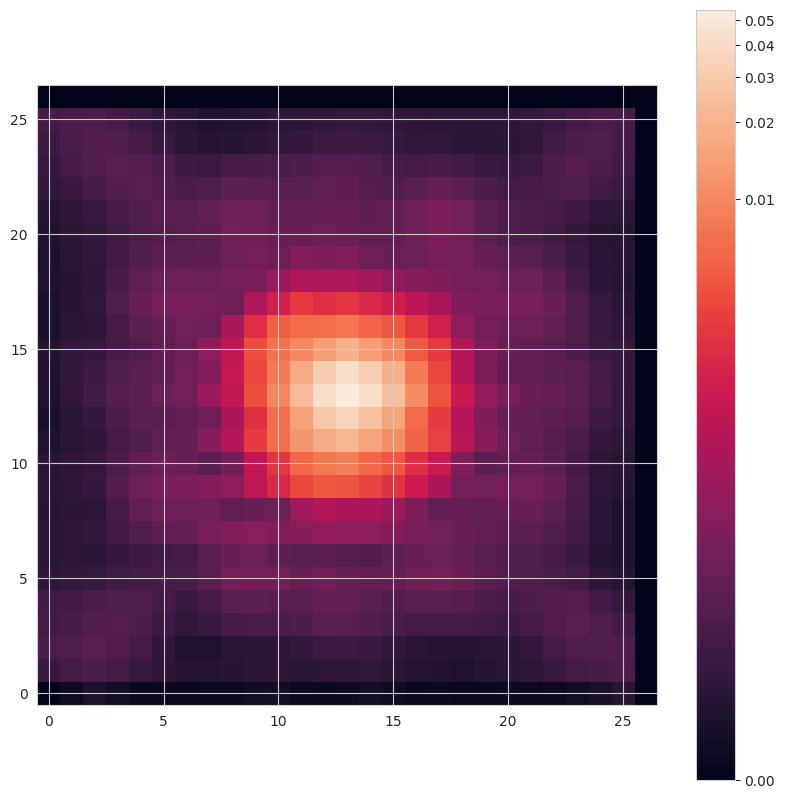

In [43]:
# Adding some psf
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.visualization.wcsaxes import add_scalebar
import astropy.units as u
from astropy.coordinates import Angle
from astropy.wcs.utils import skycoord_to_pixel
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord

psf_fits = '/content/drive/MyDrive/Colab Notebooks/Images/238/psf238.fits'
with fits.open(psf_fits) as hdul:
    data = hdul[0].data
    hdul.close()

norm = simple_norm(data, 'log', percent=100.0)

fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(data, origin = 'lower', norm = norm)
plt.colorbar(im, ax=ax)

kernel = data.astype(np.float32)

np.save('/content/drive/MyDrive/point-source-updates/F475W-epsf.npy', kernel)

## Simulation tests

In [32]:
from tensorflow_probability import distributions as tfd, bijectors as tfb

truth = [
    [
        {'theta_E': 0.167, 'gamma': 2.013, 'e1': 0.049, 'e2': 0.083, 'center_x': 0.005, 'center_y': 0.011},  # mass distribution model
        {'gamma1': 0.078, 'gamma2': 0.015}  # external shear
    ],
    [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055} # lens light
    ],
    [
        {'center_x': 0.004, 'center_y': 0.009, 'Ie': 2815.973}  # source light
    ]
]

phys_model = PhysicalModel(
    [
        epl.EPL(50),
        shear.Shear()
    ],
    [
        sersic.SersicEllipse(),
    ],
    [
        Point()
    ]
)
##########################################################
lens_prior = tfd.JointDistributionSequential(
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.0, high = 0.3),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.5, 2.5),
          e1=tfd.Normal(0, 0.1),
          e2=tfd.Normal(0, 0.1),
          center_x=tfd.Normal(0, 0.1),
          center_y=tfd.Normal(0, 0.1),
          )),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Normal(0, 0.1),
           gamma2=tfd.Normal(0, 0.1),
          ),),])
###########################################################
lens_prior_trunc_normal = tfd.JointDistributionSequential(
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.0, high = 0.3),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.5, 2.5),
          e1=tfd.TruncatedNormal(0, 0.1, -0.2, 0.2),
          e2=tfd.TruncatedNormal(0, 0.1, -0.2, 0.2),
          center_x=tfd.TruncatedNormal(0, 0.1, -0.2, 0.2),
          center_y=tfd.TruncatedNormal(0, 0.1, -0.2, 0.2),
          )),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.TruncatedNormal(0, 0.1, -0.2, 0.2),
           gamma2=tfd.TruncatedNormal(0, 0.1, -0.2, 0.2),
          ),),])
########################################################
lens_prior_uniform = tfd.JointDistributionSequential(
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.0, high = 0.3),
          gamma=tfd.Uniform(1., 2.8,),
          e1=tfd.Uniform(-0.1, 0.1),
          e2=tfd.Uniform(-0.1, 0.1),
          center_x=tfd.Uniform(-0.1, 0.1),
          center_y=tfd.Uniform(-0.1, 0.1),
          )),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Uniform(-0.1, 0.1),
           gamma2=tfd.Uniform(-0.1, 0.1),
          ),),])

prior = tfd.JointDistributionSequential(
    [lens_prior_trunc_normal,]
)

delta_pix = 0.0006
supersample = 1
num_pix = 750

prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)
example = lens_prior.sample(seed = 0)
size = int(tf.size(tf.nest.flatten(example)))

# kernel = np.load('/content/drive/MyDrive/point-source-updates/F475W-epsf.npy').astype(np.float32)
sim_config = SimulatorConfig(delta_pix=delta_pix, num_pix=num_pix, supersample=supersample)
lens_sim = LensSimulator(phys_model, sim_config, bs=1)

Brighest points reshaped into x, y:

x: tf.Tensor(
[[-0.1689    ]
 [-0.0615    ]
 [ 0.16350001]
 [ 0.06090001]], shape=(4, 1), dtype=float32)

y: tf.Tensor(
[[ 0.04590001]
 [-0.1359    ]
 [-0.0651    ]
 [ 0.15630001]], shape=(4, 1), dtype=float32)


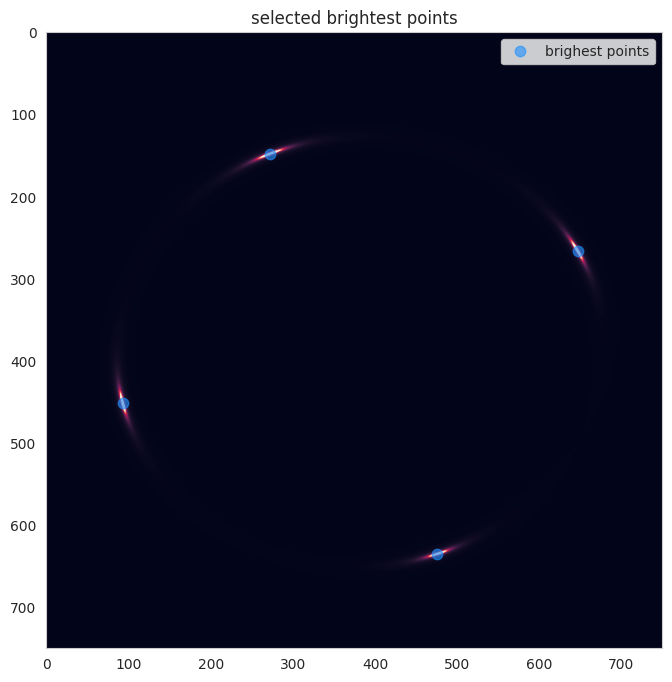

In [33]:
sim_image = lens_sim.simulate(truth)

# simulated image
plt.figure(figsize=(10, 8))
plt.imshow(sim_image, vmin=0, vmax=10)
plt.grid(False)

lens_omitted_img= lens_sim.simulate([truth[0],[],truth[2]]) # Omit lens light
#plt.imshow(lens_omitted_img, vmin=0, vmax=10)
#plt.grid(False)
#plt.show()

# locating images
converter = BrightestPoints(number_of_images = 4, num_pixels=num_pix, grid_size=int(num_pix/2), delta_pix=delta_pix, supersample=1)
brightest_pixels = converter.find_brightest_points(lens_omitted_img)
plt.plot(brightest_pixels[:, 1], brightest_pixels[:, 0], ".", ms = 15, color = "dodgerblue", alpha = 0.6, label = "brighest points")
plt.title("selected brightest points")
plt.legend()
x_arcsec, y_arcsec = converter.pix_to_arcsec(brightest_pixels)
chains = 1
x = tf.repeat(x_arcsec[..., tf.newaxis], [chains], axis=-1)
y = tf.repeat(y_arcsec[..., tf.newaxis], [chains], axis=-1)
print("Brighest points reshaped into x, y:")
print("\nx:", x)
print("\ny:", y)

# ProbModel

In [34]:



class ProbModelPS:
    def __init__(self, weight_dist, weight_flux, truth, x_arcsec, y_arcsec, prob_model, prior, observed_flux = None, flux_ratios = False,):
        self.observed_flux = tf.expand_dims(observed_flux, 1) if observed_flux is not None else None
        self.flux_ratios = flux_ratios
        self.weight_dist = weight_dist
        self.weight_flux = weight_flux
        self.truth = truth
        self.x = tf.repeat(x_arcsec[..., tf.newaxis], [1], axis=-1)
        self.y = tf.repeat(y_arcsec[..., tf.newaxis], [1], axis=-1)
        self.prior = prior
        self.prob_model = prob_model
        self.initial_setup()
        self.n = None
        #self.mag_sq_truth = None

    def initial_setup(self):
        if self.observed_flux is None:
            print("\n-simulation-")
            mag_sq_truth = tf.square(magnification(self.x, self.y, self.truth))
        else:
            mag_sq_truth = tf.constant(self.observed_flux) # input is already squared



        self.mag_sq_truth = mag_sq_truth
        #print("self.mag_sq_truth", self.mag_sq_truth)
        ratios = tf.expand_dims(mag_sq_truth, 1) / tf.expand_dims(mag_sq_truth, 0)
        mask = tf.linalg.band_part(tf.ones((4, 4), dtype=tf.bool), 0, -1)
        mask = tf.logical_and(mask, tf.logical_not(tf.linalg.diag(tf.ones(4, dtype=tf.bool))))
        upper_tri_ratios = tf.boolean_mask(ratios, mask)
        self.n = tf.shape(mag_sq_truth)[0]
        num_combinations = self.n * (self.n - 1) // 2
        self.ratios_truth = tf.reshape(upper_tri_ratios, [num_combinations, tf.shape(mag_sq_truth)[-1]])

        i, j = tf.meshgrid(tf.range(self.n), tf.range(self.n), indexing='ij')
        upper_triangle = tf.logical_and(i < j, tf.ones_like(i, dtype=bool))
        self.i, self.j = tf.boolean_mask(i, upper_triangle), tf.boolean_mask(j, upper_triangle)

    @tf.function
    def log_prob(self, params):
        constrained = self.prob_model.bij.forward(params)

        delens = tf.convert_to_tensor(_beta_epl_shear(self.x, self.y, constrained))
        shifted_delens = tf.roll(delens, shift=-1, axis=1)
        sq_diffs = tf.square(delens - shifted_delens)
        sum_sq = tf.reduce_sum(sq_diffs, axis=0)
        sqrt_sum_sq = tf.sqrt(sum_sq)
        dist_loss = tf.reduce_mean(sqrt_sum_sq, axis=0)

        if self.flux_ratios: # flux ratios
            if self.observed_flux is None: # simulations
                print("\n--------- simulation. comparing flux ratios difference ----------")
                det_sq = tf.square(determinant(self.x, self.y, constrained))
                gi = tf.gather(det_sq, self.i, axis=0)
                gj = tf.gather(det_sq, self.j, axis=0)
                loss_terms = tf.square(gj - gi * self.ratios_truth)
                flux_ratios_loss = tf.reduce_sum(loss_terms, axis=0)
            else:
                print("\n----- real system. comparing flux ratio difference ----")
                det_sq = tf.square(determinant(self.x, self.y, constrained))
                gi = tf.gather(det_sq, self.i, axis=0)
                gj = tf.gather(det_sq, self.j, axis=0)
                loss_terms = tf.square(gj - gi * self.ratios_truth)
                flux_ratios_loss = tf.reduce_sum(loss_terms, axis=0)


        else: # magnifications
            if self.observed_flux is None: # simulations
                print("\n--------- simulation. comparing flux difference ----------")
                det_sq = tf.square(determinant(self.x, self.y, constrained))
                #print("\ndet_sq", det_sq)
                flux_diff = tf.square(det_sq - 1/self.mag_sq_truth)
                #print("\nflux_diff", flux_diff)
                flux_loss = tf.reduce_mean(flux_diff, axis = 0)
                #print("\nflux_loss", flux_loss)
            else:
                print("\n----- real system. comparing flux difference ----")
                det_sq = tf.square(determinant(self.x, self.y, constrained))
                #print("\ndet_sq", det_sq)
                #print("\nself.observed_flux", self.observed_flux)

                flux_diff = tf.square(det_sq * (1/15)**2 - 1/self.observed_flux) # snzwicky
                # flux_diff = tf.square(det_sq - 1/self.observed_flux)

                #print("\nflux_diff", flux_diff)
                flux_loss = tf.reduce_mean(flux_diff, axis = 0)
                #print("\nflux_loss", flux_loss)





        return - dist_loss * self.weight_dist - flux_ratios_loss * self.weight_flux + self.prior.log_prob(constrained) + self.prob_model.unconstraining_bij.forward_log_det_jacobian(self.prob_model.pack_bij.forward(params))



In [35]:
class ProbModelPS_only_dist:
    def __init__(self, x_arcsec, y_arcsec, prob_model):
        self.x = tf.repeat(x_arcsec[..., tf.newaxis], [1], axis=-1)
        self.y = tf.repeat(y_arcsec[..., tf.newaxis], [1], axis=-1)
        self.prob_model = prob_model

    @tf.function
    def log_prob(self, params):
        reshaped = self.prob_model.pack_bij.forward(params)
        delens = tf.convert_to_tensor(_beta_epl_shear(self.x, self.y, reshaped))
        shifted_delens = tf.roll(delens, shift=-1, axis=1)
        sq_diffs = tf.square(delens - shifted_delens)
        sum_sq = tf.reduce_sum(sq_diffs, axis=0)
        sqrt_sum_sq = tf.sqrt(sum_sq)
        dist_loss = tf.reduce_mean(sqrt_sum_sq, axis=0)

        return -dist_loss

In [36]:
class ProbModelPSsplit:
    def __init__(self, weight_dist, weight_flux, truth, x_arcsec, y_arcsec, prob_model, prior,):
        self.weight_dist = weight_dist
        self.weight_flux = weight_flux
        self.truth = truth
        self.x = tf.repeat(x_arcsec[..., tf.newaxis], [1], axis=-1)
        self.y = tf.repeat(y_arcsec[..., tf.newaxis], [1], axis=-1)
        self.prior = prior
        self.prob_model = prob_model
        self.initial_setup()
        self.n = None

    def initial_setup(self):
        mag_sq_truth = tf.square(magnification(self.x, self.y, self.truth))
        ratios = tf.expand_dims(mag_sq_truth, 1) / tf.expand_dims(mag_sq_truth, 0)
        mask = tf.linalg.band_part(tf.ones((4, 4), dtype=tf.bool), 0, -1)
        mask = tf.logical_and(mask, tf.logical_not(tf.linalg.diag(tf.ones(4, dtype=tf.bool))))
        upper_tri_ratios = tf.boolean_mask(ratios, mask)
        self.n = tf.shape(mag_sq_truth)[0]
        num_combinations = self.n * (self.n - 1) // 2
        self.ratios_truth = tf.reshape(upper_tri_ratios, [num_combinations, tf.shape(mag_sq_truth)[-1]])

        i, j = tf.meshgrid(tf.range(self.n), tf.range(self.n), indexing='ij')
        upper_triangle = tf.logical_and(i < j, tf.ones_like(i, dtype=bool))
        self.i, self.j = tf.boolean_mask(i, upper_triangle), tf.boolean_mask(j, upper_triangle)

    @tf.function
    def log_prob_split(self, params):
        constrained = self.prob_model.bij.forward(params)

        delens = tf.convert_to_tensor(_beta_epl_shear(self.x, self.y, constrained))
        shifted_delens = tf.roll(delens, shift=-1, axis=1)
        sq_diffs = tf.square(delens - shifted_delens)
        sum_sq = tf.reduce_sum(sq_diffs, axis=0)
        sqrt_sum_sq = tf.sqrt(sum_sq)
        dist_loss = tf.reduce_mean(sqrt_sum_sq, axis=0)

        det_sq = tf.square(determinant(self.x, self.y, constrained))
        gi = tf.gather(det_sq, self.i, axis=0)
        gj = tf.gather(det_sq, self.j, axis=0)
        loss_terms = tf.square(gj - gi * self.ratios_truth)
        flux_ratios_loss = tf.reduce_sum(loss_terms, axis=0)

        return -dist_loss * self.weight_dist, - flux_ratios_loss * self.weight_flux, self.prior.log_prob(constrained) + self.prob_model.unconstraining_bij.forward_log_det_jacobian(self.prob_model.pack_bij.forward(params))


# Tests

In [37]:
class TestingResults:
    def __init__(self, truth, prob_model_output, num_pix = 40, delta_pix = 0.02):
        self.truth = truth
        self.prob_model_output = prob_model_output
        self.recovered_x = None
        self.recovered_y = None
        self.num_pix = num_pix
        self.delta_pix = delta_pix
        self.x_arcsec_recovered = None
        self.y_arcsec_recovered = None



    def plot_loss_evolution(self, losses):
        losses_np = losses.numpy()
        plt.figure(figsize=(6, 6))
        for i in range(10):
            plt.plot(losses_np[:, i], label=f'walker {i+1}')

        plt.title('loss evolution')
        plt.xlabel('step')
        plt.ylabel('loss')
        plt.ylim([0, 1000])
        plt.show()

    def calculate_relative_errors(self):
        relative_errors_list = []
        for i, (truth_dict, estimated_dict) in enumerate(zip(self.truth[0], self.prob_model_output)):
            relative_errors = {}
            for key in truth_dict.keys():
                true_value = truth_dict[key]
                estimated_value = estimated_dict[key].numpy().item()
                if true_value != 0:
                    relative_error = abs((estimated_value - true_value) / true_value)
                    relative_errors[key] = relative_error
                else:
                    relative_errors[key] = float('inf')
            relative_errors_list.append(relative_errors)

        print("\nRelative errors:\n")
        for i, errors in enumerate(relative_errors_list):
            for key, error in errors.items():
                print(f"{key}: {error:.2%}")
        print("\n")

    def display_delensed_positions(self, x_arcsec, y_arcsec, _beta_epl_shear):
        x_values, y_values = _beta_epl_shear(x_arcsec, y_arcsec, [self.prob_model_output])
        x_values_np = x_values.numpy()
        y_values_np = y_values.numpy()
        self.recovered_x = np.mean(x_values_np)
        self.recovered_y = np.mean(y_values_np)
        true_x = self.truth[2][0]["center_x"]
        true_y = self.truth[2][0]["center_y"]

        relative_errors_x = (x_values_np - true_x) / true_x * 100
        relative_errors_y = (y_values_np - true_y) / true_y * 100

        plt.figure(figsize=(5, 5))
        plt.scatter(x_values_np, y_values_np, alpha=0.6, color='blue', marker='o', label='delensed points')
        plt.scatter(true_x, true_y, color='red', marker='*', s=200, label='true position')

        for i, (x, y, err_x, err_y) in enumerate(zip(x_values_np, y_values_np, relative_errors_x, relative_errors_y)):
            plt.annotate(f"err:({err_x:.2f}%, {err_y:.2f}%)", (x, y), textcoords="offset points", xytext=(0,10), ha='center', fontsize = 6, color = "black")

        plt.xlabel('x coord (arcsec)')
        plt.ylabel('y coord (arcsec)')
        plt.title("delensed positions")
        plt.legend(loc='lower right')
        plt.grid(True)
        plt.show()

    def flux_ratio_error(self, x_arcsec, y_arcsec, mag_sq_truth):
        '''
        x_arcsec, y_arcsec are observed positions
        '''


        #print("\nla mag del input", mag_sq_truth)
        self.x = tf.repeat(x_arcsec[..., tf.newaxis], [1], axis=-1)
        self.y = tf.repeat(y_arcsec[..., tf.newaxis], [1], axis=-1)
        #####mag_de_truth = tf.square(magnification(self.x, self.y, self.truth))
        #print("\ncon truth:", mag_de_truth)

        mag_sq_truth = tf.expand_dims(mag_sq_truth, 1) if mag_sq_truth is not None else tf.square(magnification(self.x, self.y, self.truth))
        #print("\nla mag del input", mag_sq_truth)

        ratios = tf.expand_dims(mag_sq_truth, 1) / tf.expand_dims(mag_sq_truth, 0)
        #print("\nratios:", ratios)
        mask = tf.linalg.band_part(tf.ones((4, 4), dtype=tf.bool), 0, -1)
        mask = tf.logical_and(mask, tf.logical_not(tf.linalg.diag(tf.ones(4, dtype=tf.bool))))
        #print("\nmask", mask)
        upper_tri_ratios = tf.boolean_mask(ratios, mask)
        #print("\nupper tri ratios", upper_tri_ratios)
        n = tf.shape(mag_sq_truth)[0]
        num_combinations = n * (n - 1) // 2
        ratios_truth = tf.reshape(upper_tri_ratios, [num_combinations, tf.shape(mag_sq_truth)[-1]])
        i, j = tf.meshgrid(tf.range(n), tf.range(n), indexing='ij')
        upper_triangle = tf.logical_and(i < j, tf.ones_like(i, dtype=bool))
        i, j = tf.boolean_mask(i, upper_triangle), tf.boolean_mask(j, upper_triangle)

        det_sq = tf.square(determinant(self.x, self.y, [self.prob_model_output]))
        gi = tf.gather(det_sq, i, axis=0)
        gj = tf.gather(det_sq, j, axis=0)
        loss_terms = tf.abs(gj - gi * ratios_truth)
        print("\nloss terms (in observed positions):", loss_terms)
        recovered_ratios = gj/gi
        #print("\nis j/i. j:", j)
        #print("\nis j/i. i:", i)
        #print("\nratios truth:", ratios_truth)
        #print("\nmag_sq_truth:", mag_sq_truth)

        print("\nflux ratios observed:", ratios_truth)
        print("\nflux ratios recovered (in observed positions):", gj/gi)
        rel_error = tf.abs(recovered_ratios-ratios_truth)*100/ratios_truth

        def disp_flux_error(i, j, ratios, errors):
            for idx in range(tf.shape(errors)[0]):
                ratio_desc = f"flux{int(i[idx])+1}/flux{int(j[idx])+1}"
                print(f"{ratio_desc}: {errors[idx][0]:.2f}%")

        #print("\nrelative errors (in observed positions):")
        disp_flux_error(i, j, ratios_truth, rel_error)

        # flux ratios recovered in recovered positions
        '''
        x_recovered = tf.repeat(self.x_arcsec_recovered[..., tf.newaxis], [chains], axis=-1)
        y_recovered = tf.repeat(self.y_arcsec_recovered[..., tf.newaxis], [chains], axis=-1)
        det_sq_rec = tf.square(determinant(x_recovered, y_recovered, [self.prob_model_output]))
        gi_rec = tf.gather(det_sq, i, axis=0)
        gj_rec = tf.gather(det_sq, j, axis=0)'''



    def magnification_error(self, observed_magnifications,):
        if observed_magnifications is not None:
          #print("\nobserved_magnifications:", tf.sqrt(observed_magnifications))
          print("\nobserved_magnifications SN Zicky:", tf.sqrt(observed_magnifications)/15)
        x_rec = tf.repeat(self.x_arcsec_recovered[..., tf.newaxis], [1], axis=-1)
        y_rec = tf.repeat(self.y_arcsec_recovered[..., tf.newaxis], [1], axis=-1)
        predicted_mag_rec = magnification(x_rec, y_rec, [self.prob_model_output])
        print("\nPredicted magnifications (in recovered positions). The ordering may have changed:", predicted_mag_rec)

        predicted_mag = magnification(self.x, self.y, [self.prob_model_output])
        print("\nPredicted magnifications (in observed positions):", predicted_mag)



    def relens(self, x_arcsec, y_arcsec):
        #delta_pix = self.delta_pix
        supersample = 1
        #num_pix = self.num_pix

        prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)
        example = lens_prior.sample(seed = 0)
        size = int(tf.size(tf.nest.flatten(example)))

        kernel = np.load('/content/drive/MyDrive/point-source-updates/F475W-epsf.npy').astype(np.float32)
        sim_config = SimulatorConfig(delta_pix=self.delta_pix, num_pix=self.num_pix, supersample=supersample)
        lens_sim = LensSimulator(phys_model, sim_config, bs=1)


        print("self.prob_model_output", self.prob_model_output)
        lens_omitted_img = lens_sim.simulate([self.prob_model_output,[],[{"center_x": self.recovered_x, "center_y": self.recovered_y, 'Ie': 2815.97}]]) # Omit lens light
        converter = BrightestPoints(number_of_images = 4, num_pixels=self.num_pix, grid_size=50, delta_pix=self.delta_pix, supersample=1)
        plt.imshow(lens_omitted_img)
        plt.show()
        print(lens_omitted_img)
        brightest_pix_recovered = converter.find_brightest_points(lens_omitted_img)
        #plt.plot(brightest_pixels[:, 1], brightest_pixels[:, 0], ".", ms = 15, color = "dodgerblue", alpha = 0.6, label = "brighest points")
        plt.title("selected brightest points")
        plt.legend()
        self.x_arcsec_recovered, self.y_arcsec_recovered = converter.pix_to_arcsec(brightest_pix_recovered)
        chains = 1
        x = tf.repeat(self.x_arcsec_recovered[..., tf.newaxis], [chains], axis=-1)
        y = tf.repeat(self.y_arcsec_recovered[..., tf.newaxis], [chains], axis=-1)
        print("Brighest points reshaped into x, y:")
        print("\nx:", x)
        print("\ny:", y)

        # truth

        #truth_img = lens_sim.simulate([self.truth[0], [], self.truth[2]])
        #converter = BrightestPoints(number_of_images=4, num_pixels=self.num_pix, grid_size=20, delta_pix=self.delta_pix, supersample=1)
        #brightest_pix_truth = converter.find_brightest_points(truth_img)
        #x_arcsec_truth, y_arcsec_truth = converter.pix_to_arcsec(brightest_pix_truth)

        params = self.prob_model_output

        print("\nparams", params)

        kwargs_main_lens = {
            'theta_E': params[0]['theta_E'].numpy()[0],
            'gamma': params[0]['gamma'].numpy()[0],
            'e1': params[0]['e1'].numpy()[0],
            'e2': params[0]['e2'].numpy()[0],
            'center_x': params[0]['center_x'].numpy()[0],
            'center_y': params[0]['center_y'].numpy()[0],}
        kwargs_shear = {
            'gamma1': params[1]['gamma1'].numpy()[0],
            'gamma2': params[1]['gamma2'].numpy()[0],
        }
        kwargs_lens = [kwargs_main_lens, kwargs_shear]
        print("\nkwargs_lens", kwargs_lens)

        lens_model = LensModel(lens_model_list=['EPL', 'SHEAR'])
        fig, axes = plt.subplots(figsize=(12, 12))
        extent = [-self.num_pix / 2 * self.delta_pix, self.num_pix / 2 * self.delta_pix, - self.num_pix / 2 * self.delta_pix, self.num_pix / 2 * self.delta_pix]

        lens_plot.lens_model_plot(axes, lensModel=lens_model, kwargs_lens=kwargs_lens, numPix=self.num_pix, deltaPix=self.delta_pix, sourcePos_x=self.recovered_x, sourcePos_y=self.recovered_y, point_source=True, with_caustics=True, fast_caustic=False, coord_inverse=True)
        axes.imshow(lens_omitted_img, origin='lower', vmin=0, vmax=10, extent=extent)
        axes.plot(x_arcsec, y_arcsec, '.', color="blue", ms=15, label = "observed positions")
        axes.plot(self.x_arcsec_recovered, self.y_arcsec_recovered, '.', color = "red", ms = 15, label = "recovered positions")
        #axes.plot(self.truth[2][0]['center_x'], self.truth[2][0]['center_y'], ".", color="yellow", ms=15)
        axes.plot(self.recovered_x, self.recovered_y, ".", color="yellow", ms=15, label = "recovered source")
        for text in axes.texts:
          text.set_color('white')

        axes.legend(fontsize=14)
        axes.grid(False)
        axes.invert_yaxis()

        for line in axes.lines:
           if line.get_marker() == 'd':
            line.set_markerfacecolor('lightgray')
            line.set_markeredgecolor('gray')
            line.set_alpha(0.5)

        plt.show()




# test_results = TestingResults(truth, prob_model_output)
# test_results.plot_loss_evolution(losses)
# test_results.calculate_relative_errors()
# test_results.display_delensed_positions(x_arcsec, y_arcsec, _beta_epl_shear)
# test_results.flux_ratio_error()

# Pipeline

In [38]:
from lenstronomy.LensModel.lens_model import LensModel
from lenstronomy.Plots import lens_plot
import corner

# todo: include no prior modeling
# todo: show relative values

class LensModelAnalysis:
    def __init__(self, delta_pix, num_pix, truth_test, prob_model, prob_model_uniform, prior, observed_data = None, weight_dist =  1.*1e3, weight_flux = 1.*1e2, simulation = False, flux_ratios = False):
        self.simulation = simulation
        self.delta_pix = delta_pix
        self.num_pix = num_pix
        self.weight_dist = weight_dist
        self.weight_flux = weight_flux
        self.truth_test = truth_test
        self.prob_model = prob_model
        self.prob_model_uniform = prob_model_uniform
        self.prior = prior
        self.lens_model = LensModel(lens_model_list=['EPL', 'SHEAR'])
        self.best = None
        self.q_z = None
        self.observed_data = observed_data # a list. the first sublist are observed positions, [[x] [y]]; the second are observed magnifications
        self.flux_ratios = flux_ratios



    def run_map(self, n_map = 4000, n_steps = 2000,):
        if self.simulation:
            print("\nSimulated image and brightest points:\n")
            lens_omitted_img = lens_sim.simulate([self.truth_test[0], [], self.truth_test[2]])
            converter = BrightestPoints(number_of_images=4, num_pixels=self.num_pix, grid_size=20, delta_pix=self.delta_pix, supersample=1) # 40
            #print("lens_omitted_img", lens_omitted_img.shape)
            brightest_pixels = converter.find_brightest_points(lens_omitted_img)
            #print("brightest_pixels", brightest_pixels.shape)
            self.x_arcsec, self.y_arcsec = converter.pix_to_arcsec(brightest_pixels)
            self.observed_flux = None
        else:
            print("\n--- Modeling a real system ----")
            self.x_arcsec, self.y_arcsec = self.observed_data[0][0], self.observed_data[0][1]
            self.observed_flux = self.observed_data[1]


        '''
        fig, axes = plt.subplots(figsize=(10, 8))
        lens_plot.lens_model_plot(axes, lensModel=self.lens_model, kwargs_lens=[self.truth_test[0][0], self.truth_test[0][1]], numPix=self.num_pix, deltaPix=self.delta_pix, sourcePos_x=self.truth_test[2][0]['center_x'], sourcePos_y=self.truth_test[2][0]['center_y'], point_source=True, with_caustics=True, fast_caustic=False, coord_inverse=False)
        axes.plot(self.x_arcsec, self.y_arcsec, '.', color="blue", ms=15)
        axes.plot(self.truth_test[2][0]['center_x'], self.truth_test[2][0]['center_y'], ".", color="yellow", ms=15)
        axes.grid(False)
        axes.invert_yaxis()
        plt.show()'''

        prob_model_ps = ProbModelPS(weight_dist = self.weight_dist, weight_flux = self.weight_flux, truth = self.truth_test, x_arcsec = self.x_arcsec, y_arcsec = self.y_arcsec, prob_model = self.prob_model, prior = prior, observed_flux = self.observed_flux, flux_ratios = self.flux_ratios)
        schedule_fn = tf.keras.optimizers.schedules.PolynomialDecay(1e-1, n_steps, 1e-2/5)
        optimizer = tf.keras.optimizers.Adam(schedule_fn)
        MAP_sample, losses = MAP(posterior_version = "total", optimizer=optimizer, n_samples=n_map, num_steps=n_steps, seed=0, prob_model_ps = prob_model_ps, prob_model = self.prob_model, prob_model_uniform = self.prob_model_uniform)
        lps = prob_model_ps.log_prob(MAP_sample)
        self.best = MAP_sample[tf.argmax(lps)]
        #print("best GD format", self.best)

        prob_model_output = self.prob_model.bij.forward([self.best])[0]
        print("\nBest parameters:\n", prob_model_output)
        test_results = TestingResults(self.truth_test, prob_model_output)
        test_results.plot_loss_evolution(losses)
        test_results.calculate_relative_errors()
        test_results.display_delensed_positions(self.x_arcsec, self.y_arcsec, _beta_epl_shear)
        ### test_results.flux_ratio_error(self.x_arcsec, self.y_arcsec)

        # check gamma value when only the distance term is included with no prior
        print("\nresults when only the distance term is included in the loss with no prior --------------------------------------------------\n")
        prob_model_only_dist = ProbModelPS_only_dist(x_arcsec = self.x_arcsec, y_arcsec = self.y_arcsec, prob_model = self.prob_model_uniform,)
        schedule_fn = tf.keras.optimizers.schedules.PolynomialDecay(1e-1, n_steps, 1e-2/5)
        optimizer = tf.keras.optimizers.Adam(schedule_fn)
        MAP_sample, losses = MAP(posterior_version = "only_dist", optimizer=optimizer, n_samples=n_map, num_steps=n_steps, seed=0, prob_model_ps = prob_model_only_dist, prob_model = self.prob_model, prob_model_uniform = self.prob_model_uniform)
        lps = prob_model_only_dist.log_prob(MAP_sample)
        best = MAP_sample[tf.argmax(lps)]
        prob_model_output_dist = self.prob_model_uniform.pack_bij.forward([best])[0]
        print("\nBest parameters (only distance term):\n", prob_model_output_dist)

        test_results_dist = TestingResults(self.truth_test, prob_model_output_dist)
        test_results_dist.calculate_relative_errors()
        test_results_dist.display_delensed_positions(self.x_arcsec, self.y_arcsec, _beta_epl_shear)
        ### test_results_dist.flux_ratio_error(self.x_arcsec, self.y_arcsec)


    def run_vi(self, n_vi = 500, num_steps = 600):
        prob_model_ps = ProbModelPS(weight_dist = self.weight_dist, weight_flux = self.weight_flux, truth = self.truth_test, x_arcsec = self.x_arcsec, y_arcsec = self.y_arcsec, prob_model = prob_model, prior = prior, observed_flux = self.observed_flux, flux_ratios = self.flux_ratios)
        schedule_fn = tf.keras.optimizers.schedules.PolynomialDecay(0.0, 500, 4e-2, 1.0)
        optimizer = tf.keras.optimizers.Adam(schedule_fn)
        self.q_z, losses_vi = SVI(optimizer=optimizer, start=self.best, n_vi=n_vi, num_steps=num_steps, prob_model_ps = prob_model_ps)

        plt.plot(losses_vi)
        plt.title("ELBO loss")
        plt.grid(True)
        plt.show()


    def run_hmc(self, n_hmc = 50, num_burnin_steps = 100, num_results = 750, method = "adaptative"):
        if method == "adaptative":
            prob_model_ps = ProbModelPS(weight_dist = self.weight_dist, weight_flux = self.weight_flux, truth = self.truth_test, x_arcsec = self.x_arcsec, y_arcsec = self.y_arcsec, prob_model = prob_model, prior = prior, observed_flux = self.observed_flux, flux_ratios = self.flux_ratios)
            samples = HMC(q_z=self.q_z, n_hmc=n_hmc, init_eps=0.5, init_l=3, max_leapfrog_steps=100, num_burnin_steps=num_burnin_steps, num_results=num_results, prob_model_ps = prob_model_ps)

        if method == "nuts":
            prob_model_ps = ProbModelPS(weight_dist = self.weight_dist, weight_flux = self.weight_flux, truth = self.truth_test, x_arcsec = self.x_arcsec, y_arcsec = self.y_arcsec, prob_model = prob_model, prior = prior)
            samples = HMC_nuts(q_z=self.q_z, n_hmc=n_hmc, init_eps=0.5, init_l=3, max_leapfrog_steps=100, num_burnin_steps=num_burnin_steps, num_results=num_results, prob_model_ps = prob_model_ps)

        print(f"\n----------------method: {method}------------------\n")
        get_samples = lambda x: tf.convert_to_tensor([
            x[0][0]['theta_E'],
            x[0][0]['gamma'],
            x[0][0]['e1'],
            x[0][0]['e2'],
            x[0][0]['center_x'],
            x[0][0]['center_y'],
            x[0][1]['gamma1'],
            x[0][1]['gamma2'],
        ])
        physical_samples = get_samples(self.prob_model.bij.forward(samples)).numpy()

        parameter_names = ['theta_E', 'gamma', 'e1', 'e2', 'center_x', 'center_y', 'gamma1', 'gamma2']
        n_params = len(parameter_names)
        n_cols = 2
        n_rows = (n_params + n_cols - 1) // n_cols
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 2 * n_rows))
        axes = axes.flatten()
        for i, param_name in enumerate(parameter_names):
            ax = axes[i]
            ax.plot(physical_samples[i, :, 0:6], label=f'{param_name}', alpha=0.4)
            ax.set_title(f'{param_name}')
            ax.set_xlabel('Steps')
            ax.grid(False)
        fig.tight_layout()
        plt.show()

        Rhat = tfp.mcmc.potential_scale_reduction(samples).numpy()
        ESS = tfp.mcmc.effective_sample_size(samples, cross_chain_dims=1).numpy()
        self.print_formatted_values(self.prob_model.pack_bij.forward([Rhat])[0], "rhat")
        self.print_formatted_values(self.prob_model.pack_bij.forward([ESS])[0], "ess")

        markers = get_samples(self.truth_test)
        plt.figure(figsize=(14, 14))
        fig = corner.corner(physical_samples.reshape((8,-1)).T,
                            show_titles=True, title_fmt='.3f',
                            labels=[r'$\theta_E$', r'$\gamma$', r'$\epsilon_1$', r'$\epsilon_2$', r'$x$', r'$y$', r'$\gamma_{1,ext}$', r'$\gamma_{2,ext}$'],fig=plt.gcf());
        plt.show()

        mean_values = {}
        median_values = {}
        median_list = []
        for i, param_name in enumerate(parameter_names):
            param_data = physical_samples[i, :]
            mean_values[param_name] = np.mean(param_data)
            median_values[param_name] = np.median(param_data)
            median_list.append(np.median(param_data))
        median_list = tf.convert_to_tensor(median_list)


        print("Parameter Means and Medians:")
        for param_name in parameter_names:
            print(f"{param_name}: mean = {mean_values[param_name]:.3f}, median = {median_values[param_name]:.3f}")


        dict1_keys = {'theta_E', 'gamma', 'e1', 'e2', 'center_x', 'center_y'}
        dict2_keys = {'gamma1', 'gamma2'}

    # Splitting the dictionary and creating lists of dictionaries
        list_of_dicts1 = [{key: tf.convert_to_tensor([median_values[key]]) for key in dict1_keys}]
        list_of_dicts2 = [{key: tf.convert_to_tensor([median_values[key]]) for key in dict2_keys}]
        #print("list of dicts 1", list_of_dicts1)
        #print("list of dicts 2", list_of_dicts2)
        combined = [list_of_dicts1[0], list_of_dicts2[0]]

        #print("combined", combined)
        #median_values_list = tf.reshape(combined, [8])

        #print("median values hmc format", combined)
        testin = self.prob_model.pack_bij.inverse([combined])
        testin = tf.reshape(testin, [8])

        median_hmc_output = self.prob_model.pack_bij.forward([testin])[0]

        #print("\nmedian hmc:\n", median_hmc_output)
        test_results = TestingResults(self.truth_test, median_hmc_output, num_pix = self.num_pix, delta_pix = self.delta_pix)
        #test_results.calculate_relative_errors()
        test_results.display_delensed_positions(self.x_arcsec, self.y_arcsec, _beta_epl_shear)
        ###test_results.flux_ratio_error(self.x_arcsec, self.y_arcsec)
        test_results.relens(self.x_arcsec, self.y_arcsec)
        test_results.flux_ratio_error(self.x_arcsec, self.y_arcsec, self.observed_flux)
        test_results.magnification_error(observed_magnifications = self.observed_flux)


        # relative weights
        '''
        samples_split = tf.reshape(samples, [-1, 8])
        rel_weights_logprob = ProbModelPSsplit(weight_dist = self.weight_dist, weight_flux = self.weight_flux, truth = self.truth_test, x_arcsec = self.x_arcsec, y_arcsec = self.y_arcsec, prob_model = prob_model, prior = prior)
        rel_weights = rel_weights_logprob.log_prob_split(samples_split)


        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        titles = ['distance loss', 'flux loss', 'prior loss']

        # Iterate through each tensor, axis, and title
        for ax, tensor, title in zip(axes, rel_weights, titles):

            data = tensor.numpy()


            mean_val = np.mean(data)


            ax.hist(data, bins=50, color='skyblue', alpha=0.7)


            ax.set_title(f"{title} (mean: {mean_val:.2f})")


            ax.set_xlabel('value')



        plt.tight_layout()


        plt.show()'''
        return self.prob_model.bij.forward(samples)



    def print_formatted_values(self, output, variable = "rhat"):
        print("\nRhat:") if variable == "rhat" else print("\nESS:")
        for index, param_dict in enumerate(output):
            for key, tensor in param_dict.items():
                numeric_value = tensor.numpy()[0]
                print(f"{key}: {numeric_value:.6f}")



In [39]:
#mk

NameError: name 'mk' is not defined

# Simulation 1

## model

In [40]:
lens_prior = tfd.JointDistributionSequential( #UNIFORM PRIOR
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.0, high = 0.3),
           # gamma=tfd.Uniform(1.8, 2.3,),
           # gamma=tfd.Uniform(1.5, 2.5,),
           # gamma=tfd.Uniform(1., 3.,),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.5, 2.5),
           # e1=tfd.Uniform(-0.2, 0.2),
           # e2=tfd.Uniform(-0.2, 0.2),
          e1=tfd.Normal(0, 0.1),
          e2=tfd.Normal(0, 0.1),
          #  e1=tfd.Uniform(-0.2, 0.2),
          #  e2=tfd.Uniform(-0.2, 0.2),
          center_x=tfd.Normal(0, 0.1),
          center_y=tfd.Normal(0, 0.1),
           # center_x=tfd.Uniform(-0.2, 0.2),
           # center_y=tfd.Uniform(-0.2, 0.2),
          )
      ),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Normal(0, 0.1),
           gamma2=tfd.Normal(0, 0.1),
          # gamma1=tfd.Uniform(-0.2, 0.2),
          # gamma2=tfd.Uniform(-0.2, 0.2),
          ),
       ),
  ]
  )


#prior = tfd.JointDistributionSequential(
#    [lens_prior,]
#)


#prob_model = ForwardProbModel(prior, observed_img, background_rms=background_rms, exp_time=exp_time)

#example = lens_prior.sample(seed = 0)
#size = int(tf.size(tf.nest.flatten(example)))


Simulated image and brightest points:


-simulation-


  0%|          | 0/3000 [00:00<?, ?it/s]


--------- simulation. comparing flux ratios difference ----------

Best parameters:
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.1497235], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.9858853], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.00678898], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.0145057], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.02497229], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.01936509], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05095765], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.00855607], dtype=float32)>}]


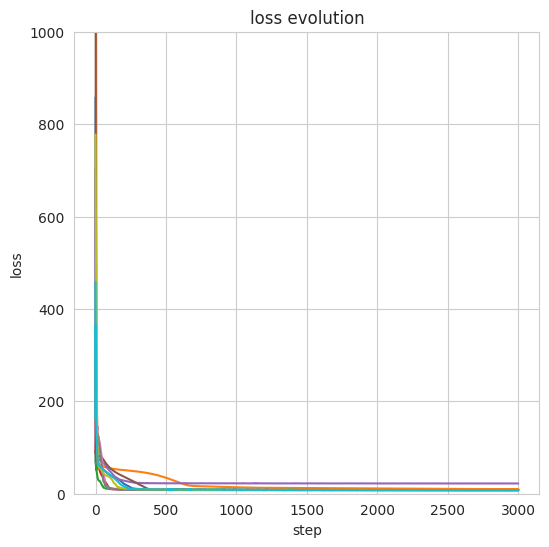


Relative errors:

theta_E: 0.18%
gamma: 4.52%
e1: 49.98%
e2: 112.81%
center_x: 3.17%
center_y: 0.11%
gamma1: 28.70%
gamma2: 103.83%




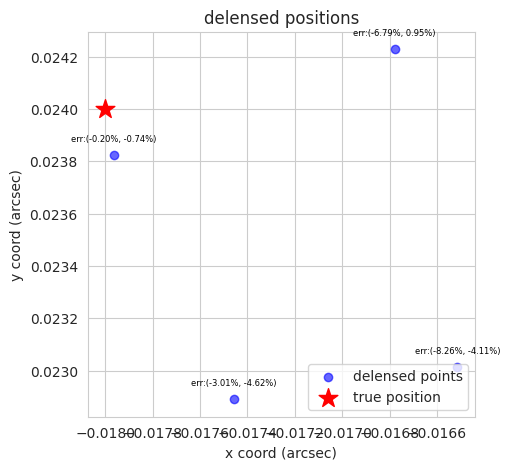


results when only the distance term is included in the loss with no prior --------------------------------------------------



  0%|          | 0/3000 [00:00<?, ?it/s]


Best parameters (only distance term):
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.76899374], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.9999647], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.08520569], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01300317], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.18086827], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.21431182], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.08518056], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01298588], dtype=float32)>}]

Relative errors:

theta_E: 412.66%
gamma: 47.37%
e1: 55.16%
e2: 260.77%
center_x: 1171.56%
center_y: 823.47%
gamma1: 8.22%
gamma2: 240.72%




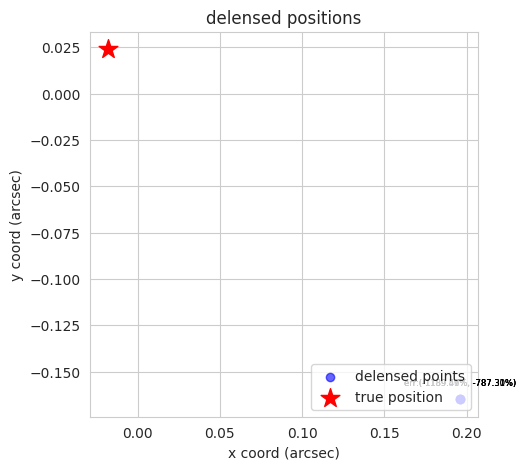


-simulation-

--------- simulation. comparing flux ratios difference ----------


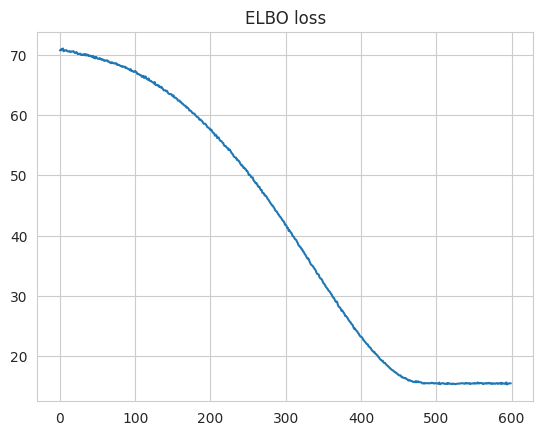


-simulation-

--------- simulation. comparing flux ratios difference ----------

----------------method: adaptative------------------



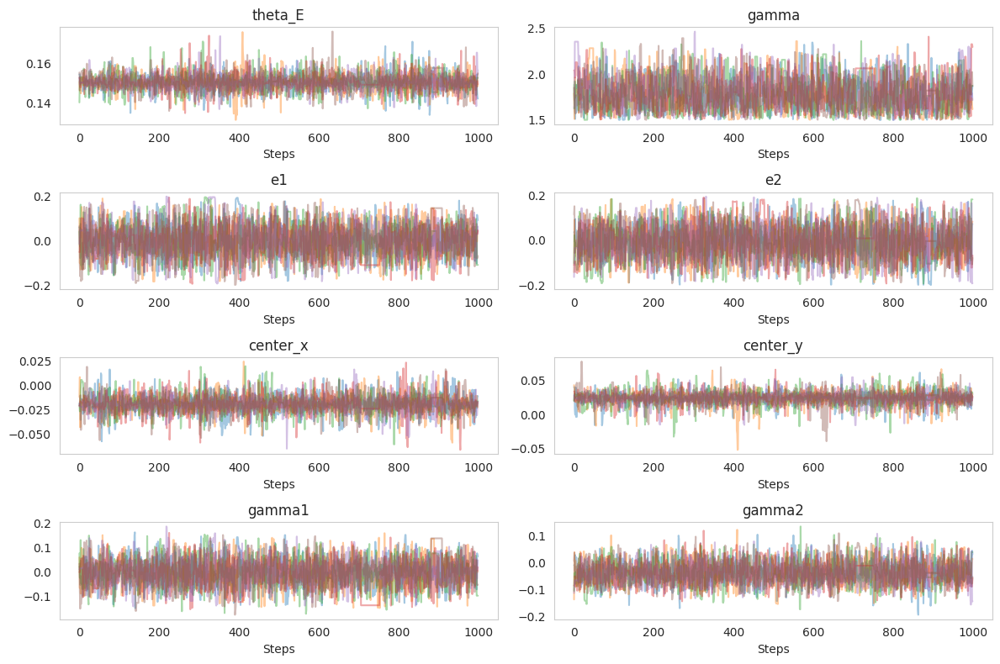


Rhat:
theta_E: 1.002908
gamma: 1.006230
e2: 1.003381
e1: 1.012793
center_y: 1.004187
center_x: 1.006549
gamma2: 1.001790
gamma1: 1.027803

ESS:
theta_E: 36092.417969
gamma: 9822.044922
e2: 17211.253906
e1: 5427.682129
center_y: 23773.003906
center_x: 9425.576172
gamma2: 25127.244141
gamma1: 2106.653320


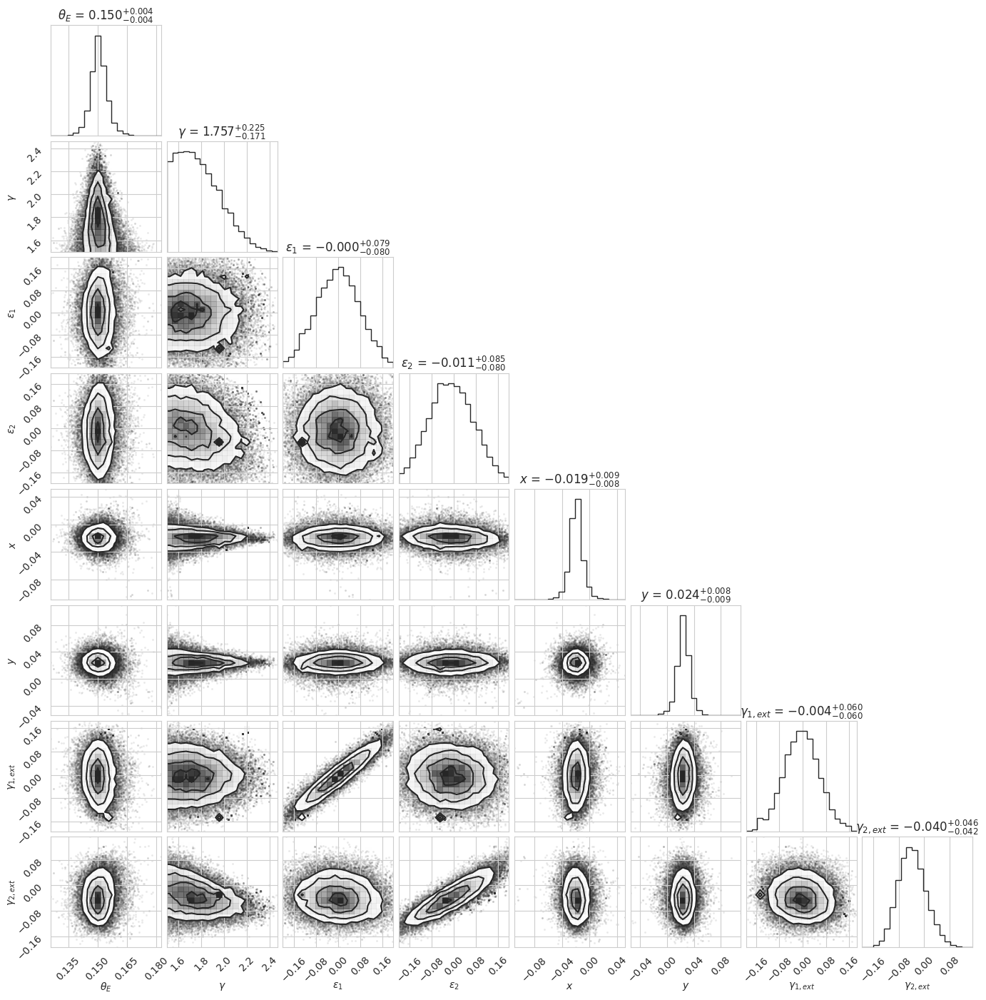

Parameter Means and Medians:
theta_E: mean = 0.151, median = 0.150
gamma: mean = 1.782, median = 1.757
e1: mean = -0.001, median = -0.000
e2: mean = -0.009, median = -0.011
center_x: mean = -0.019, median = -0.019
center_y: mean = 0.024, median = 0.024
gamma1: mean = -0.005, median = -0.004
gamma2: mean = -0.038, median = -0.040


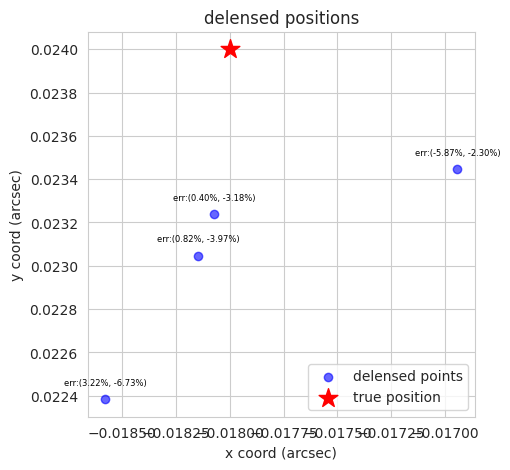

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/point-source-updates/F475W-epsf.npy'

In [41]:
# other system
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior_trunc_normal,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.0006
num_pix = 750
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]


analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix, weight_dist=500,weight_flux=500, truth_test=truth_test,
                             prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                             observed_data = None, simulation = True, flux_ratios = True)
analysis.run_map(n_map = 5000, n_steps = 3000)
analysis.run_vi()
samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)


-simulation-

--------- simulation. comparing flux ratios difference ----------

----------------method: adaptative------------------



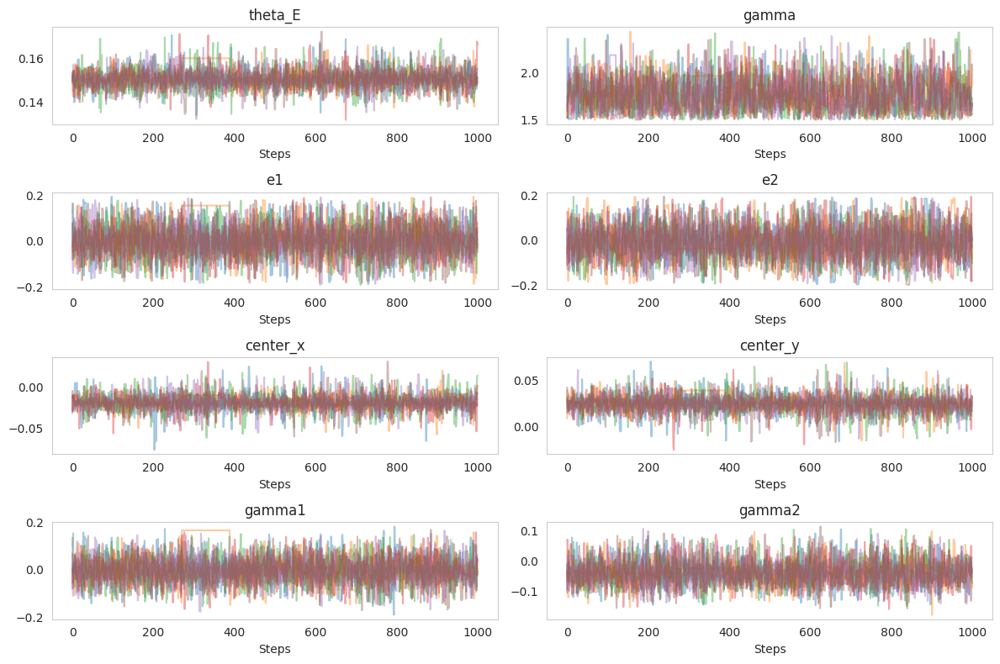


Rhat:
theta_E: 1.002162
gamma: 1.004911
e2: 1.002473
e1: 1.003842
center_y: 1.001602
center_x: 1.000831
gamma2: 1.001548
gamma1: 1.007591

ESS:
theta_E: 17542.347656
gamma: 11312.075195
e2: 17366.876953
e1: 12234.242188
center_y: 33236.761719
center_x: 32236.337891
gamma2: 31735.091797
gamma1: 6478.818848


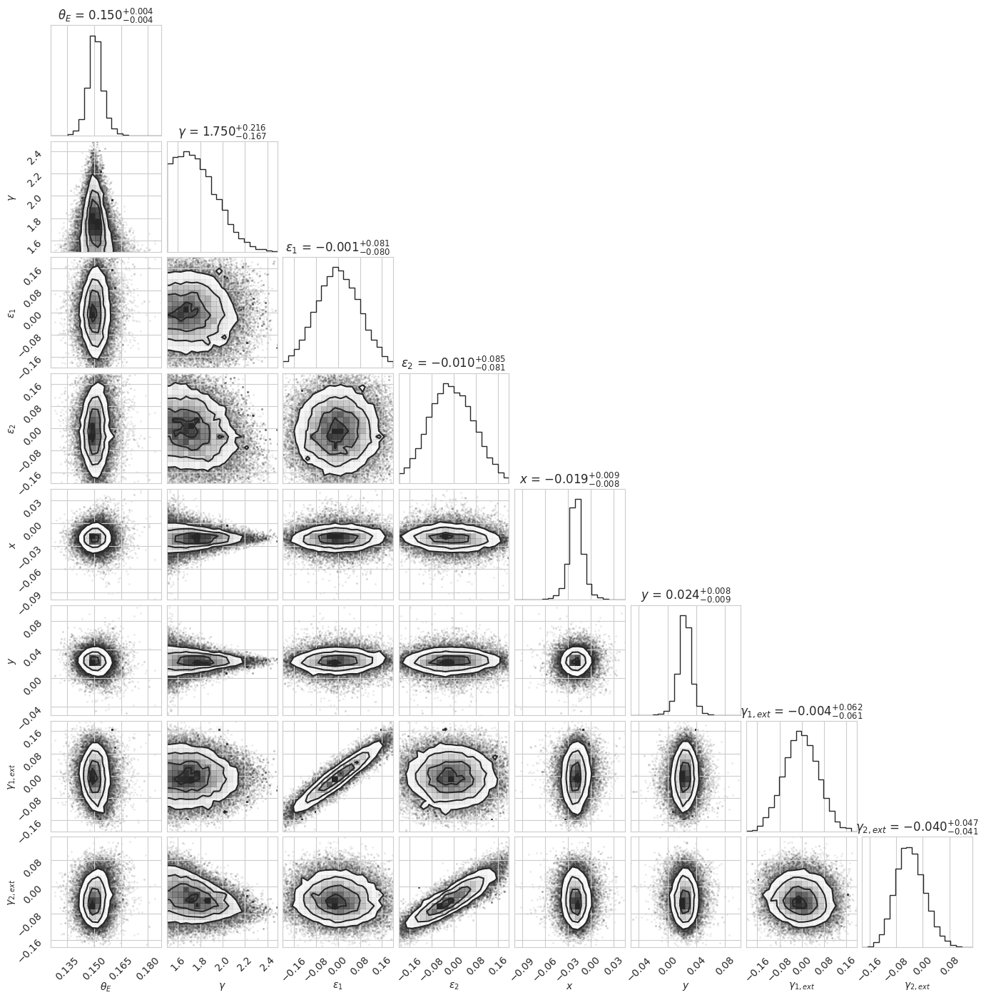

Parameter Means and Medians:
theta_E: mean = 0.151, median = 0.150
gamma: mean = 1.775, median = 1.750
e1: mean = -0.000, median = -0.001
e2: mean = -0.009, median = -0.010
center_x: mean = -0.019, median = -0.019
center_y: mean = 0.024, median = 0.024
gamma1: mean = -0.004, median = -0.004
gamma2: mean = -0.037, median = -0.040


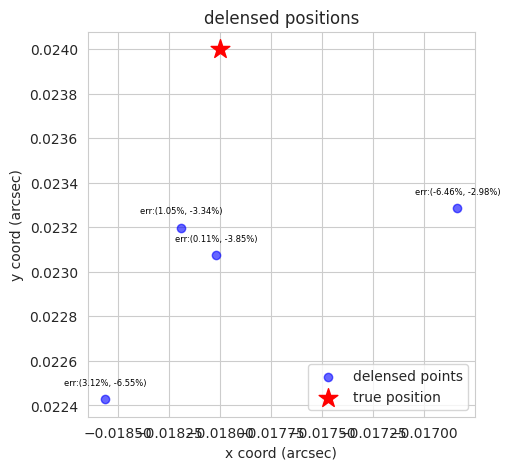

self.prob_model_output [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.15049757], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.7501922], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.0103354], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.00075582], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.02414828], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.01933476], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.03963535], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.00401194], dtype=float32)>}]


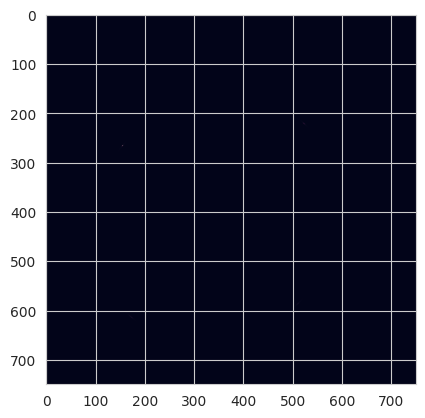

tf.Tensor(
[[0.00027288 0.00027418 0.00027543 ... 0.00028586 0.0002845  0.00028315]
 [0.00027438 0.00027563 0.00027694 ... 0.00028723 0.00028586 0.0002845 ]
 [0.00027582 0.00027714 0.0002784  ... 0.0002886  0.00028723 0.00028586]
 ...
 [0.00063812 0.00064269 0.00064715 ... 0.00030225 0.00030053 0.00029881]
 [0.00063387 0.00063827 0.00064285 ... 0.00030082 0.0002991  0.00029739]
 [0.00062966 0.00063402 0.00063857 ... 0.00029931 0.00029768 0.00029598]], shape=(750, 750), dtype=float32)
Brighest points reshaped into x, y:

x: tf.Tensor(
[[-0.1317    ]
 [ 0.08850001]
 [-0.1203    ]
 [ 0.08130001]], shape=(4, 1), dtype=float32)

y: tf.Tensor(
[[-0.0651    ]
 [-0.09209999]
 [ 0.14430001]
 [ 0.12750001]], shape=(4, 1), dtype=float32)

params [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.15049757], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.7501922], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.0103354],

/tmp/ipython-input-1218289324.py:171: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


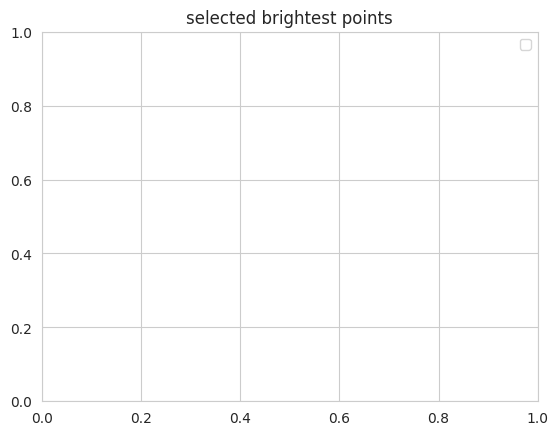

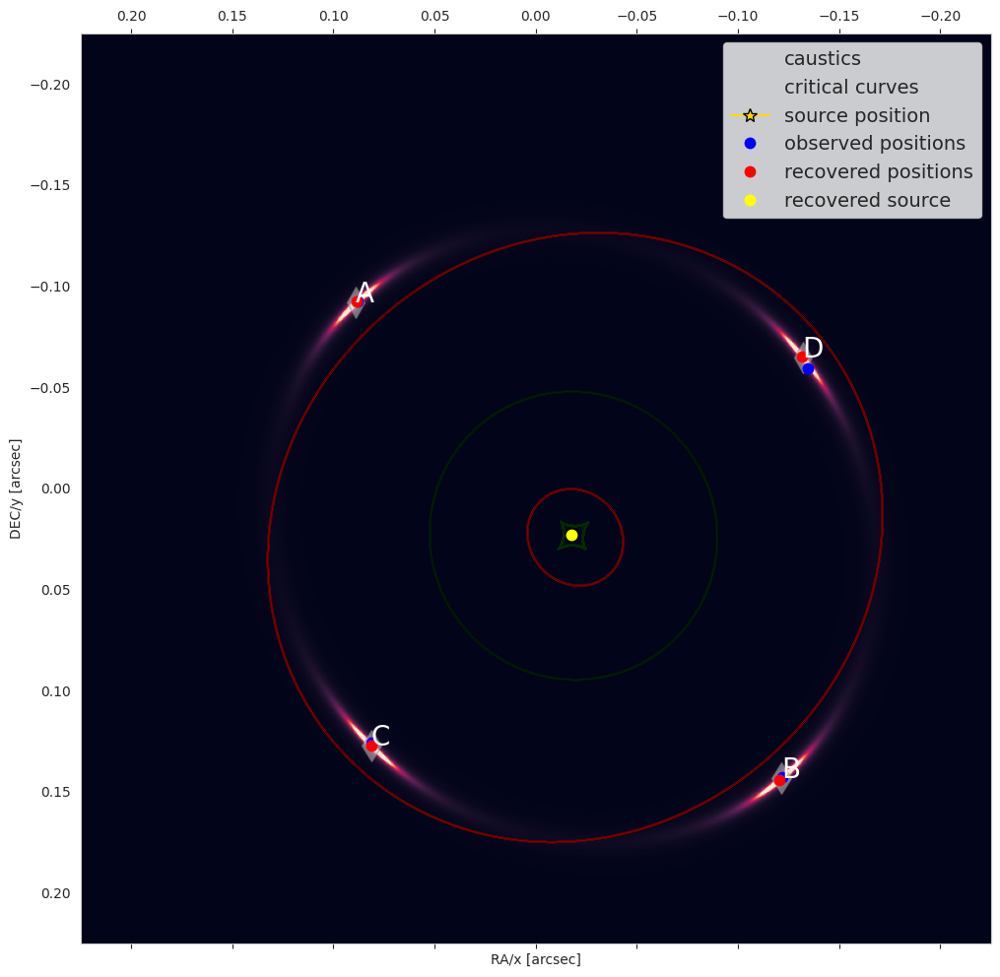


loss terms (in observed positions): tf.Tensor(
[[3.5071513e-04]
 [3.2843580e-04]
 [2.2927031e-04]
 [1.2142118e-05]
 [3.4931581e-06]
 [5.1739626e-06]], shape=(6, 1), dtype=float32)

flux ratios observed: tf.Tensor(
[[1.1979128]
 [1.0803423]
 [0.7711705]
 [0.9018539]
 [0.6437618]
 [0.7138205]], shape=(6, 1), dtype=float32)

flux ratios recovered (in observed positions): tf.Tensor(
[[1.3539994 ]
 [1.2265134 ]
 [0.87320775]
 [0.9058449 ]
 [0.64491004]
 [0.7119431 ]], shape=(6, 1), dtype=float32)
flux1/flux2: 13.03%
flux1/flux3: 13.53%
flux1/flux4: 13.23%
flux2/flux3: 0.44%
flux2/flux4: 0.18%
flux3/flux4: 0.26%

Predicted magnifications (in recovered positions). The ordering may have changed: tf.Tensor(
[[-19.84331 ]
 [ 20.494654]
 [ 23.150105]
 [-21.18635 ]], shape=(4, 1), dtype=float32)

Predicted magnifications (in observed positions): tf.Tensor(
[[ 21.108624]
 [-18.129936]
 [-19.048876]
 [ 22.590534]], shape=(4, 1), dtype=float32)


In [44]:
samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

In [45]:
  - If unc (detA) = std(detA):
1.14 ± 1.534
1.13 ± 1.560
0.91 ± 1.205
0.99 ± 1.385
0.80 ± 1.072
0.81 ± 1.114

SyntaxError: invalid character '±' (U+00B1) (ipython-input-2156661701.py, line 2)

In [ ]:
# todo: check unc for this simulation with all methods and write conclusion
# todo: implement my code for flux difference so we can do the same for snzwicky and write conclusion
# todo: write conclusions about fittinf the point and what we can say and what i tried and what i think
# todo: add good uncs in my slides

## check sample flux ratios






In [46]:
sns.set_style('dark')
num_pix = 750
delta_pix = 0.0006

truth = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]


def flux_ratios_unc(truth, samples_phys, reg):
    tens = prob_model.pack_bij.inverse(samples_phys)
    reshaped_tens = tf.reshape(tens, (-1, tens.shape[2]))
    reshaped_phys = prob_model.pack_bij.forward(reshaped_tens)

    # calculate HMC median
    median_values = prob_model.pack_bij.forward([tfp.stats.percentile(reshaped_tens, 50.0, axis=0)])

    # get brightest points using truth
    lens_omitted_img = lens_sim.simulate([truth[0], [], truth[2]])
    converter = BrightestPoints(number_of_images=4, num_pixels=num_pix, grid_size=250, delta_pix=delta_pix, supersample=1) # 40
    brightest_pixels = converter.find_brightest_points(lens_omitted_img)
    x_arcsec, y_arcsec = converter.pix_to_arcsec(brightest_pixels)
    x = tf.repeat(x_arcsec[..., tf.newaxis], [1], axis=-1)
    y = tf.repeat(y_arcsec[..., tf.newaxis], [1], axis=-1)

    # create flux ratios
    mag_sq_truth = tf.sqrt(tf.square(magnification(x, y, truth))) # sqrt
    #print("\nmag_sq_truth", mag_sq_truth)
    ratios = tf.expand_dims(mag_sq_truth, 1) / tf.expand_dims(mag_sq_truth, 0)
    #print("\nratios", ratios)
    mask = tf.linalg.band_part(tf.ones((4, 4), dtype=tf.bool), 0, -1)
    mask = tf.logical_and(mask, tf.logical_not(tf.linalg.diag(tf.ones(4, dtype=tf.bool))))
    upper_tri_ratios = tf.boolean_mask(ratios, mask)
    n = tf.shape(mag_sq_truth)[0]
    num_combinations = n * (n - 1) // 2
    ratios_truth = tf.reshape(upper_tri_ratios, [num_combinations, tf.shape(mag_sq_truth)[-1]])
    #print("\nratios_truth", ratios_truth)
    i, j = tf.meshgrid(tf.range(n), tf.range(n), indexing='ij')
    upper_triangle = tf.logical_and(i < j, tf.ones_like(i, dtype=bool))
    i, j = tf.boolean_mask(i, upper_triangle), tf.boolean_mask(j, upper_triangle)
    #print("\ni", i)
    #print("\nj", j)

    # gather determinants to recover predicted flux ratios
    det_sq = tf.sqrt(tf.square(determinant(x, y, reshaped_phys))) # sqrt
    gi = tf.gather(det_sq, i, axis=0)
    print("\ngi gathered:", gi)
    gj = tf.gather(det_sq, j, axis=0)
    print("\ngj gathered:", gj)
    print("\nI do gj/gi to recover flux ratios, where g is det. For truth ratios is flux_i/flux_j, so det_j/det_i.")
    recovered_ratios = gj / (gi + reg)

    # assets method 2 (sample)
    bound = 100000000  # very high value
    recovered_ratios = tf.where(recovered_ratios < bound, recovered_ratios, tf.constant(float('nan')))
    masked_ratios = tf.where(recovered_ratios < bound, recovered_ratios, tf.constant(float('nan')))

    max_values = tf.reduce_max(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('-inf'))), axis=1)
    min_values = tf.reduce_min(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('inf'))), axis=1)
    std_values = tf.math.reduce_std(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('inf'))), axis=1)

    # assets method 1 (error propagation)
    std_gi = tf.math.reduce_std(gi, axis=1)
    print("\n std_gi", std_gi)
    std_gj = tf.math.reduce_std(gj, axis=1)

    det_sq_median = tf.reshape(tf.sqrt(tf.square(determinant(x, y, median_values))), (-1,)) # sqrt
    gi_median = tf.gather(det_sq_median, i, axis=0)
    print("\n gi_median", gi_median)
    gj_median = tf.gather(det_sq_median, j, axis=0)
    median_ratios = gj_median/gi_median

    std_gi = tf.math.reduce_std(gi, axis=1)
    std_gj = tf.math.reduce_std(gj, axis=1)

    max_gi = tf.reduce_max(gi, axis = 1)
    min_gi = tf.reduce_min(gi, axis = 1)

    unc_gi_max = max_gi - gi_median
    unc_gi_min = gi_median - min_gi

    max_gj = tf.reduce_max(gj, axis = 1)
    min_gj = tf.reduce_min(gj, axis = 1)
    unc_gj_max = max_gj - gj_median
    unc_gj_min = gj_median - min_gj

    # ratios = gj/gi = detB/detA -> unc = sqrt[ [1/detA * unc(detB)]^2 + [detB/(detA)^2 * unc(detA)]^2 ]
    error_prop_std = tf.sqrt(((1/gi_median) * std_gj)**2 + ((gj_median/gi_median**2) * std_gi)**2)
    error_prop_max = tf.sqrt(((1/gi_median) * unc_gj_max)**2 + ((gj_median/gi_median**2) * unc_gi_max)**2)
    error_prop_min= tf.sqrt(((1/gi_median) * unc_gj_min)**2 + ((gj_median/gi_median**2) * unc_gi_min)**2)

    # method 1
    print("\nMethod 1 (Error propagation)")

    print("\n- Evaluate detA in the 4 positions using samples from HMC and check unc(detA) is small enough:")
    print("\nmax value of std(detA):", max(std_gi))
    print("\nmax value of max(detA)-detA(HMC median):", max(unc_gi_max))
    print("\nmax value of detA(HMC median)-min(detA):", max(unc_gi_min))

    print("\n- Error propagation for detB/detA: unc = sqrt[ [1/detA * unc(detB)]^2 + [detB/(detA)^2 * unc(detA)]^2]:")
    print("\n  - If unc (detA) = max(detA)-detA(HMC median), detA(HMC median)-min(detA):")
    print("\n    (But using max and min is not justified in error propagation, so I ignore it for now)")

    median_ratios = median_ratios.numpy()
    error_prop_max = error_prop_max.numpy()
    error_prop_min = error_prop_min.numpy()
    for value, plus_uncertainty, minus_uncertainty in zip(median_ratios, error_prop_max, error_prop_min):
        print(f"{value:.3f} +{plus_uncertainty:.3f}/-{minus_uncertainty:.3f}")
    print("\n  - If unc (detA) = std(detA):")
    error_prop_std = error_prop_std.numpy()
    for value, unc in zip(median_ratios, error_prop_std):
      print(f"{value:.2f} ± {unc:.3f}")
    print("\n  - If unc (detA) = std(detA) and we include the covariance term, unc = sqrt[ [1/detA * unc(detB)]^2 + [detB/(detA)^2 * unc(detA)]^2 + 2*[1/detA * detB/(detA)^2 * cov(detA, detB)] ] :")

    print("\n gi", gi.shape)
    print("\n gj", gj.shape)
    cov = tfp.stats.covariance(gi, gj, sample_axis=1, event_axis = None)
    print("\n cov", cov)
    error_prop_std_with_cov = tf.sqrt(((1/gi_median) * std_gj)**2 + ((gj_median/gi_median**2) * std_gi)**2 + 2* (1/gi_median)*(gj_median/gi_median**2)*cov)
    error_prop_std_with_cov = error_prop_std_with_cov.numpy()
    for value, unc in zip(median_ratios, error_prop_std_with_cov):
      print(f"{value:.2f} ± {unc:.3f}")




    # method 2
    print("\nMethod 2 (Sample)")
    print("\n- Sample 1/detA")
    print("\n  - Using max(1/detA)-1/detA(HMC median), 1/detA(HMC median)-min(1/detA):")
    unc_plus = max_values - median_ratios
    unc_minus = median_ratios - min_values
    unc_plus = unc_plus.numpy()
    unc_minus = unc_minus.numpy()
    for value, plus_uncertainty, minus_uncertainty in zip(median_ratios, unc_plus, unc_minus):
        print(f"{value:.3f} +{plus_uncertainty:.3f}/-{minus_uncertainty:.3f}")
    print("\n  - Using std(1/detA):",)
    std_val = std_values.numpy()
    for value, unc in zip(median_ratios, std_val):
      print(f"{value:.3f} ± {unc:.3f}")

    #det_sq_median = tf.reshape(tf.sqrt(tf.square(determinant(x, y, median_values))), (-1,)) # sqrt
    #print("\n det_sq_median", det_sq_median)
    #gi_median = tf.gather(det_sq_median, i, axis=0)
    #gj_median = tf.gather(det_sq_median, j, axis=0)
    #median_ratios = gj_median/gi_median
    #print("\nmedian_ratios", median_ratios)
    #error_prop = tf.sqrt(((1/gi_median) * std_gj)**2 + ((gj_median/gi_median**2) * std_gi)**2)

    num_blocks = masked_ratios.shape[0]
    fig, axes = plt.subplots(1, num_blocks, figsize=(20, 3))
    for i in range(num_blocks):
        valid_values = masked_ratios[i][~tf.math.is_nan(masked_ratios[i])]
        axes[i].hist(valid_values.numpy(), bins=30, color='dodgerblue', alpha=0.7)
        max_val = max_values[i].numpy()
        min_val = min_values[i].numpy()
        std_val = std_values[i].numpy()
        axes[i].set_title(f'Ratio {i+1}\nMax: {max_val:.2f}, Min: {min_val:.2f}, Std: {std_val:.2f}')
    plt.tight_layout()
    fig.suptitle('Flux ratios evaluated in HMC samples', fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 1.05])
    plt.show()

    #for i in range(num_blocks):
    #    print(f'ratio {i+1} - max: {max_values[i].numpy():.2f} min: {min_values[i].numpy():.2f} std: {std_values[i].numpy():.2f}')


    #print(f'Error propagation: {error_prop}')






gi gathered: tf.Tensor(
[[0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]], shape=(6, 50000), dtype=float32)

gj gathered: tf.Tensor(
[[0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]], shape=(6, 50000), dtype=float32)

I d

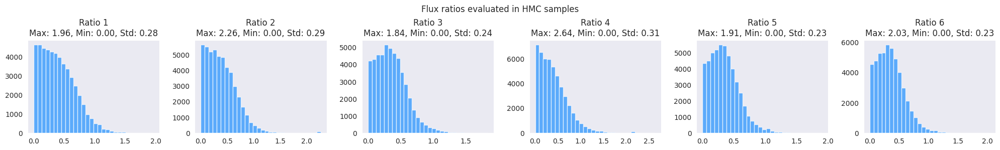


gi gathered: tf.Tensor(
[[0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]], shape=(6, 50000), dtype=float32)

gj gathered: tf.Tensor(
[[0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]], shape=(6, 50000), dtype=float32)

I d

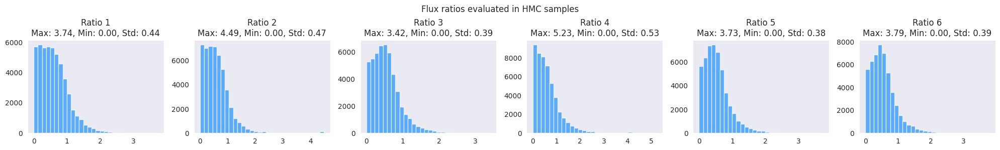


gi gathered: tf.Tensor(
[[0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]], shape=(6, 50000), dtype=float32)

gj gathered: tf.Tensor(
[[0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]], shape=(6, 50000), dtype=float32)

I d

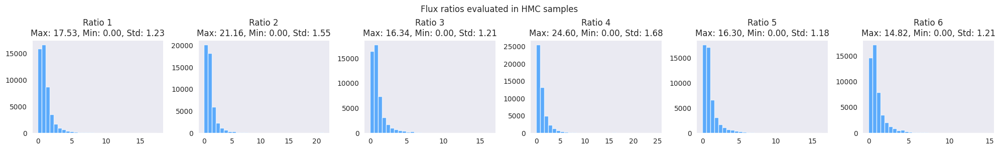


gi gathered: tf.Tensor(
[[0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]], shape=(6, 50000), dtype=float32)

gj gathered: tf.Tensor(
[[0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]], shape=(6, 50000), dtype=float32)

I d

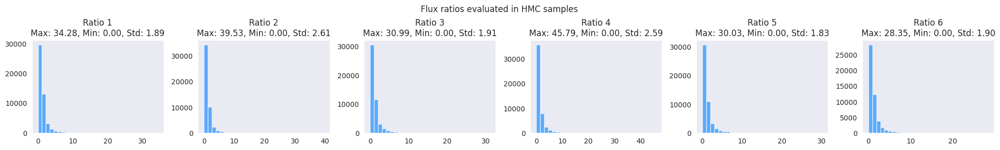


gi gathered: tf.Tensor(
[[0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.08160295 0.0040399  0.07837606 ... 0.06519371 0.05957852 0.03238666]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]], shape=(6, 50000), dtype=float32)

gj gathered: tf.Tensor(
[[0.07274519 0.01838117 0.06584772 ... 0.04652892 0.12026118 0.04737322]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.03759429 0.00920726 0.1499141  ... 0.0627073  0.02536628 0.05943935]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]
 [0.02744818 0.08403046 0.07417273 ... 0.03528933 0.08139108 0.02100018]], shape=(6, 50000), dtype=float32)

I d

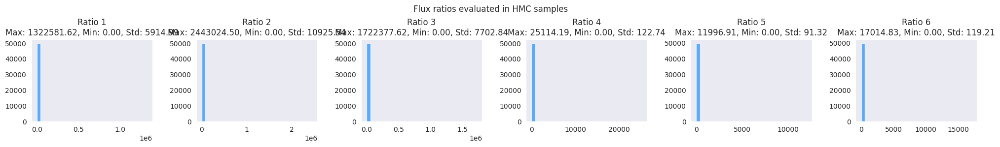

In [47]:
# tens = prob_model.pack_bij.inverse(samples_phys)
# reshaped_tens = tf.reshape(tens, (-1, tens.shape[2]))

# reshaped_phys = prob_model.pack_bij.forward(reshaped_tens)


for reg in [0.1, 0.05, 0.01, 0.005, 0.]:
    flux_ratios_unc(truth, samples_phys, reg = reg)

In [48]:
# conclusion: directly sampling doesn't give consistent results with regularization.
# error propagation with std(detA) seems consistent, but still around 1. High uncertainties when sampling directly (method 2) is a consequence of some values dividing by 0.
# High uncertainties when doing error propagation (method 1) seems a consequence of denominators in the error prop formula being high, as expected since we are close to CC. std of detA are small, in which sense?
# First, we need to make sure that f(detA, detB) = detA/detB is differentiable around the median (detA, detB) = (x0, y0) in an interval of length sigma(detA), sigma(detB). Since gi_median - std_gi is not zero in any case,
# then the taylor expansion is justified.
# Second, by doing a taylor expansion and truncating at first order, the error is of order around [sigma(detA)]^2 + [sigma(detB)]^2. max value of sigma(detA) is 0.052202787.
# todo: include covariance is the only thing i need to check.

Positive Covariance: 4.0
Negative Covariance: -4.0
Zero Covariance: 0.0


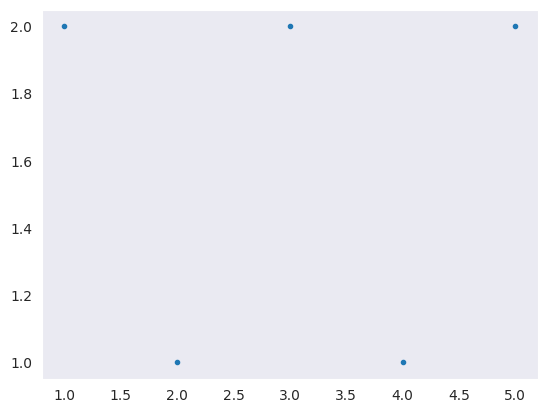

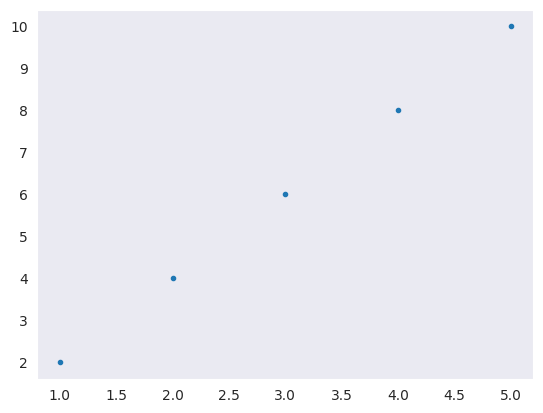

In [49]:
# check covariance
tensor1 = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0])
tensor2 = tf.constant([2.0, 4.0, 6.0, 8.0, 10.0])
tensor3 = tf.constant([10.0, 8.0, 6.0, 4.0, 2.0])
tensor4 = tf.constant([2.0, 1.0, 2.0, 1.0, 2.0])


cov_positive = tfp.stats.covariance(tensor1, tensor2, event_axis = None)
cov_negative = tfp.stats.covariance(tensor1, tensor3, event_axis = None)
cov_zero = tfp.stats.covariance(tensor1, tensor4, event_axis = None)

print(f"Positive Covariance: {cov_positive.numpy()}")
print(f"Negative Covariance: {cov_negative.numpy()}")
print(f"Zero Covariance: {cov_zero.numpy()}")

plt.plot(tensor1, tensor4, ".")
plt.show()
plt.plot(tensor1, tensor2, ".")

## mass in CC and check regimes

In [50]:
import jax.numpy as jnp

from lenstronomy.LensModel.lens_model import LensModel
from lenstronomy.Plots.lens_plot import lens_model_plot
import lenstronomy.Util.simulation_util as sim_util
from lenstronomy.Data.imaging_data import ImageData
from lenstronomy.LensModel.lens_model_extensions import LensModelExtensions

from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from scipy.spatial import ConvexHull



def compute_outer_curve(critical_curves, radius):
    distances = jnp.sqrt(critical_curves[0]**2 + critical_curves[1]**2)
    mask = distances > radius
    outer_x = jnp.where(mask, critical_curves[0], jnp.nan)
    outer_y = jnp.where(mask, critical_curves[1], jnp.nan)
    return outer_x, outer_y


def compute_total_convergence(kappa_map, inside_mask, delta_pix):
    return jnp.sum(kappa_map * inside_mask) * (delta_pix**2)

def mass_in_cc(params, delta_pix, num_pix, radius=0.05, plot=True):
    lens_model_list = ['EPL', 'SHEAR']
    lensModel = LensModel(lens_model_list=lens_model_list)
    kwargs_main_lens = {
        'theta_E': params['theta_E'],
        'gamma': params['gamma'],
        'e1': params['e1'],
        'e2': params['e2'],
        'center_x': params['center_x'],
        'center_y': params['center_y'],
    }
    kwargs_shear = {
        'gamma1': params['gamma1'],
        'gamma2': params['gamma2'],
    }
    kwargs_lens = [kwargs_main_lens, kwargs_shear]
    print("\n kwargs_lens", kwargs_lens)
    sim_config = SimulatorConfig(delta_pix=delta_pix, num_pix=num_pix, supersample=supersample)
    lens_sim = LensSimulator(phys_model, sim_config, bs=1)
    #sim_image = lens_sim.simulate([kwargs_lens])
    print("\n params", params)
    sim_image = lens_sim.simulate([kwargs_lens, [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],])
    extent = [-num_pix / 2 * delta_pix, num_pix / 2 * delta_pix, -num_pix / 2 * delta_pix, num_pix / 2 * delta_pix]

    lensModelExt = LensModelExtensions(lensModel)
    critical_curves = lensModelExt.critical_curve_tiling(kwargs_lens=kwargs_lens, compute_window=1, start_scale=0.005)
    outer_x, outer_y = compute_outer_curve(jnp.array(critical_curves), radius)
    outer_x = jnp.array(outer_x[~jnp.isnan(outer_x)])
    outer_y = jnp.array(outer_y[~jnp.isnan(outer_y)])

    points = jnp.column_stack((outer_x, outer_y))
    hull = ConvexHull(np.array(points))
    hull_indices = hull.vertices
    sorted_points = points[hull_indices]
    ellipse_polygon = Polygon(sorted_points)

    x_grid = jnp.linspace(-num_pix / 2 * delta_pix, num_pix / 2 * delta_pix, num_pix)
    y_grid = jnp.linspace(-num_pix / 2 * delta_pix, num_pix / 2 * delta_pix, num_pix)
    x_grid, y_grid = jnp.meshgrid(x_grid, y_grid)
    points_grid = jnp.vstack((x_grid.ravel(), y_grid.ravel()))

    inside_mask_flat = jnp.array([ellipse_polygon.contains(Point(p)) for p in np.array(points_grid.T)])
    inside_mask = inside_mask_flat.reshape(num_pix, num_pix)

    kappa_map = lensModel.kappa(np.array(x_grid), np.array(y_grid), kwargs_lens).reshape(num_pix, num_pix)
    total_convergence = compute_total_convergence(jnp.array(kappa_map), jnp.array(inside_mask), delta_pix)

    if plot:
        fig, axes = plt.subplots(1, 4, figsize=(40, 10))
        title_fontsize = 30
        tick_fontsize = 20
        ax = axes[0]
        ax.imshow(sim_image, origin='lower', vmin=0, vmax=1, extent=extent)
        lens_model_plot(ax, lensModel, kwargs_lens, numPix=num_pix, deltaPix=delta_pix, with_caustics=True, with_convergence=False)
        ax.set_title('Caustic and CC', fontsize=title_fontsize)
        ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
        ax.grid(False)
        ax = axes[1]
        ax.imshow(sim_image, origin='lower', vmin=0, vmax=1, extent=extent)
        ax.plot(critical_curves[0], critical_curves[1], ".", ms=0.8)
        ax.set_title('Inner and Outer CC', fontsize=title_fontsize)
        ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
        ax.grid(False)
        ax = axes[2]
        ax.imshow(sim_image, origin='lower', vmin=0, vmax=1, extent=extent)
        ax.plot(outer_x, outer_y, ".", ms=0.8)
        ax.set_title('Outer CC', fontsize=title_fontsize)
        ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
        ax.grid(False)
        ax = axes[3]
        ax.imshow(inside_mask, origin='lower')
        ax.set_title(f"Total convergence inside: {total_convergence:.4f}", fontsize=title_fontsize)
        ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
        ax.grid(False)
        plt.tight_layout()
        plt.show()

    return total_convergence

def batch_mass_in_cc(batch_params, delta_pix, num_pix, radius=0.05):
    results = []
    for params in batch_params:
        result = mass_in_cc(params, delta_pix, num_pix, radius)
        results.append(result)
    return jnp.array(results)

def compute_uncertainty(samples, delta_pix, num_pix, radius=0.05, plot=False):
    def extract_params(samples, chain_index, sample_index):
        return {
            'theta_E': float(samples[0][0]['theta_E'][chain_index, sample_index].numpy()),
            'gamma': float(samples[0][0]['gamma'][chain_index, sample_index].numpy()),
            'e1': float(samples[0][0]['e1'][chain_index, sample_index].numpy()),
            'e2': float(samples[0][0]['e2'][chain_index, sample_index].numpy()),
            'center_x': float(samples[0][0]['center_x'][chain_index, sample_index].numpy()),
            'center_y': float(samples[0][0]['center_y'][chain_index, sample_index].numpy()),
            'gamma1': float(samples[0][1]['gamma1'][chain_index, sample_index].numpy()),
            'gamma2': float(samples[0][1]['gamma2'][chain_index, sample_index].numpy()),
        }

    num_chains = 2
    num_samples_per_chain = 15
    all_results = []
    for chain_index in range(num_chains):
        for sample_index in range(num_samples_per_chain):
            params_set = extract_params(samples, chain_index, sample_index)
            print(params_set)
            all_results.append(params_set)
    batch_results = batch_mass_in_cc(all_results, delta_pix, num_pix, radius)
    min_value = jnp.min(batch_results)
    max_value = jnp.max(batch_results)
    if plot:
        plt.figure(figsize=(10, 6))
        plt.hist(np.array(batch_results), bins=30,)
        plt.title('total convergence')
        plt.xlabel('')
        plt.ylabel('')
        plt.show()
    return min_value, max_value, batch_results

delta_pix = 0.0006
num_pix = 750
radius = 0.05
min_value, max_value, all_results = compute_uncertainty(samples_phys, delta_pix, num_pix, radius, plot=True)
print(f"Min value: {min_value}, Max value: {max_value}")

Output hidden; open in https://colab.research.google.com to view.

# STRIDES: Automated uniform models for 30 quadruply imaged quasars

## J0029-3814

In [51]:
lens_prior = tfd.JointDistributionSequential( #UNIFORM PRIOR
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.5, high = 1.),
           # gamma=tfd.Uniform(1.8, 2.3,),
           # gamma=tfd.Uniform(1.5, 2.5,),
           # gamma=tfd.Uniform(1., 3.,),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.7, 2.3),
           # e1=tfd.Uniform(-0.2, 0.2),
           # e2=tfd.Uniform(-0.2, 0.2),
          e1=tfd.Normal(0, 0.1),
          e2=tfd.Normal(0, 0.1),
          #  e1=tfd.Uniform(-0.2, 0.2),
          #  e2=tfd.Uniform(-0.2, 0.2),
          center_x=tfd.Normal(0, 0.1),
          center_y=tfd.Normal(0, 0.1),
           # center_x=tfd.Uniform(-0.2, 0.2),
           # center_y=tfd.Uniform(-0.2, 0.2),
          )
      ),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Normal(0, 0.1),
           gamma2=tfd.Normal(0, 0.1),
          # gamma1=tfd.Uniform(-0.2, 0.2),
          # gamma2=tfd.Uniform(-0.2, 0.2),
          ),
       ),
  ]
  )

In [52]:
x_quasar = tf.constant([1.156, -0.592, -0.975, -0.321])
y_quasar = tf.constant([-0.513, -0.490, 0.071, 0.384])

mags = tf.constant([1.56, 1.05, 2.70, 0.93])

# quasar
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.005
num_pix = 800
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_quasar, y_quasar], mags**2]


weight_dist_values = [1e2, 5e2, 1e3, 5e3, 1e4,]
weight_flux_values = [1e2, 5e2, 1e3, 5e3, 1e4,]
for w_dist in weight_dist_values:
    for w_flux in weight_flux_values:
        print("\nModel:")
        print("\n-------------- w_dist-------------:", w_dist)
        print("\n-------------- w_flux-------------:", w_flux)

        analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                                     weight_dist=w_dist,weight_flux=w_flux,
                                     truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                                     observed_data = observed_data, simulation = False, flux_ratios = True)
        analysis.run_map(n_map = 5000, n_steps = 3000)
        analysis.run_vi()
        samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

Output hidden; open in https://colab.research.google.com to view.


--- Modeling a real system ----


  0%|          | 0/3000 [00:00<?, ?it/s]


----- real system. comparing flux ratio difference ----

Best parameters:
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.74802583], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.8993942], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.08927748], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.1335503], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.09305781], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.25252953], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.15183918], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.25635684], dtype=float32)>}]


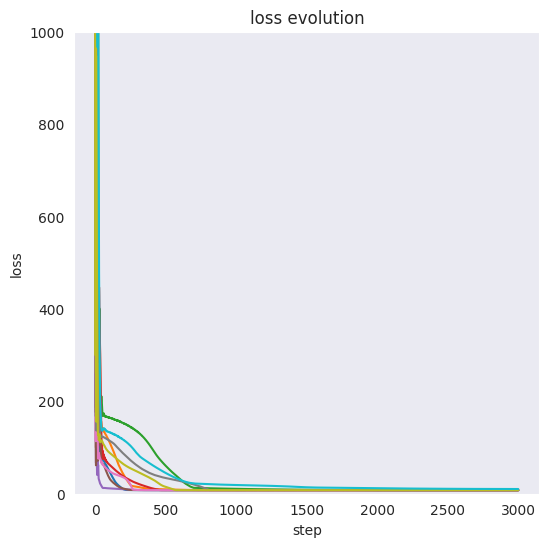


Relative errors:

theta_E: 398.68%
gamma: 0.03%
e1: 560.52%
e2: 68.45%
center_x: 1162.65%
center_y: 472.23%
gamma1: 2036.31%
gamma2: 507.36%




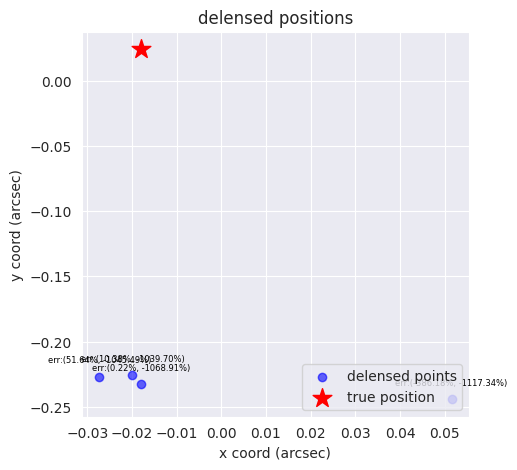


results when only the distance term is included in the loss with no prior --------------------------------------------------



  0%|          | 0/3000 [00:00<?, ?it/s]


Best parameters (only distance term):
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.973818], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.999714], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.1285795], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.10531417], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.18805759], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.10534028], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.12860355], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.10531145], dtype=float32)>}]

Relative errors:

theta_E: 549.21%
gamma: 47.38%
e1: 263.15%
e2: 342.60%
center_x: 626.70%
center_y: 852.23%
gamma1: 777.60%
gamma2: 414.41%




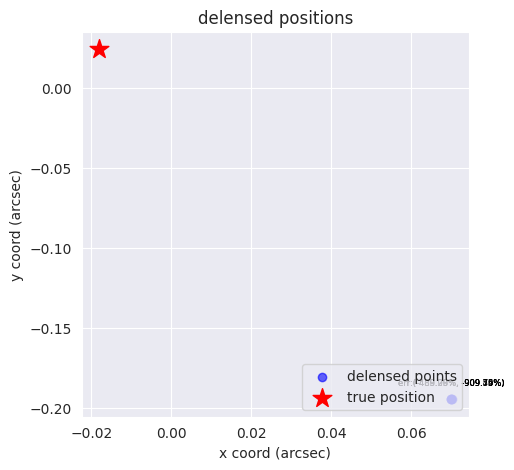


----- real system. comparing flux ratio difference ----


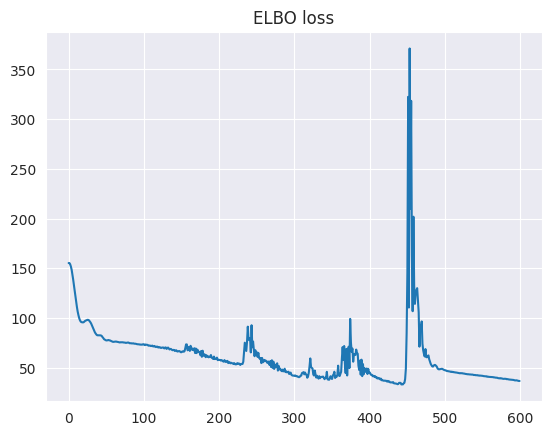


----- real system. comparing flux ratio difference ----

----------------method: adaptative------------------



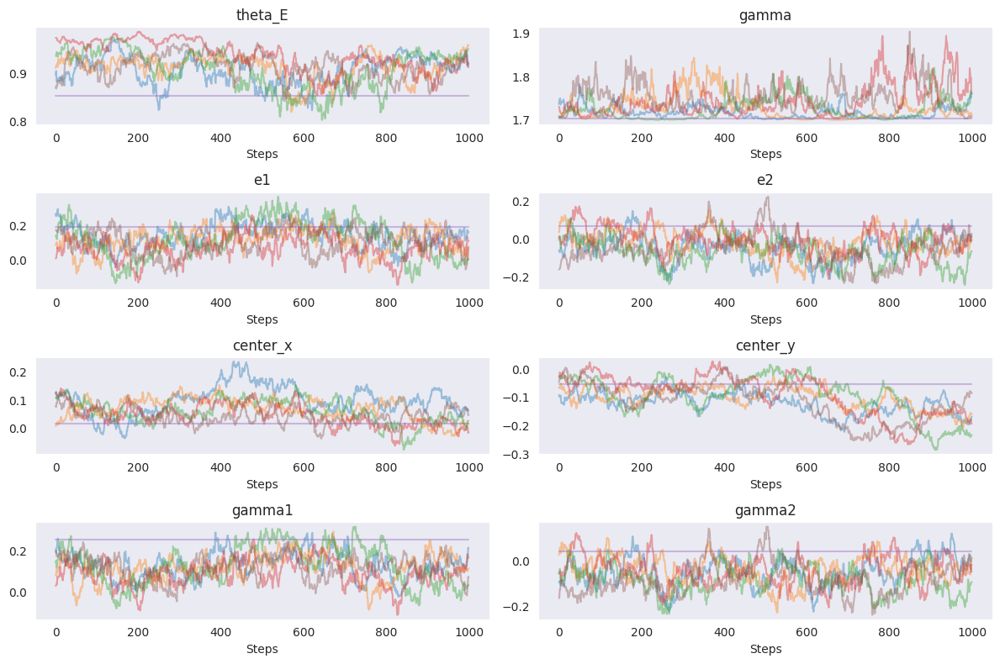


Rhat:
theta_E: 2.330600
gamma: 1.717498
e2: 1.353803
e1: 1.329939
center_y: 1.735444
center_x: 2.056892
gamma2: 1.358261
gamma1: 1.764171

ESS:
theta_E: 88.261497
gamma: 120.910385
e2: 193.597778
e1: 203.952484
center_y: 119.182495
center_x: 98.160889
gamma2: 191.816071
gamma1: 116.585098


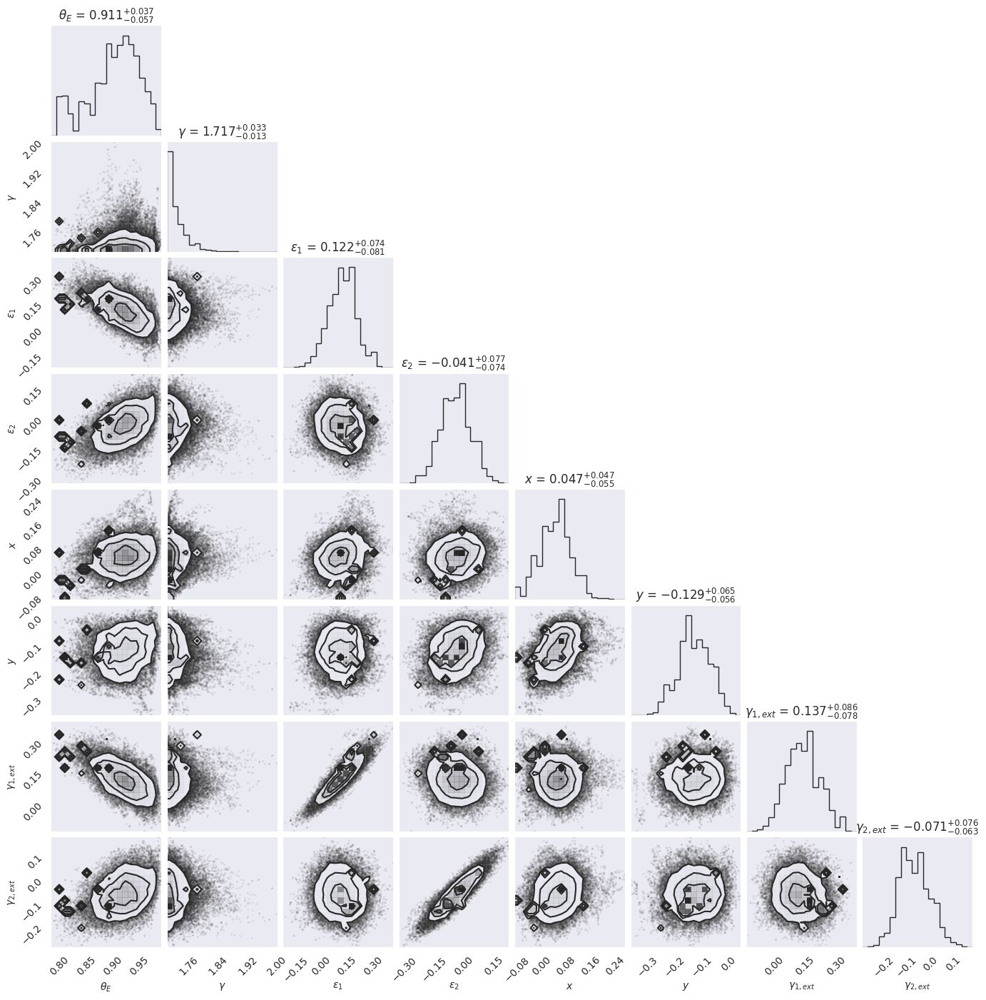

Parameter Means and Medians:
theta_E: mean = 0.903, median = 0.911
gamma: mean = 1.726, median = 1.717
e1: mean = 0.122, median = 0.122
e2: mean = -0.043, median = -0.041
center_x: mean = 0.045, median = 0.047
center_y: mean = -0.129, median = -0.129
gamma1: mean = 0.141, median = 0.137
gamma2: mean = -0.067, median = -0.071


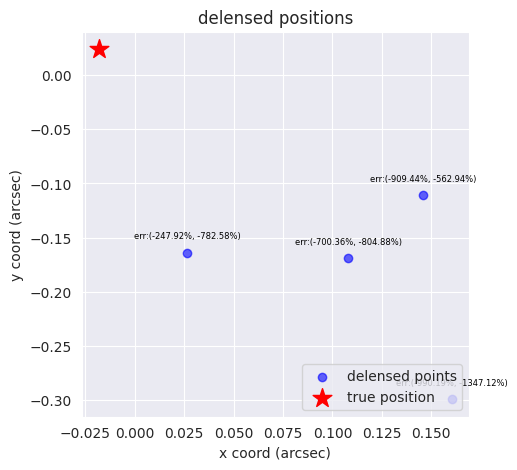

self.prob_model_output [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.91050345], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.7166916], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.04127988], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.12231106], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.12906912], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.04683328], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.07114396], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.13739167], dtype=float32)>}]


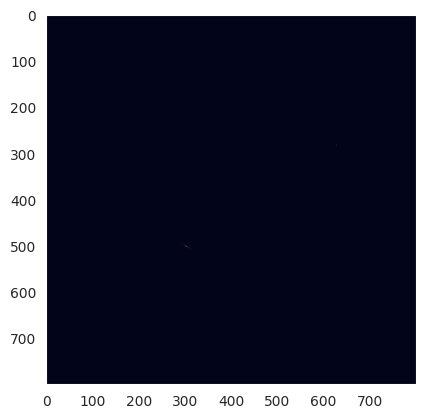

tf.Tensor(
[[0.00014645 0.00014694 0.00014743 ... 0.00028587 0.00028491 0.00028397]
 [0.00014711 0.0001476  0.0001481  ... 0.00028757 0.00028662 0.00028566]
 [0.00014778 0.00014827 0.00014877 ... 0.00028929 0.00028833 0.00028737]
 ...
 [0.00016482 0.00016525 0.00016565 ... 0.00012745 0.00012709 0.00012676]
 [0.00016404 0.00016447 0.0001649  ... 0.00012685 0.00012651 0.00012615]
 [0.00016329 0.00016368 0.00016411 ... 0.00012624 0.00012591 0.00012558]], shape=(800, 800), dtype=float32)
Brighest points reshaped into x, y:

x: tf.Tensor(
[[-0.47749996]
 [ 1.1425    ]
 [-0.5025    ]
 [-0.5025    ]], shape=(4, 1), dtype=float32)

y: tf.Tensor(
[[ 0.5125]
 [-0.5775]
 [ 0.4975]
 [ 0.5025]], shape=(4, 1), dtype=float32)

params [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.91050345], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.7166916], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.04127988], dtype=float32)

/tmp/ipython-input-1218289324.py:171: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


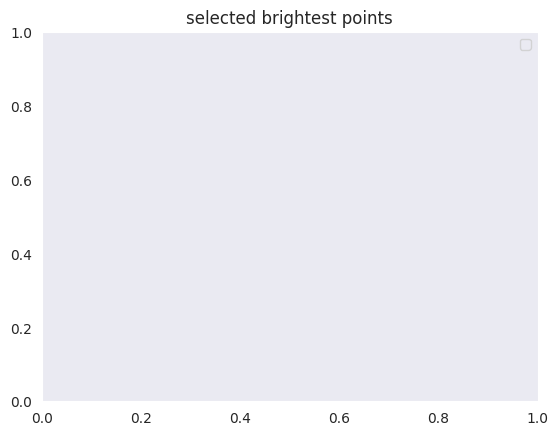

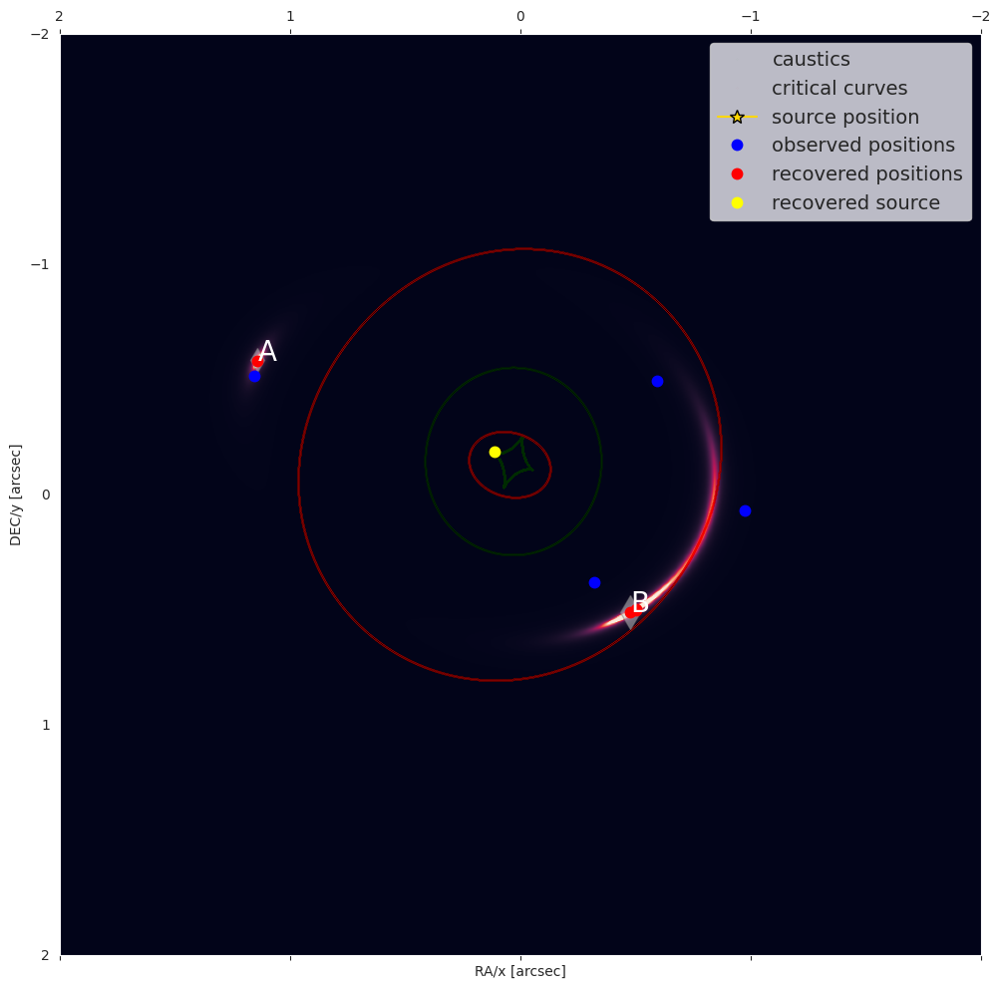


loss terms (in observed positions): tf.Tensor(
[[0.01976664]
 [0.00074371]
 [0.01764799]
 [0.00224569]
 [0.00754881]
 [0.0113795 ]], shape=(6, 1), dtype=float32)

flux ratios observed: tf.Tensor(
[[2.207347  ]
 [0.3338271 ]
 [2.8137355 ]
 [0.15123454]
 [1.2747136 ]
 [8.42872   ]], shape=(6, 1), dtype=float32)

flux ratios recovered (in observed positions): tf.Tensor(
[[1.0223025 ]
 [0.28924063]
 [1.7557074 ]
 [0.28293055]
 [1.717405  ]
 [6.070058  ]], shape=(6, 1), dtype=float32)
flux1/flux2: 53.69%
flux1/flux3: 13.36%
flux1/flux4: 37.60%
flux2/flux3: 87.08%
flux2/flux4: 34.73%
flux3/flux4: 27.98%

observed_magnifications SN Zicky: tf.Tensor([0.10399999 0.07       0.18       0.062     ], shape=(4,), dtype=float32)

Predicted magnifications (in recovered positions). The ordering may have changed: tf.Tensor(
[[-28.81148 ]
 [  7.421688]
 [-34.41874 ]
 [-34.731014]], shape=(4, 1), dtype=float32)

Predicted magnifications (in observed positions): tf.Tensor(
[[ 7.7428513]
 [-7.657927 ]
 [14

In [53]:
x_quasar = tf.constant([1.156, -0.592, -0.975, -0.321])
y_quasar = tf.constant([-0.513, -0.490, 0.071, 0.384])

mags = tf.constant([1.56, 1.05, 2.70, 0.93])

# quasar
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.005
num_pix = 800
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_quasar, y_quasar], mags**2]




analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                              weight_dist=100,weight_flux=1000,
                              truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                              observed_data = observed_data, simulation = False, flux_ratios = True)
analysis.run_map(n_map = 5000, n_steps = 3000)
analysis.run_vi()
samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

## mass in CC for real systems

In [54]:
def compute_outer_curve(critical_curves, radius):
    distances = jnp.sqrt(critical_curves[0]**2 + critical_curves[1]**2)
    mask = distances > radius
    outer_x = jnp.where(mask, critical_curves[0], jnp.nan)
    outer_y = jnp.where(mask, critical_curves[1], jnp.nan)
    return outer_x, outer_y


def compute_total_convergence(kappa_map, inside_mask, delta_pix):
    return jnp.sum(kappa_map * inside_mask) * (delta_pix**2)

def mass_in_cc(params, delta_pix, num_pix, radius=0.05, plot=True):

    lens_model_list = ['EPL', 'SHEAR']
    lensModel = LensModel(lens_model_list=lens_model_list)
    kwargs_main_lens = {
        'theta_E': params['theta_E'],
        'gamma': params['gamma'],
        'e1': params['e1'],
        'e2': params['e2'],
        'center_x': params['center_x'],
        'center_y': params['center_y'],
    }
    kwargs_shear = {
        'gamma1': params['gamma1'],
        'gamma2': params['gamma2'],
    }
    kwargs_lens = [kwargs_main_lens, kwargs_shear]
    print("\n kwargs_lens", kwargs_lens)
    sim_config = SimulatorConfig(delta_pix=delta_pix, num_pix=num_pix, supersample=supersample)
    lens_sim = LensSimulator(phys_model, sim_config, bs=1)
    #sim_image = lens_sim.simulate([kwargs_lens])
    print("\n params", params)
    sim_image = lens_sim.simulate([kwargs_lens, [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],
     [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],])
    extent = [-num_pix / 2 * delta_pix, num_pix / 2 * delta_pix, -num_pix / 2 * delta_pix, num_pix / 2 * delta_pix]

    lensModelExt = LensModelExtensions(lensModel)
    critical_curves = lensModelExt.critical_curve_tiling(kwargs_lens=kwargs_lens, compute_window=4, start_scale=0.005)
    outer_x, outer_y = compute_outer_curve(jnp.array(critical_curves), radius)
    outer_x = jnp.array(outer_x[~jnp.isnan(outer_x)])
    outer_y = jnp.array(outer_y[~jnp.isnan(outer_y)])

    points = jnp.column_stack((outer_x, outer_y))
    hull = ConvexHull(np.array(points))
    hull_indices = hull.vertices
    sorted_points = points[hull_indices]
    ellipse_polygon = Polygon(sorted_points)

    x_grid = jnp.linspace(-num_pix / 2 * delta_pix, num_pix / 2 * delta_pix, num_pix)
    y_grid = jnp.linspace(-num_pix / 2 * delta_pix, num_pix / 2 * delta_pix, num_pix)
    x_grid, y_grid = jnp.meshgrid(x_grid, y_grid)
    points_grid = jnp.vstack((x_grid.ravel(), y_grid.ravel()))

    inside_mask_flat = jnp.array([ellipse_polygon.contains(Point(p)) for p in np.array(points_grid.T)])
    inside_mask = inside_mask_flat.reshape(num_pix, num_pix)

    kappa_map = lensModel.kappa(np.array(x_grid), np.array(y_grid), kwargs_lens).reshape(num_pix, num_pix)
    total_convergence = compute_total_convergence(jnp.array(kappa_map), jnp.array(inside_mask), delta_pix)

    if plot:
        fig, axes = plt.subplots(1, 4, figsize=(40, 10))
        title_fontsize = 30
        tick_fontsize = 20
        ax = axes[0]
        ax.imshow(sim_image, origin='lower', vmin=0, vmax=1, extent=extent)
        lens_model_plot(ax, lensModel, kwargs_lens, numPix=num_pix, deltaPix=delta_pix, with_caustics=True, with_convergence=False)
        ax.set_title('Caustic and CC', fontsize=title_fontsize)
        ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
        ax.grid(False)
        ax = axes[1]
        ax.imshow(sim_image, origin='lower', vmin=0, vmax=1, extent=extent)
        ax.plot(critical_curves[0], critical_curves[1], ".", ms=0.8)
        ax.set_title('Inner and Outer CC', fontsize=title_fontsize)
        ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
        ax.grid(False)
        ax = axes[2]
        ax.imshow(sim_image, origin='lower', vmin=0, vmax=1, extent=extent)
        ax.plot(outer_x, outer_y, ".", ms=0.8)
        ax.set_title('Outer CC', fontsize=title_fontsize)
        ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
        ax.grid(False)
        ax = axes[3]
        ax.imshow(inside_mask, origin='lower')
        ax.set_title(f"Total convergence inside: {total_convergence:.4f}", fontsize=title_fontsize)
        ax.tick_params(axis='both', which='major', labelsize=tick_fontsize)
        ax.grid(False)
        plt.tight_layout()
        plt.show()

    return total_convergence

def batch_mass_in_cc(batch_params, delta_pix, num_pix, radius=0.05):
    results = []
    for params in batch_params:
        result = mass_in_cc(params, delta_pix, num_pix, radius)
        results.append(result)
    return jnp.array(results)

def compute_uncertainty(samples, delta_pix, num_pix, radius=0.05, plot=False):
    def extract_params(samples, chain_index, sample_index):
        return {
            'theta_E': float(samples[0][0]['theta_E'][chain_index, sample_index].numpy()),
            'gamma': float(samples[0][0]['gamma'][chain_index, sample_index].numpy()),
            'e1': float(samples[0][0]['e1'][chain_index, sample_index].numpy()),
            'e2': float(samples[0][0]['e2'][chain_index, sample_index].numpy()),
            'center_x': float(samples[0][0]['center_x'][chain_index, sample_index].numpy()),
            'center_y': float(samples[0][0]['center_y'][chain_index, sample_index].numpy()),
            'gamma1': float(samples[0][1]['gamma1'][chain_index, sample_index].numpy()),
            'gamma2': float(samples[0][1]['gamma2'][chain_index, sample_index].numpy()),
        }

    num_chains = 2
    num_samples_per_chain = 15
    all_results = []
    for chain_index in range(num_chains):
        for sample_index in range(num_samples_per_chain):
            params_set = extract_params(samples, chain_index, sample_index)
            print(params_set)
            all_results.append(params_set)
    batch_results = batch_mass_in_cc(all_results, delta_pix, num_pix, radius)
    min_value = jnp.min(batch_results)
    max_value = jnp.max(batch_results)
    if plot:
        plt.figure(figsize=(10, 6))
        plt.hist(np.array(batch_results), bins=30,)
        plt.title('total convergence')
        plt.xlabel('')
        plt.ylabel('')
        plt.show()
    return min_value, max_value, batch_results

delta_pix = 0.005
num_pix = 800
radius = 0.05
min_value, max_value, all_results = compute_uncertainty(samples_phys, delta_pix, num_pix, radius=0.008, plot=True)
print(f"Min value: {min_value}, Max value: {max_value}")

Output hidden; open in https://colab.research.google.com to view.

## uncertainties for real systems

In [55]:
delta_pix = 0.005
num_pix = 800



def flux_ratios_unc(x_arcsec, y_arcsec, mag_sq_truth, samples_phys, reg):
    tens = prob_model.pack_bij.inverse(samples_phys)
    reshaped_tens = tf.reshape(tens, (-1, tens.shape[2]))
    reshaped_phys = prob_model.pack_bij.forward(reshaped_tens)
    median_values = prob_model.pack_bij.forward([tfp.stats.percentile(reshaped_tens, 50.0, axis=0)])

    x = tf.repeat(x_arcsec[..., tf.newaxis], [1], axis=-1)
    y = tf.repeat(y_arcsec[..., tf.newaxis], [1], axis=-1)

    mag_sq_truth = tf.sqrt(tf.expand_dims(mag_sq_truth, 1))

    ratios = tf.expand_dims(mag_sq_truth, 1) / tf.expand_dims(mag_sq_truth, 0)
    mask = tf.linalg.band_part(tf.ones((4, 4), dtype=tf.bool), 0, -1)
    mask = tf.logical_and(mask, tf.logical_not(tf.linalg.diag(tf.ones(4, dtype=tf.bool))))
    upper_tri_ratios = tf.boolean_mask(ratios, mask)
    n = tf.shape(mag_sq_truth)[0]
    num_combinations = n * (n - 1) // 2
    ratios_truth = tf.reshape(upper_tri_ratios, [num_combinations, tf.shape(mag_sq_truth)[-1]]) # get observed ratios
    #print("\nobserved ratios:", ratios_truth)

    i, j = tf.meshgrid(tf.range(n), tf.range(n), indexing='ij')
    upper_triangle = tf.logical_and(i < j, tf.ones_like(i, dtype=bool))
    i, j = tf.boolean_mask(i, upper_triangle), tf.boolean_mask(j, upper_triangle)

    det_sq = tf.sqrt(tf.square(determinant(x, y, reshaped_phys)))

    gi = tf.gather(det_sq, i, axis=0)
    gj = tf.gather(det_sq, j, axis=0)

    recovered_ratios = (gj + reg) / (gi + reg)

    bound = 1e11  # very high value
    recovered_ratios = tf.where(recovered_ratios < bound, recovered_ratios, tf.constant(float('nan')))

    masked_ratios = tf.where(recovered_ratios < bound, recovered_ratios, tf.constant(float('nan')))
    max_values = tf.reduce_max(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('-inf'))), axis=1)
    min_values = tf.reduce_min(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('inf'))), axis=1)
    std_values = tf.math.reduce_std(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('inf'))), axis=1)

    # std_gi = tf.math.reduce_std(gi, axis=1)
    # std_gj = tf.math.reduce_std(gj, axis=1)
    # std_ratio = std_gj / std_gi






    det_sq_median = tf.reshape(tf.sqrt(tf.square(determinant(x, y, median_values))), (-1,)) ########## sqrt
    gi_median = tf.gather(det_sq_median, i, axis=0)
    gj_median = tf.gather(det_sq_median, j, axis=0)
    median_ratios = gj_median/gi_median
    #print("\nFlux ratios evaluated in HMC median", median_ratios)



    std_gi = tf.math.reduce_std(gi, axis=1)
    #print("\nmaximum value of std(detA):", max(std_gi))
    std_gj = tf.math.reduce_std(gj, axis=1)
    #print("\nstd gj", std_gj)

    max_gi = tf.reduce_max(gi, axis = 1)
    min_gi = tf.reduce_min(gi, axis = 1)
    #print("\nmax_gi",max_gi)
    #print("\ngi",gi)
    unc_gi_max = max_gi - gi_median
    unc_gi_min = gi_median - min_gi

    max_gj = tf.reduce_max(gj, axis = 1)
    min_gj = tf.reduce_min(gj, axis = 1)
    unc_gj_max = max_gj - gj_median
    unc_gj_min = gj_median - min_gj



    error_prop_std = tf.sqrt(((1/gi_median) * std_gj)**2 + ((gj_median/gi_median**2) * std_gi)**2)
    error_prop_max = tf.sqrt(((1/gi_median) * unc_gj_max)**2 + ((gj_median/gi_median**2) * unc_gi_max)**2)
    error_prop_min= tf.sqrt(((1/gi_median) * unc_gj_min)**2 + ((gj_median/gi_median**2) * unc_gi_min)**2)

    # method 1
    print("\nMethod 1 (Error propagation)")

    print("\n- Evaluate detA in the 4 positions using samples from HMC and check unc(detA) is small enough:")
    print("\nmax value of std(detA):", max(std_gi))
    print("\nmax value of max(detA)-detA(HMC median):", max(unc_gi_max))
    print("\nmax value of detA(HMC median)-min(detA):", max(unc_gi_min))

    print("\n- Error propagation for 1/detA: unc = abs[1/detA^2 * unc (detA)]:")
    print("\n  - If unc (detA) = max(detA)-detA(HMC median), detA(HMC median)-min(detA):")
    median_ratios = median_ratios.numpy()
    error_prop_max = error_prop_max.numpy()
    error_prop_min = error_prop_min.numpy()
    for value, plus_uncertainty, minus_uncertainty in zip(median_ratios, error_prop_max, error_prop_min):
        print(f"{value:.3f} +{plus_uncertainty:.3f}/-{minus_uncertainty:.3f}")
    print("\n  - If unc (detA) = std(detA):")
    error_prop_std = error_prop_std.numpy()
    for value, unc in zip(median_ratios, error_prop_std):
      print(f"{value:.2f} ± {unc:.3f}")


    # method 2
    print("\nMethod 2 (Sample)")
    print("\n- Sample 1/detA")
    print("\n  - Using max(1/detA)-1/detA(HMC median), 1/detA(HMC median)-min(1/detA):")
    unc_plus = max_values - median_ratios
    unc_minus = median_ratios - min_values
    unc_plus = unc_plus.numpy()
    unc_minus = unc_minus.numpy()
    for value, plus_uncertainty, minus_uncertainty in zip(median_ratios, unc_plus, unc_minus):
        print(f"{value:.3f} +{plus_uncertainty:.3f}/-{minus_uncertainty:.3f}")
    print("\n  - Using std(1/detA):",)
    std_val = std_values.numpy()
    for value, unc in zip(median_ratios, std_val):
      print(f"{value:.3f} ± {unc:.3f}")


    num_blocks = masked_ratios.shape[0]
    fig, axes = plt.subplots(1, num_blocks, figsize=(20, 3))
    for i in range(num_blocks):
        valid_values = masked_ratios[i][~tf.math.is_nan(masked_ratios[i])]
        axes[i].hist(valid_values.numpy(), bins=30, color='dodgerblue', alpha=0.7)
        max_val = max_values[i].numpy()
        min_val = min_values[i].numpy()
        std_val = std_values[i].numpy()
        axes[i].set_title(f'Ratio {i+1}\nMax: {max_val:.4f}, Min: {min_val:.4f}, Std: {std_val:.4f}')
    plt.tight_layout()
    plt.show()

    #for i in range(num_blocks):
    #    print(f'ratio {i+1} - max: {max_values[i].numpy():.4f} min: {min_values[i].numpy():.4f} std: {std_values[i].numpy():.4f}')


    #print(f'Error propagation: {error_prop}')


Method 1 (Error propagation)

- Evaluate detA in the 4 positions using samples from HMC and check unc(detA) is small enough:

max value of std(detA): tf.Tensor(0.047180124, shape=(), dtype=float32)

max value of max(detA)-detA(HMC median): tf.Tensor(0.19357747, shape=(), dtype=float32)

max value of detA(HMC median)-min(detA): tf.Tensor(0.1323294, shape=(), dtype=float32)

- Error propagation for 1/detA: unc = abs[1/detA^2 * unc (detA)]:

  - If unc (detA) = max(detA)-detA(HMC median), detA(HMC median)-min(detA):
1.023 +1.797/-1.447
0.532 +0.691/-0.753
1.318 +1.929/-1.825
0.520 +0.883/-0.736
1.288 +2.352/-1.783
2.476 +3.446/-3.428

  - If unc (detA) = std(detA):
1.02 ± 0.474
0.53 ± 0.238
1.32 ± 0.503
0.52 ± 0.255
1.29 ± 0.555
2.48 ± 1.026

Method 2 (Sample)

- Sample 1/detA

  - Using max(1/detA)-1/detA(HMC median), 1/detA(HMC median)-min(1/detA):
1.023 +1.521/-0.622
0.532 +1.498/-0.128
1.318 +2.043/-0.732
0.520 +1.581/-0.218
1.288 +2.144/-0.869
2.476 +0.876/-1.749

  - Using std(1/de

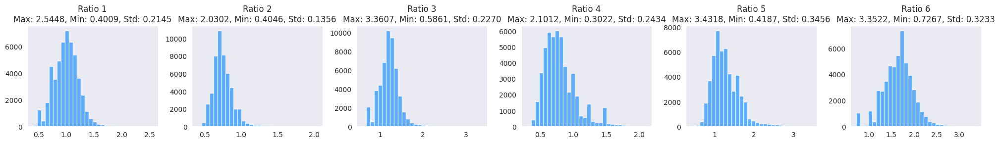


Method 1 (Error propagation)

- Evaluate detA in the 4 positions using samples from HMC and check unc(detA) is small enough:

max value of std(detA): tf.Tensor(0.047180124, shape=(), dtype=float32)

max value of max(detA)-detA(HMC median): tf.Tensor(0.19357747, shape=(), dtype=float32)

max value of detA(HMC median)-min(detA): tf.Tensor(0.1323294, shape=(), dtype=float32)

- Error propagation for 1/detA: unc = abs[1/detA^2 * unc (detA)]:

  - If unc (detA) = max(detA)-detA(HMC median), detA(HMC median)-min(detA):
1.023 +1.797/-1.447
0.532 +0.691/-0.753
1.318 +1.929/-1.825
0.520 +0.883/-0.736
1.288 +2.352/-1.783
2.476 +3.446/-3.428

  - If unc (detA) = std(detA):
1.02 ± 0.474
0.53 ± 0.238
1.32 ± 0.503
0.52 ± 0.255
1.29 ± 0.555
2.48 ± 1.026

Method 2 (Sample)

- Sample 1/detA

  - Using max(1/detA)-1/detA(HMC median), 1/detA(HMC median)-min(1/detA):
1.023 +2.980/-0.769
0.532 +2.483/-0.278
1.318 +4.300/-0.866
0.520 +2.664/-0.340
1.288 +4.484/-1.005
2.476 +3.123/-1.887

  - Using std(1/de

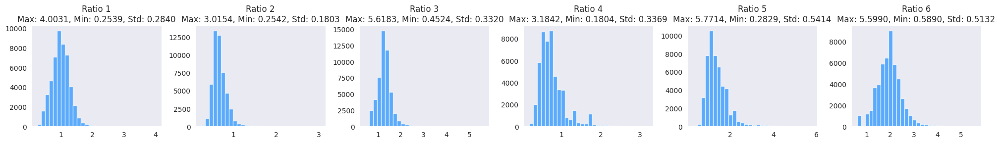


Method 1 (Error propagation)

- Evaluate detA in the 4 positions using samples from HMC and check unc(detA) is small enough:

max value of std(detA): tf.Tensor(0.04717987, shape=(), dtype=float32)

max value of max(detA)-detA(HMC median): tf.Tensor(0.19357747, shape=(), dtype=float32)

max value of detA(HMC median)-min(detA): tf.Tensor(0.1323294, shape=(), dtype=float32)

- Error propagation for 1/detA: unc = abs[1/detA^2 * unc (detA)]:

  - If unc (detA) = max(detA)-detA(HMC median), detA(HMC median)-min(detA):
1.023 +1.797/-1.447
0.532 +0.692/-0.752
1.318 +1.929/-1.825
0.520 +0.884/-0.735
1.288 +2.352/-1.784
2.476 +3.450/-3.428

  - If unc (detA) = std(detA):
1.02 ± 0.474
0.53 ± 0.238
1.32 ± 0.503
0.52 ± 0.255
1.29 ± 0.555
2.48 ± 1.027

Method 2 (Sample)

- Sample 1/detA

  - Using max(1/detA)-1/detA(HMC median), 1/detA(HMC median)-min(1/detA):
1.023 +13.361/-0.955
0.532 +9.226/-0.467
1.318 +20.362/-1.111
0.520 +10.725/-0.478
1.288 +23.224/-1.170
2.476 +20.155/-2.165

  - Using std(

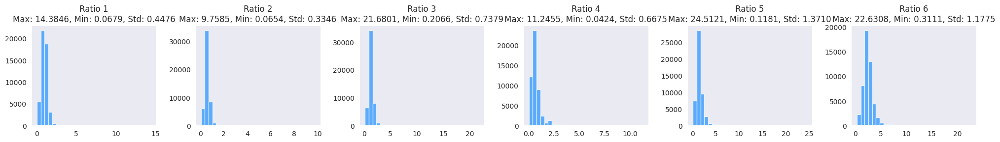


Method 1 (Error propagation)

- Evaluate detA in the 4 positions using samples from HMC and check unc(detA) is small enough:

max value of std(detA): tf.Tensor(0.04717987, shape=(), dtype=float32)

max value of max(detA)-detA(HMC median): tf.Tensor(0.19366455, shape=(), dtype=float32)

max value of detA(HMC median)-min(detA): tf.Tensor(0.13224232, shape=(), dtype=float32)

- Error propagation for 1/detA: unc = abs[1/detA^2 * unc (detA)]:

  - If unc (detA) = max(detA)-detA(HMC median), detA(HMC median)-min(detA):
1.023 +1.798/-1.446
0.532 +0.692/-0.752
1.316 +1.929/-1.823
0.521 +0.885/-0.736
1.287 +2.354/-1.782
2.472 +3.451/-3.423

  - If unc (detA) = std(detA):
1.02 ± 0.473
0.53 ± 0.238
1.32 ± 0.503
0.52 ± 0.255
1.29 ± 0.555
2.47 ± 1.026

Method 2 (Sample)

- Sample 1/detA

  - Using max(1/detA)-1/detA(HMC median), 1/detA(HMC median)-min(1/detA):
1.023 +24.056/-0.987
0.532 +16.338/-0.498
1.316 +37.085/-1.157
0.521 +19.499/-0.499
1.287 +46.533/-1.195
2.472 +40.476/-2.225

  - Using st

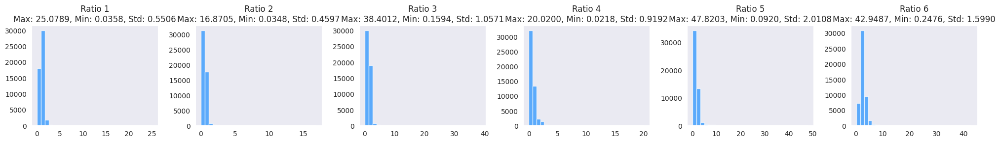


Method 1 (Error propagation)

- Evaluate detA in the 4 positions using samples from HMC and check unc(detA) is small enough:

max value of std(detA): tf.Tensor(0.04717987, shape=(), dtype=float32)

max value of max(detA)-detA(HMC median): tf.Tensor(0.19366455, shape=(), dtype=float32)

max value of detA(HMC median)-min(detA): tf.Tensor(0.13224232, shape=(), dtype=float32)

- Error propagation for 1/detA: unc = abs[1/detA^2 * unc (detA)]:

  - If unc (detA) = max(detA)-detA(HMC median), detA(HMC median)-min(detA):
1.023 +1.798/-1.446
0.532 +0.692/-0.752
1.316 +1.929/-1.823
0.521 +0.885/-0.736
1.287 +2.354/-1.782
2.472 +3.451/-3.423

  - If unc (detA) = std(detA):
1.02 ± 0.473
0.53 ± 0.238
1.32 ± 0.503
0.52 ± 0.255
1.29 ± 0.555
2.47 ± 1.026

Method 2 (Sample)

- Sample 1/detA

  - Using max(1/detA)-1/detA(HMC median), 1/detA(HMC median)-min(1/detA):
1.023 +77.167/-1.014
0.532 +76.333/-0.524
1.316 +173.915/-1.199
0.521 +90.457/-0.516
1.287 +225.967/-1.218
2.472 +167.297/-2.285

  - Using

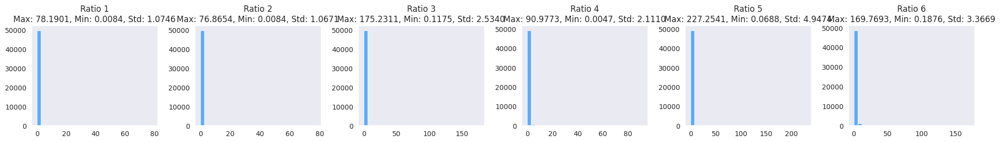


Method 1 (Error propagation)

- Evaluate detA in the 4 positions using samples from HMC and check unc(detA) is small enough:

max value of std(detA): tf.Tensor(0.04717987, shape=(), dtype=float32)

max value of max(detA)-detA(HMC median): tf.Tensor(0.19357747, shape=(), dtype=float32)

max value of detA(HMC median)-min(detA): tf.Tensor(0.1323294, shape=(), dtype=float32)

- Error propagation for 1/detA: unc = abs[1/detA^2 * unc (detA)]:

  - If unc (detA) = max(detA)-detA(HMC median), detA(HMC median)-min(detA):
1.023 +1.797/-1.447
0.532 +0.692/-0.752
1.318 +1.929/-1.825
0.520 +0.884/-0.735
1.288 +2.352/-1.784
2.476 +3.450/-3.428

  - If unc (detA) = std(detA):
1.02 ± 0.474
0.53 ± 0.238
1.32 ± 0.503
0.52 ± 0.255
1.29 ± 0.555
2.48 ± 1.027

Method 2 (Sample)

- Sample 1/detA

  - Using max(1/detA)-1/detA(HMC median), 1/detA(HMC median)-min(1/detA):
1.023 +16770.191/-1.023
0.532 +18291.834/-0.532
1.318 +57140.777/-1.212
0.520 +8804.429/-0.520
1.288 +32732.838/-1.226
2.476 +2850.311/-2.30

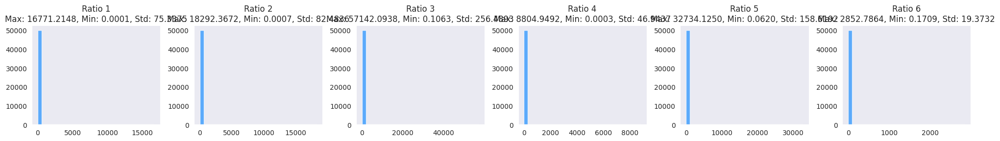

In [56]:
# tens = prob_model.pack_bij.inverse(samples_phys)
# reshaped_tens = tf.reshape(tens, (-1, tens.shape[2]))

# reshaped_phys = prob_model.pack_bij.forward(reshaped_tens)

x_quasar = tf.constant([1.156, -0.592, -0.975, -0.321])
y_quasar = tf.constant([-0.513, -0.490, 0.071, 0.384])
mags = tf.constant([1.56, 1.05, 2.70, 0.93])**2

for reg in [0.1, 0.05, 0.01, 0.005, 0.001, 0.]:
    flux_ratios_unc(x_arcsec = x_quasar, y_arcsec = y_quasar, mag_sq_truth = mags, samples_phys = samples_phys, reg = reg)


In [57]:
############
##### el codigo q tenia en simulaciones
############
num_pix = 750
delta_pix = 0.0006

truth = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]
'''
prob_model_output = [[
        {'theta_E': 0.152, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]'''

def flux_ratios_unc(truth, samples_phys, reg):
    tens = prob_model.pack_bij.inverse(samples_phys)
    reshaped_tens = tf.reshape(tens, (-1, tens.shape[2]))
    reshaped_phys = prob_model.pack_bij.forward(reshaped_tens)
    #det_values = determinant(x, y, reshaped_phys)
    #det_std = tf.math.reduce_std(det_values, axis=1)
    #print("\nCheck std(detA) is small:", det_std)

    # calculate median and evaluate det
    median_values = prob_model.pack_bij.forward([tfp.stats.percentile(reshaped_tens, 50.0, axis=0)])


    lens_omitted_img = lens_sim.simulate([truth[0], [], truth[2]])
    #plt.imshow(lens_omitted_img, origin='lower', vmin=0, vmax=1,)
    converter = BrightestPoints(number_of_images=4, num_pixels=num_pix, grid_size=250, delta_pix=delta_pix, supersample=1) # 40
    #print("lens_omitted_img", lens_omitted_img.shape)
    brightest_pixels = converter.find_brightest_points(lens_omitted_img)
    #print("brightest_pixels", brightest_pixels.shape)
    x_arcsec, y_arcsec = converter.pix_to_arcsec(brightest_pixels)
    x = tf.repeat(x_arcsec[..., tf.newaxis], [1], axis=-1)
    y = tf.repeat(y_arcsec[..., tf.newaxis], [1], axis=-1)

    mag_sq_truth = tf.sqrt(tf.square(magnification(x, y, truth))) ############ sqrt
    #print("\nmag_sq_truth", mag_sq_truth)
    ratios = tf.expand_dims(mag_sq_truth, 1) / tf.expand_dims(mag_sq_truth, 0)
    #print("\nratios",ratios)
    mask = tf.linalg.band_part(tf.ones((4, 4), dtype=tf.bool), 0, -1)
    mask = tf.logical_and(mask, tf.logical_not(tf.linalg.diag(tf.ones(4, dtype=tf.bool))))
    #print("mask", mask)
    upper_tri_ratios = tf.boolean_mask(ratios, mask)
    #########print("upper_tri_ratios", upper_tri_ratios)
    n = tf.shape(mag_sq_truth)[0]
    num_combinations = n * (n - 1) // 2
    ratios_truth = tf.reshape(upper_tri_ratios, [num_combinations, tf.shape(mag_sq_truth)[-1]])
    #print("\nratios_truth", ratios_truth)
    i, j = tf.meshgrid(tf.range(n), tf.range(n), indexing='ij')
    upper_triangle = tf.logical_and(i < j, tf.ones_like(i, dtype=bool))
    i, j = tf.boolean_mask(i, upper_triangle), tf.boolean_mask(j, upper_triangle)
    #print("i, j", i, j)

    det_sq = tf.sqrt(tf.square(determinant(x, y, reshaped_phys))) ########## sqrt
    #det_sq = determinant(x, y, prob_model_output)


    print("\n ratios truth:", ratios_truth)

    '''
    gi = tf.gather(det_sq, i, axis=0)
    gj = tf.gather(det_sq, j, axis=0)

    recovered_ratios = (gj+reg)/(gi+reg)


    bound = 50 # very high value
    recovered_ratios = tf.where(recovered_ratios < bound, recovered_ratios, tf.constant(float('nan')))

    masked_ratios = tf.where(recovered_ratios < bound, recovered_ratios, tf.constant(float('nan')))
    max_values = tf.reduce_max(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('-inf'))), axis=1)
    min_values = tf.reduce_min(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('inf'))), axis=1)

    std_values = tf.math.reduce_std(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('inf'))), axis=1)

    num_blocks = masked_ratios.shape[0]
    fig, axes = plt.subplots(1, num_blocks, figsize=(20, 3))
    for i in range(num_blocks):
        valid_values = masked_ratios[i][~tf.math.is_nan(masked_ratios[i])]
        axes[i].hist(valid_values.numpy(), bins=30, color='dodgerblue', alpha=0.7)
        max_val = max_values[i].numpy()
        min_val = min_values[i].numpy()
        std_val = std_values[i].numpy()
        axes[i].set_title(f'Ratio {i+1}\nMax: {max_val:.2f}, Min: {min_val:.2f}, Std: {std_val:.2f}')
    plt.tight_layout()
    plt.show()
    for i in range(num_blocks):
        print(f'ratio {i+1} - max: {max_values[i].numpy():.2f} min: {min_values[i].numpy():.2f} std: {std_values[i].numpy():.2f}')'''



    gi = tf.gather(det_sq, i, axis=0)
    gj = tf.gather(det_sq, j, axis=0)

    recovered_ratios = (gj + reg) / (gi + reg)

    bound = 100  # very high value
    recovered_ratios = tf.where(recovered_ratios < bound, recovered_ratios, tf.constant(float('nan')))

    masked_ratios = tf.where(recovered_ratios < bound, recovered_ratios, tf.constant(float('nan')))
    max_values = tf.reduce_max(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('-inf'))), axis=1)
    min_values = tf.reduce_min(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('inf'))), axis=1)

    std_values = tf.math.reduce_std(tf.where(masked_ratios < bound, masked_ratios, tf.constant(float('inf'))), axis=1)



    #print("gi", gi)
    std_gi = tf.math.reduce_std(gi, axis=1)
    print("\nstd gi", std_gi)
    std_gj = tf.math.reduce_std(gj, axis=1)
    print("\nstd gj", std_gj)


    #std_ratio = std_gj / std_gi




    det_sq_median = tf.reshape(tf.sqrt(tf.square(determinant(x, y, median_values))), (-1,)) ########## sqrt
    print("\n det_sq_median", det_sq_median)
    gi_median = tf.gather(det_sq_median, i, axis=0)
    gj_median = tf.gather(det_sq_median, j, axis=0)
    median_ratios = gj_median/gi_median
    print("\nmedian_ratios", median_ratios)
    error_prop = tf.sqrt(((1/gi_median) * std_gj)**2 + ((gj_median/gi_median**2) * std_gi)**2)

    num_blocks = masked_ratios.shape[0]
    fig, axes = plt.subplots(1, num_blocks, figsize=(20, 3))
    for i in range(num_blocks):
        valid_values = masked_ratios[i][~tf.math.is_nan(masked_ratios[i])]
        axes[i].hist(valid_values.numpy(), bins=30, color='dodgerblue', alpha=0.7)
        max_val = max_values[i].numpy()
        min_val = min_values[i].numpy()
        std_val = std_values[i].numpy()
        axes[i].set_title(f'Ratio {i+1}\nMax: {max_val:.2f}, Min: {min_val:.2f}, Std: {std_val:.2f}')
    plt.tight_layout()
    plt.show()

    for i in range(num_blocks):
        print(f'ratio {i+1} - max: {max_values[i].numpy():.2f} min: {min_values[i].numpy():.2f} std: {std_values[i].numpy():.2f}')


    print(f'Error propagation: {error_prop}')

# Varstrometry for Off-nucleus and Dual sub-Kpc AGN (VODKA). SDSS J1608+2716: A Sub-arcsec Quadruply Lensed Quasar at z = 2.575
- "We fit the image configuration with lenstronomy to examine the lensing scenario. The lens model is constrained by the positions of the lensed quasar as well as the spatially extended surface brightness distribution of its host galaxy. The flux ratios of the quasar are not employed as constraints in the modeling process as they can be influenced by microlensing effects and differential dust extinction (e.g., Keeton et al. 2006)."

## model

In [58]:
lens_prior = tfd.JointDistributionSequential( #UNIFORM PRIOR
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.2, high = 0.6),
           # gamma=tfd.Uniform(1.8, 2.3,),
           # gamma=tfd.Uniform(1.5, 2.5,),
           # gamma=tfd.Uniform(1., 3.,),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.7, 2.3),
           # e1=tfd.Uniform(-0.2, 0.2),
           # e2=tfd.Uniform(-0.2, 0.2),
          e1=tfd.Normal(0, 0.1),
          e2=tfd.Normal(0, 0.1),
          #  e1=tfd.Uniform(-0.2, 0.2),
          #  e2=tfd.Uniform(-0.2, 0.2),
          center_x=tfd.Normal(0, 0.1),
          center_y=tfd.Normal(0, 0.1),
           # center_x=tfd.Uniform(-0.2, 0.2),
           # center_y=tfd.Uniform(-0.2, 0.2),
          )
      ),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Normal(0, 0.1),
           gamma2=tfd.Normal(0, 0.1),
          # gamma1=tfd.Uniform(-0.2, 0.2),
          # gamma2=tfd.Uniform(-0.2, 0.2),
          ),
       ),
  ]
  )


Model:

-------------- w_dist-------------: 1000.0

-------------- w_flux-------------: 100.0

--- Modeling a real system ----


  0%|          | 0/3000 [00:00<?, ?it/s]


----- real system. comparing flux ratio difference ----

Best parameters:
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.4216625], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.9217902], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.11958627], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.04777754], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.10778087], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.29423344], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.05017087], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01539445], dtype=float32)>}]


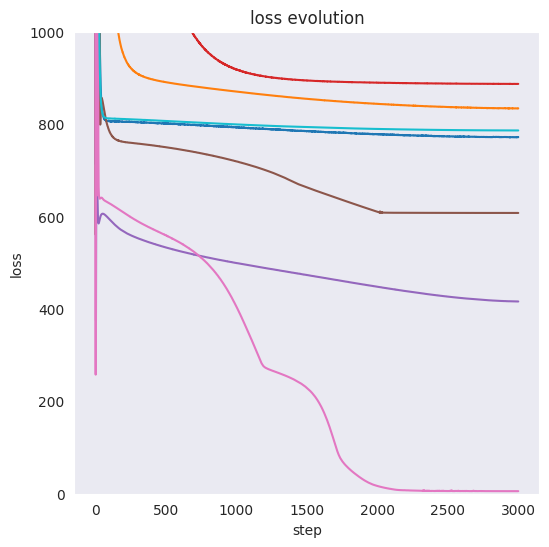


Relative errors:

theta_E: 181.11%
gamma: 1.15%
e1: 264.75%
e2: 325.63%
center_x: 1571.17%
center_y: 331.12%
gamma1: 28.29%
gamma2: 300.68%




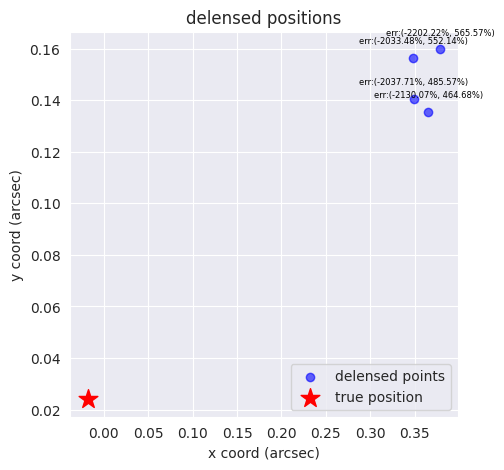


results when only the distance term is included in the loss with no prior --------------------------------------------------



  0%|          | 0/3000 [00:00<?, ?it/s]


Best parameters (only distance term):
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.60126454], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.9999423], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20585187], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05908329], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.43183863], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.7333815], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20583628], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05907518], dtype=float32)>}]

Relative errors:

theta_E: 300.84%
gamma: 47.37%
e1: 303.74%
e2: 288.40%
center_x: 3766.91%
center_y: 1627.35%
gamma1: 592.29%
gamma2: 923.35%




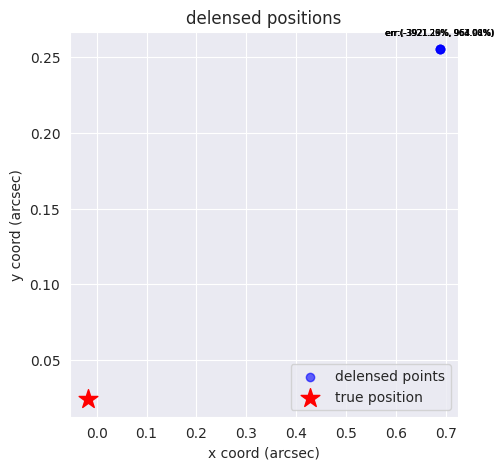


----- real system. comparing flux ratio difference ----


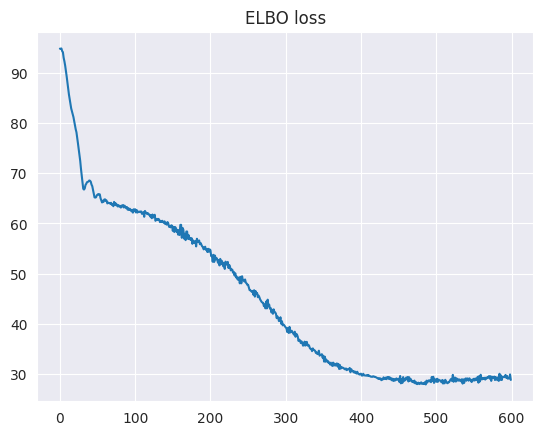


----- real system. comparing flux ratio difference ----

----------------method: adaptative------------------



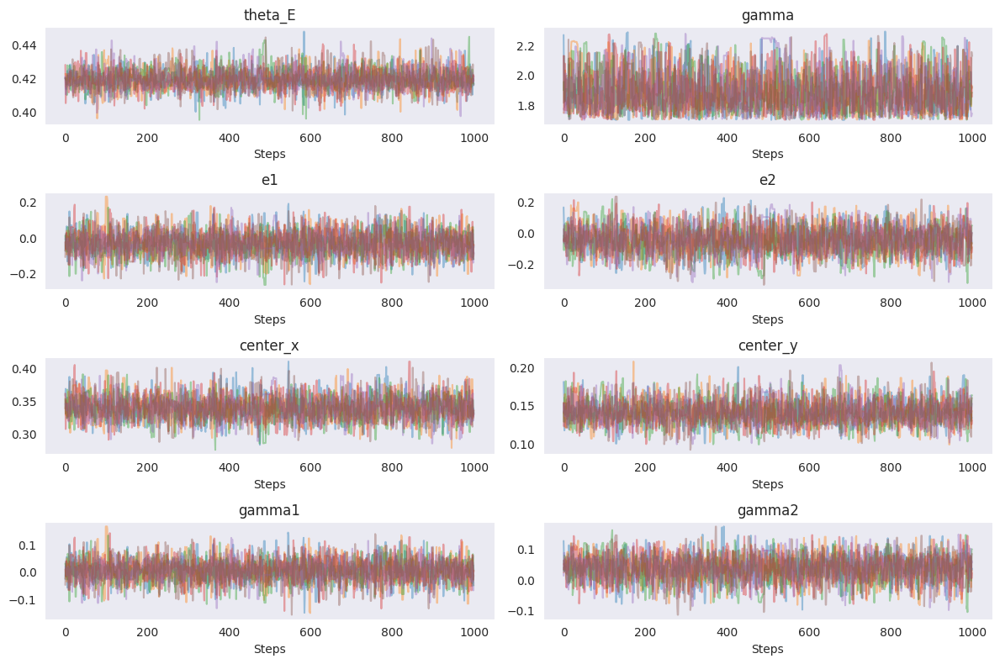


Rhat:
theta_E: 1.000899
gamma: 1.005091
e2: 1.000978
e1: 1.000995
center_y: 1.000702
center_x: 1.001351
gamma2: 1.000671
gamma1: 1.000850

ESS:
theta_E: 24272.705078
gamma: 10666.035156
e2: 16687.937500
e1: 24864.197266
center_y: 20367.140625
center_x: 19635.833984
gamma2: 20425.705078
gamma1: 28235.197266


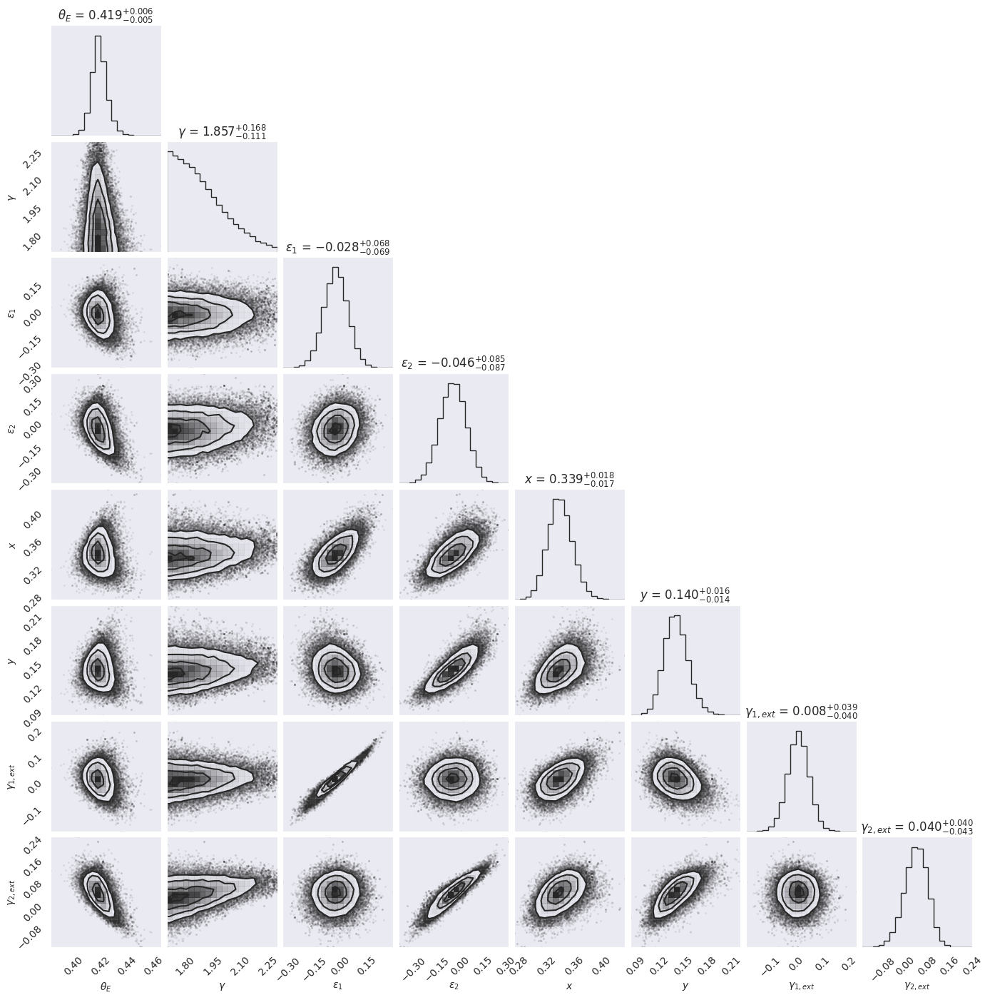

Parameter Means and Medians:
theta_E: mean = 0.419, median = 0.419
gamma: mean = 1.883, median = 1.857
e1: mean = -0.028, median = -0.028
e2: mean = -0.046, median = -0.046
center_x: mean = 0.340, median = 0.339
center_y: mean = 0.141, median = 0.140
gamma1: mean = 0.007, median = 0.008
gamma2: mean = 0.038, median = 0.040


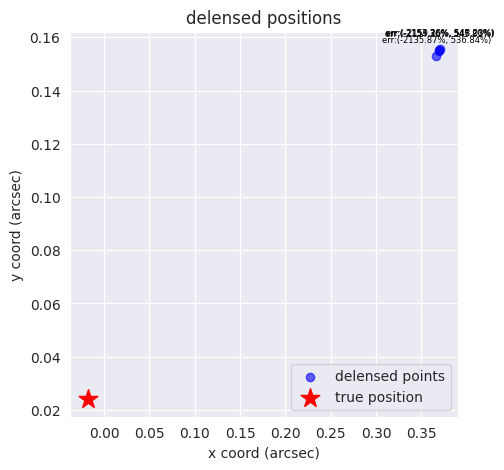

self.prob_model_output [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41891822], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.8573688], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.04551783], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.02757636], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.14028698], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.33938026], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.04016285], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.00770939], dtype=float32)>}]


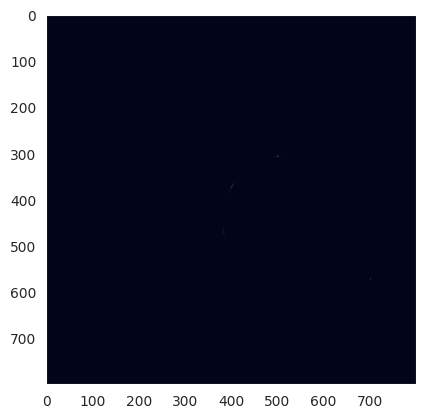

tf.Tensor(
[[7.3644747e-05 7.3855605e-05 7.4084805e-05 ... 1.3690248e-04
  1.3654404e-04 1.3615422e-04]
 [7.3838070e-05 7.4049487e-05 7.4261501e-05 ... 1.3758926e-04
  1.3719632e-04 1.3683723e-04]
 [7.4014184e-05 7.4226176e-05 7.4456453e-05 ... 1.3824651e-04
  1.3788455e-04 1.3749088e-04]
 ...
 [8.0241021e-05 8.0528349e-05 8.0816702e-05 ... 4.2156348e-04
  4.1955890e-04 4.1756427e-04]
 [8.0050093e-05 8.0336737e-05 8.0624399e-05 ... 4.1846084e-04
  4.1647139e-04 4.1449137e-04]
 [7.9859543e-05 8.0145503e-05 8.0413309e-05 ... 4.1538096e-04
  4.1340615e-04 4.1144082e-04]], shape=(800, 800), dtype=float32)
Brighest points reshaped into x, y:

x: tf.Tensor(
[[ 0.75374997]
 [ 0.25125   ]
 [ 0.00375001]
 [-0.03874999]], shape=(4, 1), dtype=float32)

y: tf.Tensor(
[[ 0.43125   ]
 [-0.23124999]
 [-0.06374999]
 [ 0.18125   ]], shape=(4, 1), dtype=float32)

params [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41891822], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=f

/tmp/ipython-input-1218289324.py:171: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


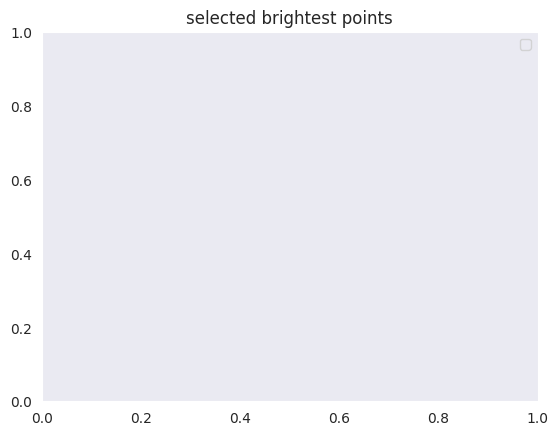

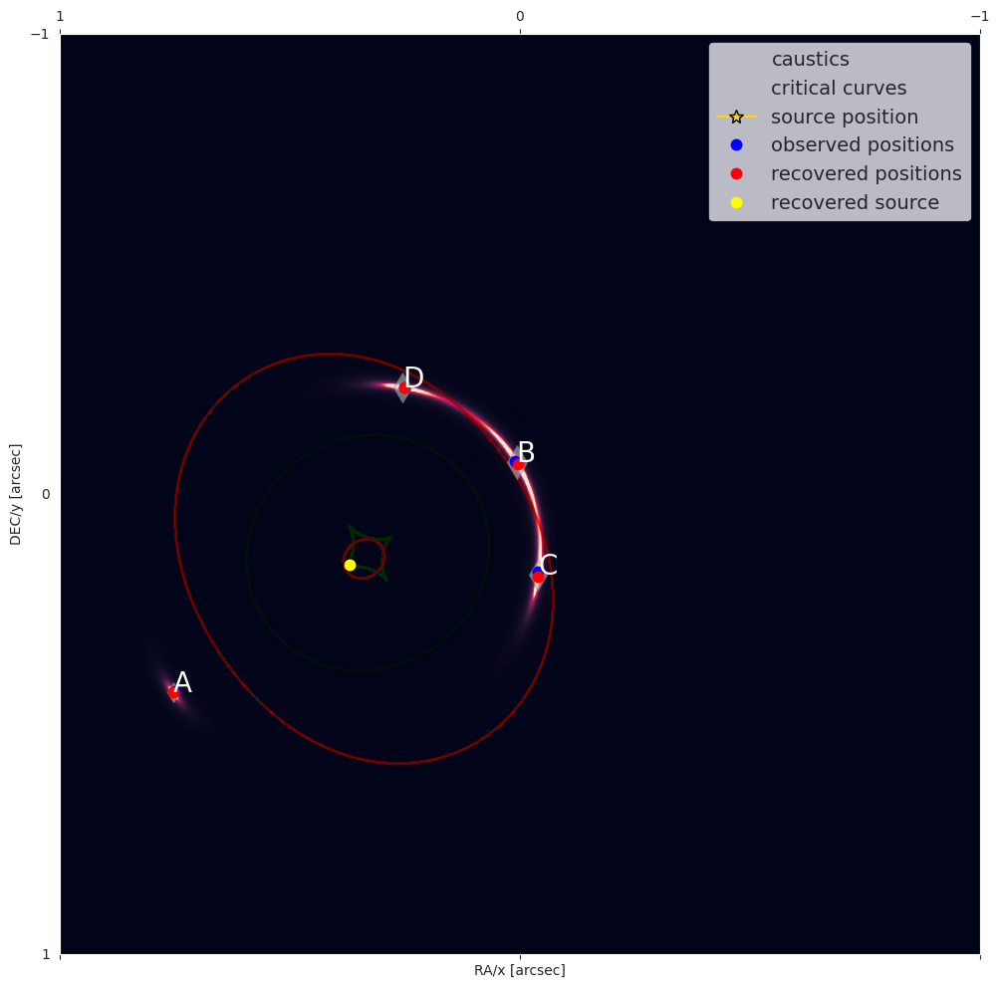


loss terms (in observed positions): tf.Tensor(
[[0.00105431]
 [0.0002148 ]
 [0.02172771]
 [0.002264  ]
 [0.01223894]
 [0.02090546]], shape=(6, 1), dtype=float32)

flux ratios observed: tf.Tensor(
[[ 2.100399 ]
 [ 4.938272 ]
 [18.903591 ]
 [ 2.3511112]
 [ 9.       ]
 [ 3.827977 ]], shape=(6, 1), dtype=float32)

flux ratios recovered (in observed positions): tf.Tensor(
[[ 3.4169273]
 [ 5.206495 ]
 [46.03526  ]
 [ 1.523736 ]
 [13.472707 ]
 [ 8.84189  ]], shape=(6, 1), dtype=float32)
flux1/flux2: 62.68%
flux1/flux3: 5.43%
flux1/flux4: 143.53%
flux2/flux3: 35.19%
flux2/flux4: 49.70%
flux3/flux4: 130.98%

observed_magnifications SN Zicky: tf.Tensor([0.06666667 0.046      0.03       0.01533333], shape=(4,), dtype=float32)

Predicted magnifications (in recovered positions). The ordering may have changed: tf.Tensor(
[[  5.0788827]
 [-15.716056 ]
 [ 31.46342  ]
 [-17.455044 ]], shape=(4, 1), dtype=float32)

Predicted magnifications (in observed positions): tf.Tensor(
[[ 35.337128 ]
 [-19.11672 

  0%|          | 0/3000 [00:00<?, ?it/s]


----- real system. comparing flux ratio difference ----

Best parameters:
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41708672], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.8669634], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.01936013], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.00963394], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.14001119], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.3392523], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.05347395], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01725023], dtype=float32)>}]


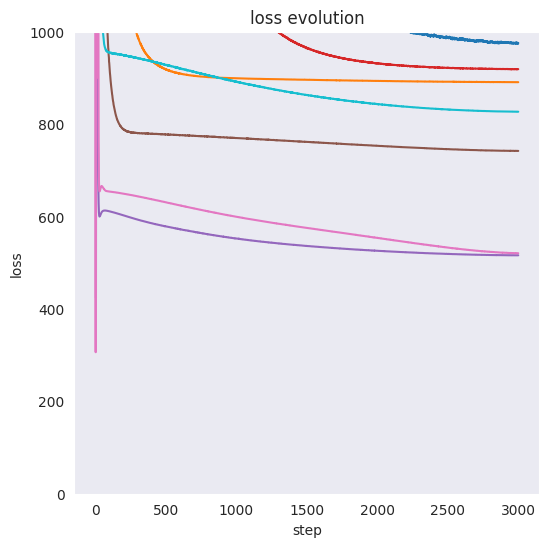


Relative errors:

theta_E: 178.06%
gamma: 1.74%
e1: 133.22%
e2: 136.53%
center_x: 1796.26%
center_y: 460.04%
gamma1: 43.75%
gamma2: 313.90%




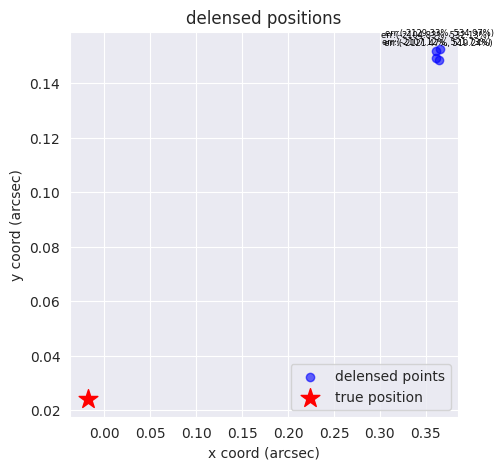


results when only the distance term is included in the loss with no prior --------------------------------------------------



  0%|          | 0/3000 [00:00<?, ?it/s]


Best parameters (only distance term):
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.60126454], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.9999423], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20585187], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05908329], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.43183863], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.7333815], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20583628], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05907518], dtype=float32)>}]

Relative errors:

theta_E: 300.84%
gamma: 47.37%
e1: 303.74%
e2: 288.40%
center_x: 3766.91%
center_y: 1627.35%
gamma1: 592.29%
gamma2: 923.35%




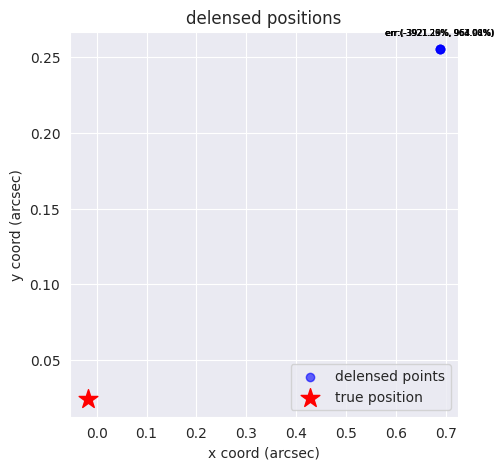


----- real system. comparing flux ratio difference ----


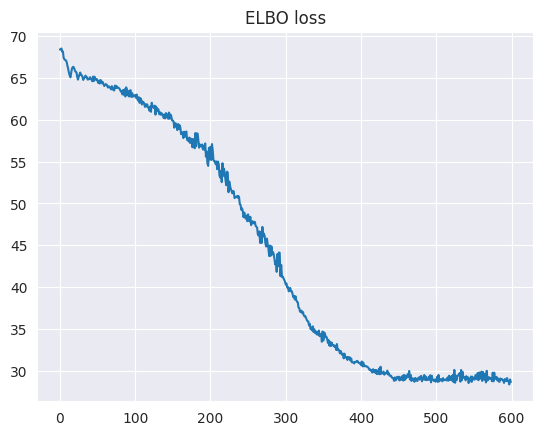


----- real system. comparing flux ratio difference ----

----------------method: adaptative------------------



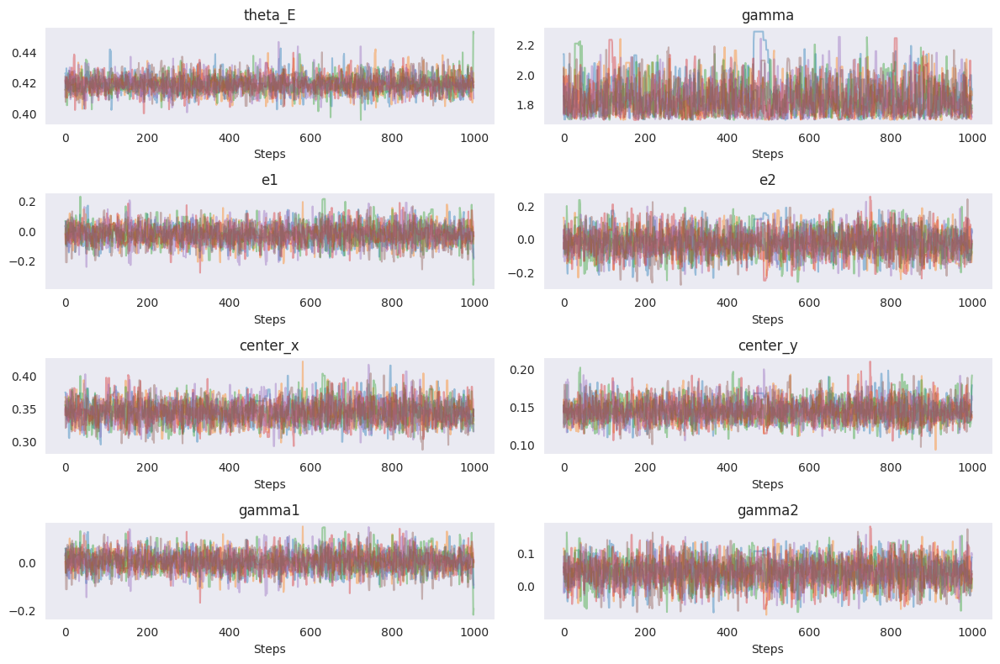


Rhat:
theta_E: 1.000581
gamma: 1.004586
e2: 1.000811
e1: 1.001169
center_y: 1.000429
center_x: 1.001525
gamma2: 1.000548
gamma1: 1.000808

ESS:
theta_E: 27522.203125
gamma: 11201.113281
e2: 17837.578125
e1: 22653.644531
center_y: 21793.779297
center_x: 20465.582031
gamma2: 20195.871094
gamma1: 25073.488281


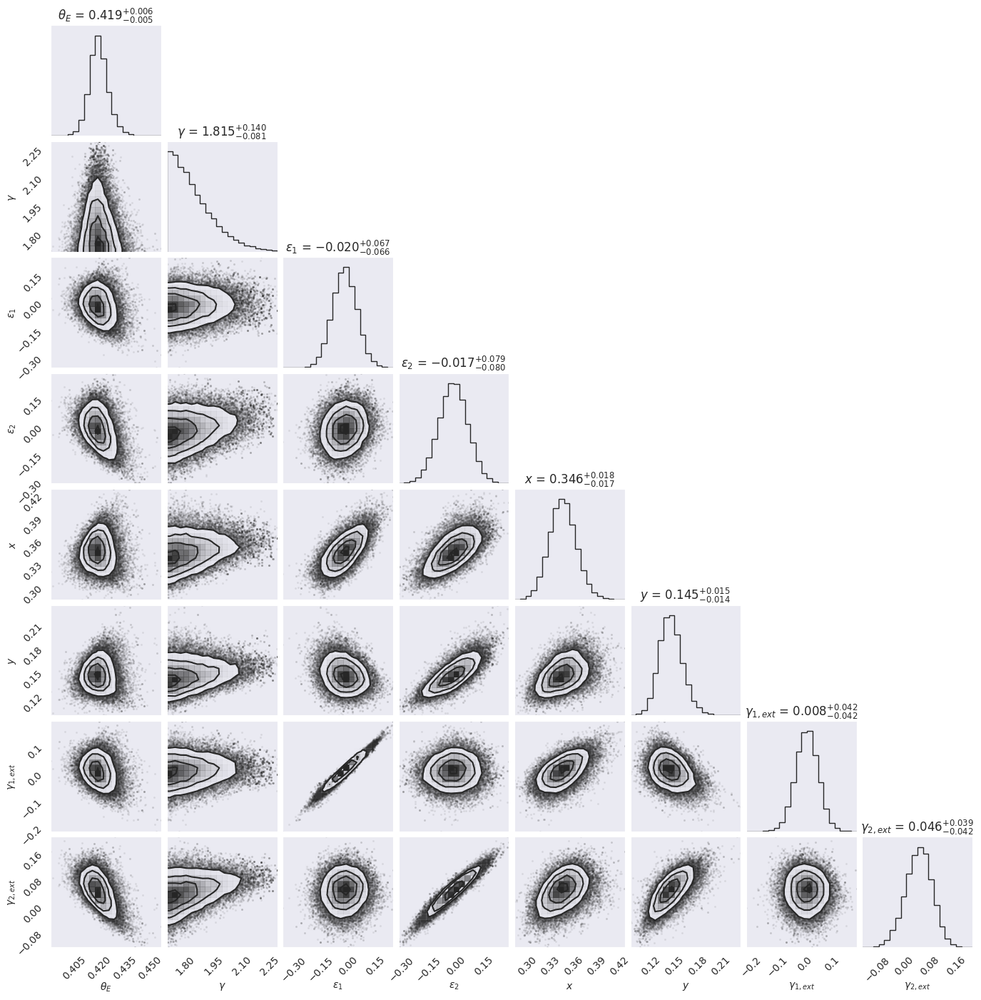

Parameter Means and Medians:
theta_E: mean = 0.419, median = 0.419
gamma: mean = 1.842, median = 1.815
e1: mean = -0.019, median = -0.020
e2: mean = -0.017, median = -0.017
center_x: mean = 0.346, median = 0.346
center_y: mean = 0.146, median = 0.145
gamma1: mean = 0.008, median = 0.008
gamma2: mean = 0.045, median = 0.046


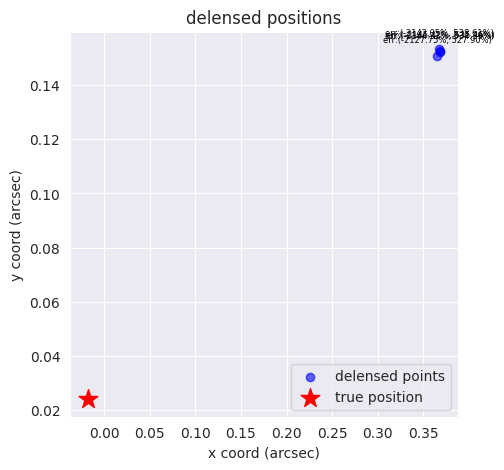

self.prob_model_output [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.4191629], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.8151449], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.01668014], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.01961216], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.14513324], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.34575588], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.04634871], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.00805322], dtype=float32)>}]


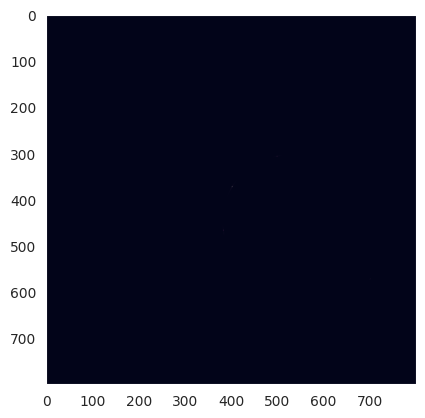

tf.Tensor(
[[7.8707184e-05 7.8932542e-05 7.9158533e-05 ... 1.4440823e-04
  1.4399595e-04 1.4358468e-04]
 [7.8894911e-05 7.9120880e-05 7.9366335e-05 ... 1.4509803e-04
  1.4468379e-04 1.4430497e-04]
 [7.9102021e-05 7.9328500e-05 7.9555706e-05 ... 1.4582594e-04
  1.4540959e-04 1.4499445e-04]
 ...
 [8.4077517e-05 8.4378582e-05 8.4680723e-05 ... 4.5724775e-04
  4.5496545e-04 4.5280205e-04]
 [8.3857376e-05 8.4157655e-05 8.4459010e-05 ... 4.5377426e-04
  4.5161691e-04 4.4936271e-04]
 [8.3657847e-05 8.3957406e-05 8.4258041e-05 ... 4.5032756e-04
  4.4818615e-04 4.4605540e-04]], shape=(800, 800), dtype=float32)
Brighest points reshaped into x, y:

x: tf.Tensor(
[[ 0.00625001]
 [ 0.24875   ]
 [-0.04124999]
 [ 0.25125   ]], shape=(4, 1), dtype=float32)

y: tf.Tensor(
[[-0.06624999]
 [-0.23124999]
 [ 0.16875   ]
 [-0.23124999]], shape=(4, 1), dtype=float32)

params [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.4191629], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=fl

/tmp/ipython-input-1218289324.py:171: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


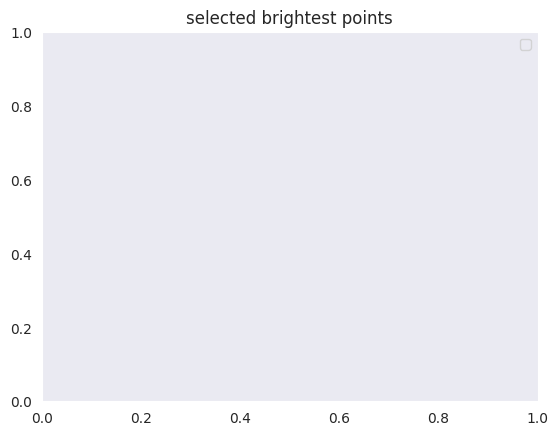

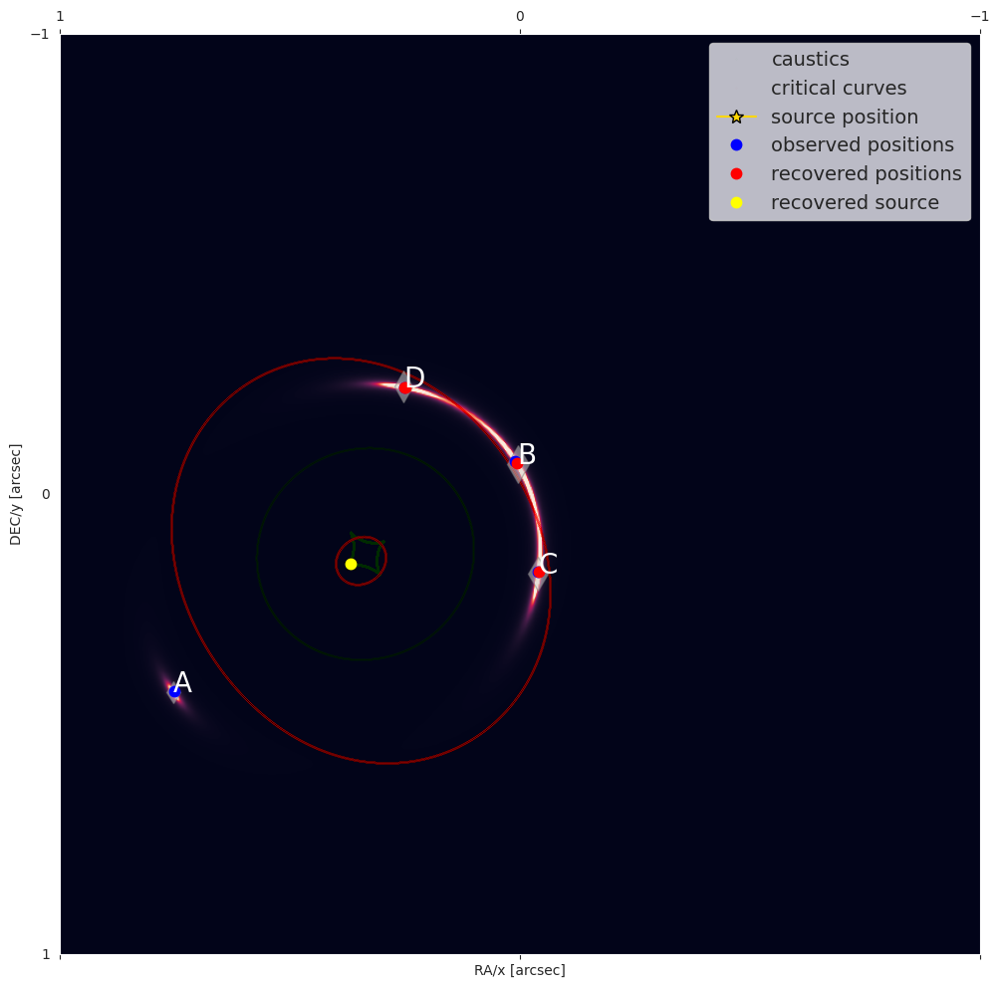


loss terms (in observed positions): tf.Tensor(
[[5.0610828e-04]
 [6.6026812e-05]
 [1.3629003e-02]
 [1.1238900e-03]
 [9.0740286e-03]
 [1.3376255e-02]], shape=(6, 1), dtype=float32)

flux ratios observed: tf.Tensor(
[[ 2.100399 ]
 [ 4.938272 ]
 [18.903591 ]
 [ 2.3511112]
 [ 9.       ]
 [ 3.827977 ]], shape=(6, 1), dtype=float32)

flux ratios recovered (in observed positions): tf.Tensor(
[[ 3.0938365]
 [ 5.0678754]
 [45.655895 ]
 [ 1.6380554]
 [14.757048 ]
 [ 9.0088825]], shape=(6, 1), dtype=float32)
flux1/flux2: 47.30%
flux1/flux3: 2.62%
flux1/flux4: 141.52%
flux2/flux3: 30.33%
flux2/flux4: 63.97%
flux3/flux4: 135.34%

observed_magnifications SN Zicky: tf.Tensor([0.06666667 0.046      0.03       0.01533333], shape=(4,), dtype=float32)

Predicted magnifications (in recovered positions). The ordering may have changed: tf.Tensor(
[[ 41.709064]
 [-20.97381 ]
 [-26.90537 ]
 [-20.055353]], shape=(4, 1), dtype=float32)

Predicted magnifications (in observed positions): tf.Tensor(
[[ 44.30457  

  0%|          | 0/3000 [00:00<?, ?it/s]


----- real system. comparing flux ratio difference ----

Best parameters:
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41667104], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.8697734], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.00417392], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.00123527], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.14861554], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.35094166], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.05682759], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01829494], dtype=float32)>}]


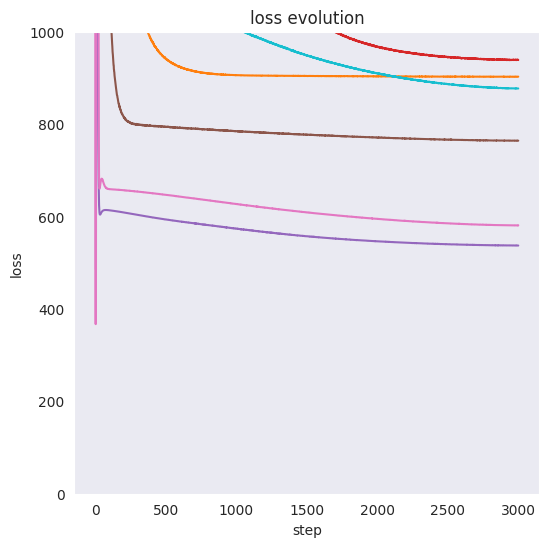


Relative errors:

theta_E: 177.78%
gamma: 1.59%
e1: 104.26%
e2: 92.12%
center_x: 1854.71%
center_y: 494.46%
gamma1: 52.46%
gamma2: 327.31%




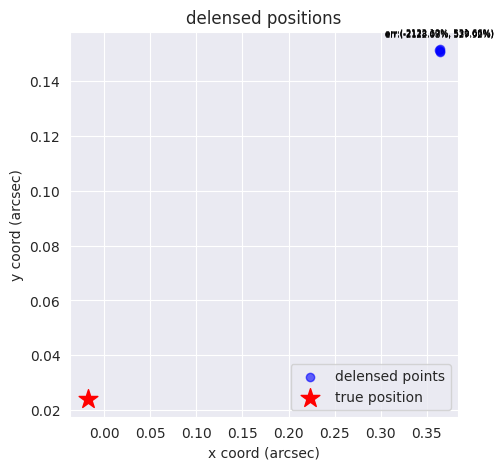


results when only the distance term is included in the loss with no prior --------------------------------------------------



  0%|          | 0/3000 [00:00<?, ?it/s]


Best parameters (only distance term):
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.60126454], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.9999423], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20585187], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05908329], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.43183863], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.7333815], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20583628], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05907518], dtype=float32)>}]

Relative errors:

theta_E: 300.84%
gamma: 47.37%
e1: 303.74%
e2: 288.40%
center_x: 3766.91%
center_y: 1627.35%
gamma1: 592.29%
gamma2: 923.35%




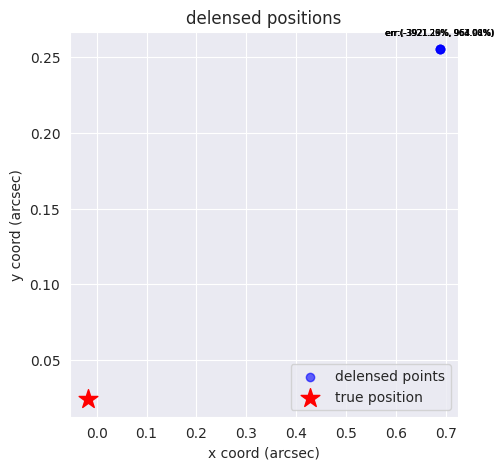


----- real system. comparing flux ratio difference ----


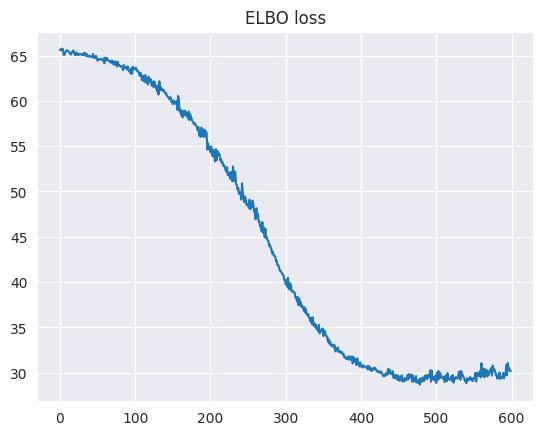


----- real system. comparing flux ratio difference ----

----------------method: adaptative------------------



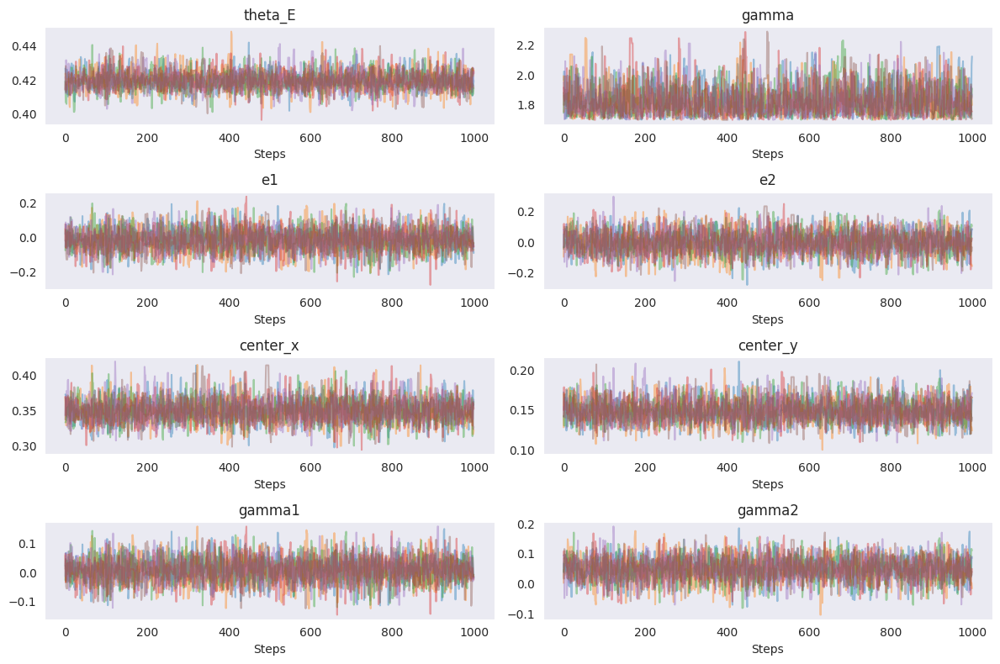


Rhat:
theta_E: 1.001139
gamma: 1.003295
e2: 1.000638
e1: 1.000608
center_y: 1.001107
center_x: 1.001115
gamma2: 1.000411
gamma1: 1.000478

ESS:
theta_E: 28117.267578
gamma: 12554.102539
e2: 22423.560547
e1: 26142.859375
center_y: 25319.476562
center_x: 23368.720703
gamma2: 25478.851562
gamma1: 27174.712891


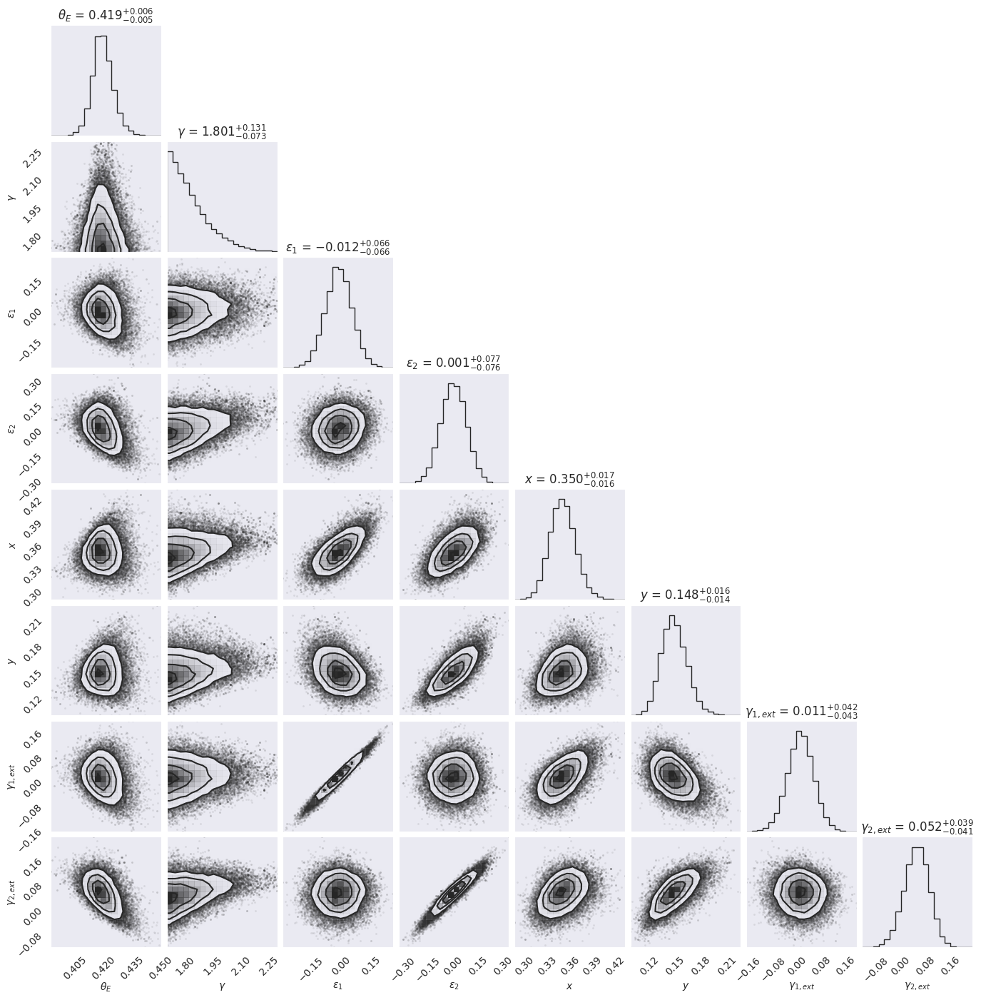

Parameter Means and Medians:
theta_E: mean = 0.420, median = 0.419
gamma: mean = 1.828, median = 1.801
e1: mean = -0.012, median = -0.012
e2: mean = 0.001, median = 0.001
center_x: mean = 0.350, median = 0.350
center_y: mean = 0.149, median = 0.148
gamma1: mean = 0.010, median = 0.011
gamma2: mean = 0.051, median = 0.052


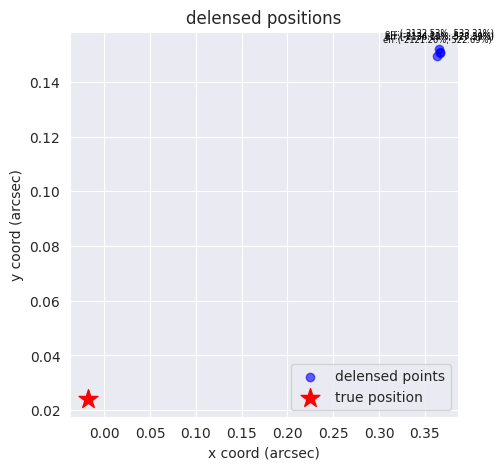

self.prob_model_output [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41919464], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.8014106], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.00117875], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.01189891], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.14803238], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.34992796], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.0517664], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01059895], dtype=float32)>}]


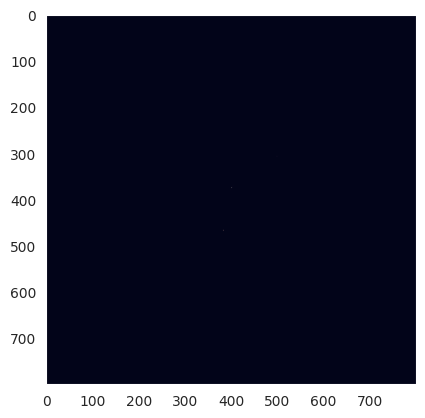

tf.Tensor(
[[8.1028855e-05 8.1280232e-05 8.1512953e-05 ... 1.4606936e-04
  1.4565232e-04 1.4523650e-04]
 [8.1241487e-05 8.1474085e-05 8.1726932e-05 ... 1.4680211e-04
  1.4638298e-04 1.4596505e-04]
 [8.1454746e-05 8.1687976e-05 8.1921869e-05 ... 1.4750351e-04
  1.4711733e-04 1.4669729e-04]
 ...
 [8.5125816e-05 8.5430547e-05 8.5736450e-05 ... 4.7208322e-04
  4.6983891e-04 4.6749329e-04]
 [8.4923173e-05 8.5227264e-05 8.5532447e-05 ... 4.6849705e-04
  4.6626973e-04 4.6405295e-04]
 [8.4700827e-05 8.5004118e-05 8.5308508e-05 ... 4.6493849e-04
  4.6272812e-04 4.6052781e-04]], shape=(800, 800), dtype=float32)
Brighest points reshaped into x, y:

x: tf.Tensor(
[[ 0.00375001]
 [-0.04124999]
 [ 0.24875   ]
 [ 0.75124997]], shape=(4, 1), dtype=float32)

y: tf.Tensor(
[[-0.06124999]
 [ 0.16875   ]
 [-0.23124999]
 [ 0.43375   ]], shape=(4, 1), dtype=float32)

params [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41919464], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=f

/tmp/ipython-input-1218289324.py:171: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


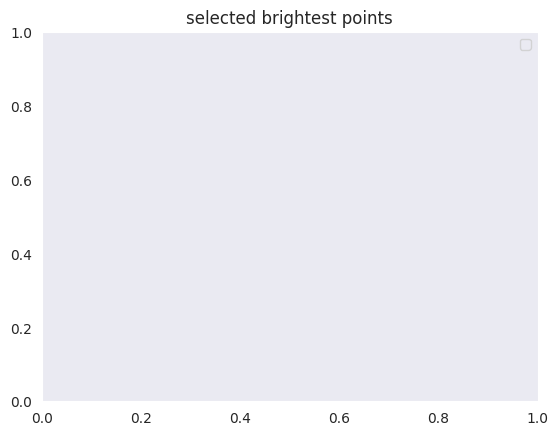

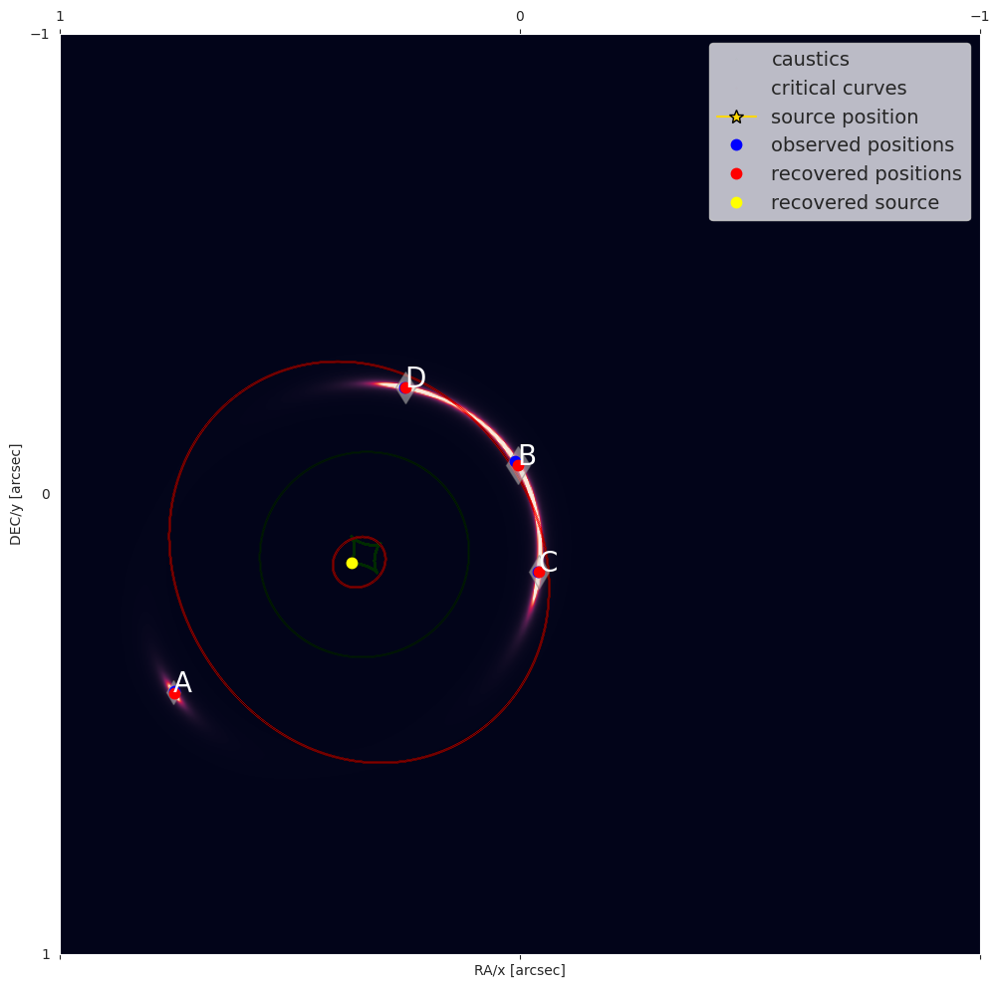


loss terms (in observed positions): tf.Tensor(
[[0.00042732]
 [0.00015387]
 [0.0107748 ]
 [0.00085081]
 [0.0069289 ]
 [0.0101858 ]], shape=(6, 1), dtype=float32)

flux ratios observed: tf.Tensor(
[[ 2.100399 ]
 [ 4.938272 ]
 [18.903591 ]
 [ 2.3511112]
 [ 9.       ]
 [ 3.827977 ]], shape=(6, 1), dtype=float32)

flux ratios recovered (in observed positions): tf.Tensor(
[[ 3.2948046]
 [ 5.368344 ]
 [49.02022  ]
 [ 1.629336 ]
 [14.8780365]
 [ 9.13135  ]], shape=(6, 1), dtype=float32)
flux1/flux2: 56.87%
flux1/flux3: 8.71%
flux1/flux4: 159.32%
flux2/flux3: 30.70%
flux2/flux4: 65.31%
flux3/flux4: 138.54%

observed_magnifications SN Zicky: tf.Tensor([0.06666667 0.046      0.03       0.01533333], shape=(4,), dtype=float32)

Predicted magnifications (in recovered positions). The ordering may have changed: tf.Tensor(
[[ 51.101597]
 [-31.204027]
 [-24.200418]
 [  7.362292]], shape=(4, 1), dtype=float32)

Predicted magnifications (in observed positions): tf.Tensor(
[[ 52.868706]
 [-29.126202]
 [-

  0%|          | 0/3000 [00:00<?, ?it/s]


----- real system. comparing flux ratio difference ----

Best parameters:
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41667905], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.911433], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.03804596], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01104279], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.16176324], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.36906448], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.06240901], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.02010257], dtype=float32)>}]


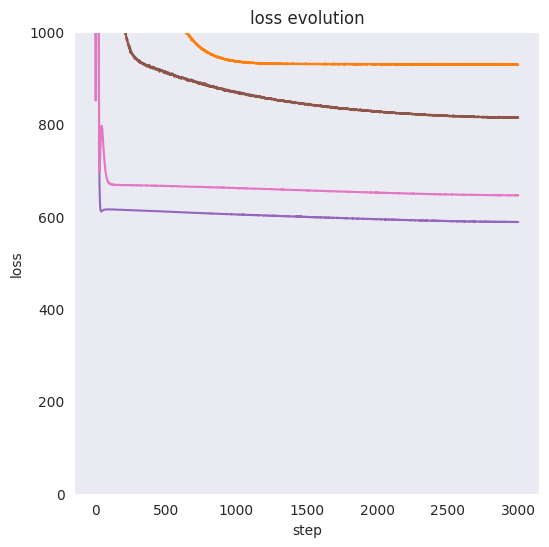


Relative errors:

theta_E: 177.79%
gamma: 0.60%
e1: 61.92%
e2: 28.22%
center_x: 1945.32%
center_y: 547.05%
gamma1: 67.52%
gamma2: 349.64%




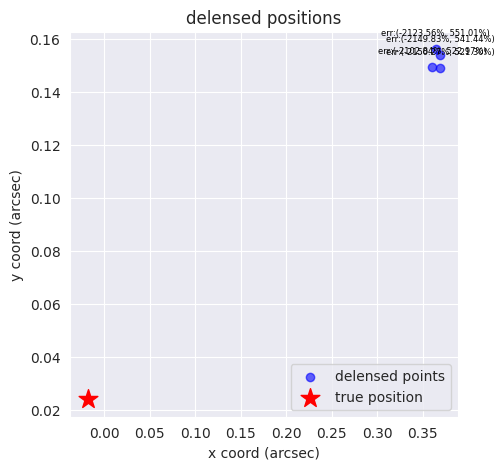


results when only the distance term is included in the loss with no prior --------------------------------------------------



  0%|          | 0/3000 [00:00<?, ?it/s]


Best parameters (only distance term):
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.60126454], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.9999423], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20585187], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05908329], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.43183863], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.7333815], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20583628], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05907518], dtype=float32)>}]

Relative errors:

theta_E: 300.84%
gamma: 47.37%
e1: 303.74%
e2: 288.40%
center_x: 3766.91%
center_y: 1627.35%
gamma1: 592.29%
gamma2: 923.35%




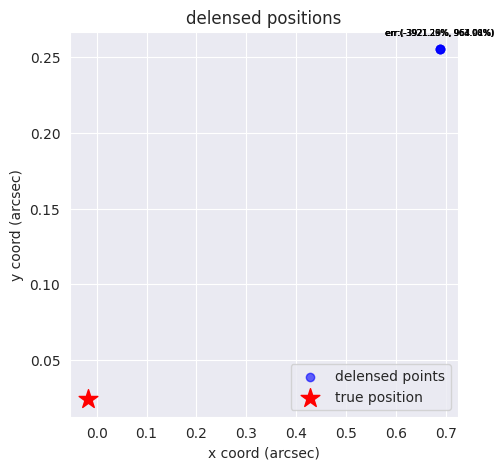


----- real system. comparing flux ratio difference ----


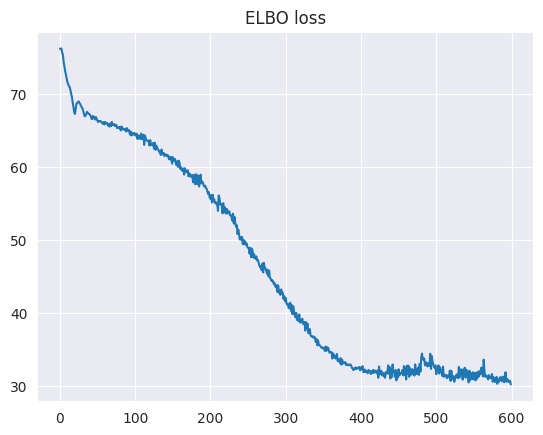


----- real system. comparing flux ratio difference ----

----------------method: adaptative------------------



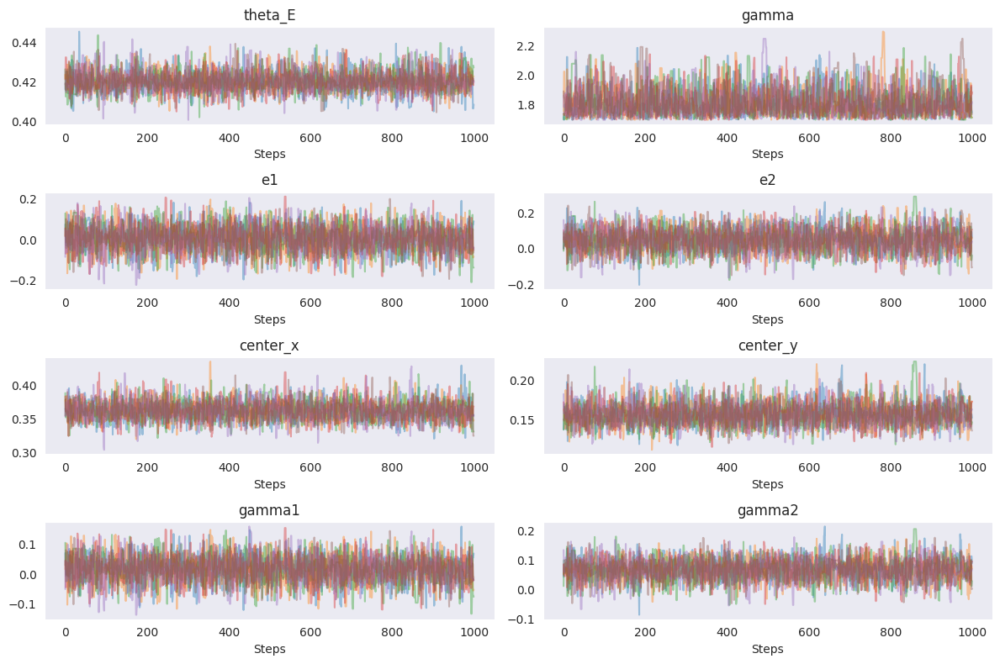


Rhat:
theta_E: 1.001397
gamma: 1.004579
e2: 1.001747
e1: 1.001384
center_y: 1.000871
center_x: 1.001832
gamma2: 1.001325
gamma1: 1.001103

ESS:
theta_E: 32557.986328
gamma: 13625.349609
e2: 18188.320312
e1: 21917.669922
center_y: 22114.156250
center_x: 21481.953125
gamma2: 22439.830078
gamma1: 24582.623047


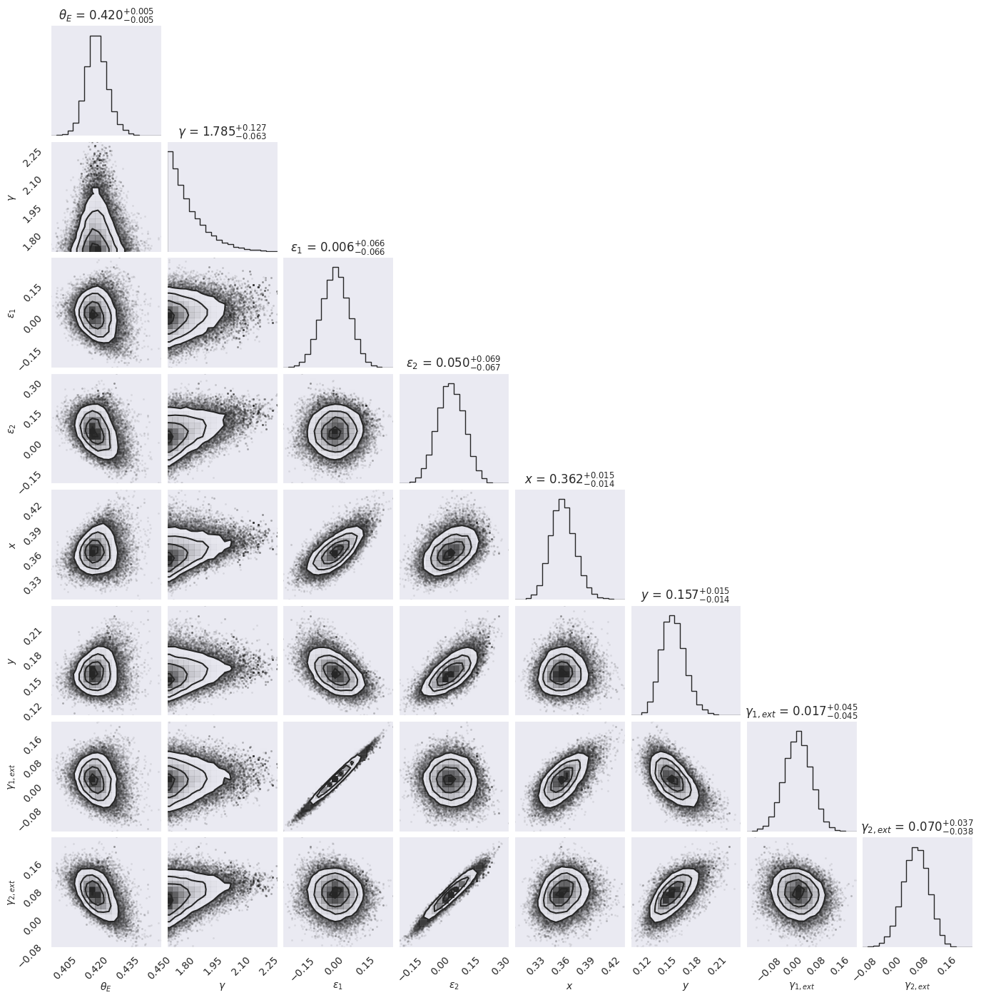

Parameter Means and Medians:
theta_E: mean = 0.420, median = 0.420
gamma: mean = 1.815, median = 1.785
e1: mean = 0.006, median = 0.006
e2: mean = 0.050, median = 0.050
center_x: mean = 0.362, median = 0.362
center_y: mean = 0.157, median = 0.157
gamma1: mean = 0.017, median = 0.017
gamma2: mean = 0.069, median = 0.070


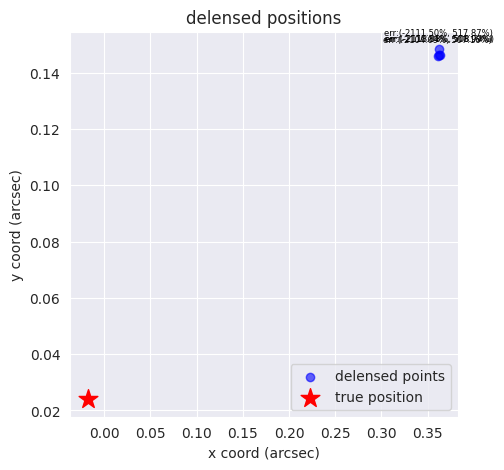

self.prob_model_output [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41985726], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.7854247], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.0495355], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.00638768], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.15650272], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.3615771], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.06952439], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01726342], dtype=float32)>}]


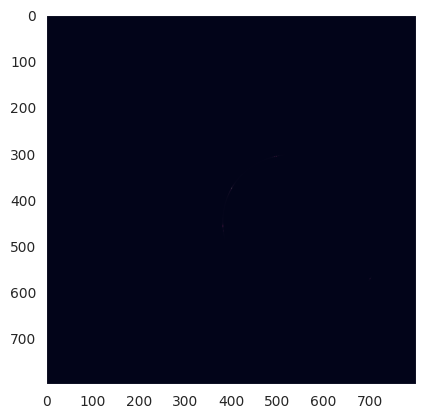

tf.Tensor(
[[8.5797801e-05 8.6043459e-05 8.6289816e-05 ... 1.4534028e-04
  1.4492532e-04 1.4451155e-04]
 [8.6002437e-05 8.6248765e-05 8.6516338e-05 ... 1.4606936e-04
  1.4565232e-04 1.4523650e-04]
 [8.6228203e-05 8.6475091e-05 8.6722772e-05 ... 1.4676711e-04
  1.4634809e-04 1.4593026e-04]
 ...
 [8.5146021e-05 8.5450913e-05 8.5756896e-05 ... 5.0249498e-04
  5.0010608e-04 4.9772800e-04]
 [8.4923173e-05 8.5227264e-05 8.5532447e-05 ... 4.9867778e-04
  4.9630698e-04 4.9394747e-04]
 [8.4700827e-05 8.5004118e-05 8.5308508e-05 ... 4.9488997e-04
  4.9253722e-04 4.9019512e-04]], shape=(800, 800), dtype=float32)
Brighest points reshaped into x, y:

x: tf.Tensor(
[[ 0.00375001]
 [-0.04374999]
 [ 0.24625   ]
 [ 0.75124997]], shape=(4, 1), dtype=float32)

y: tf.Tensor(
[[-0.05874999]
 [ 0.14625001]
 [-0.23124999]
 [ 0.43125   ]], shape=(4, 1), dtype=float32)

params [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41985726], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=f

/tmp/ipython-input-1218289324.py:171: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


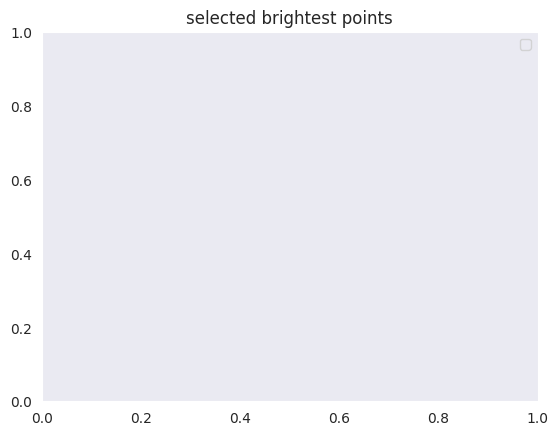

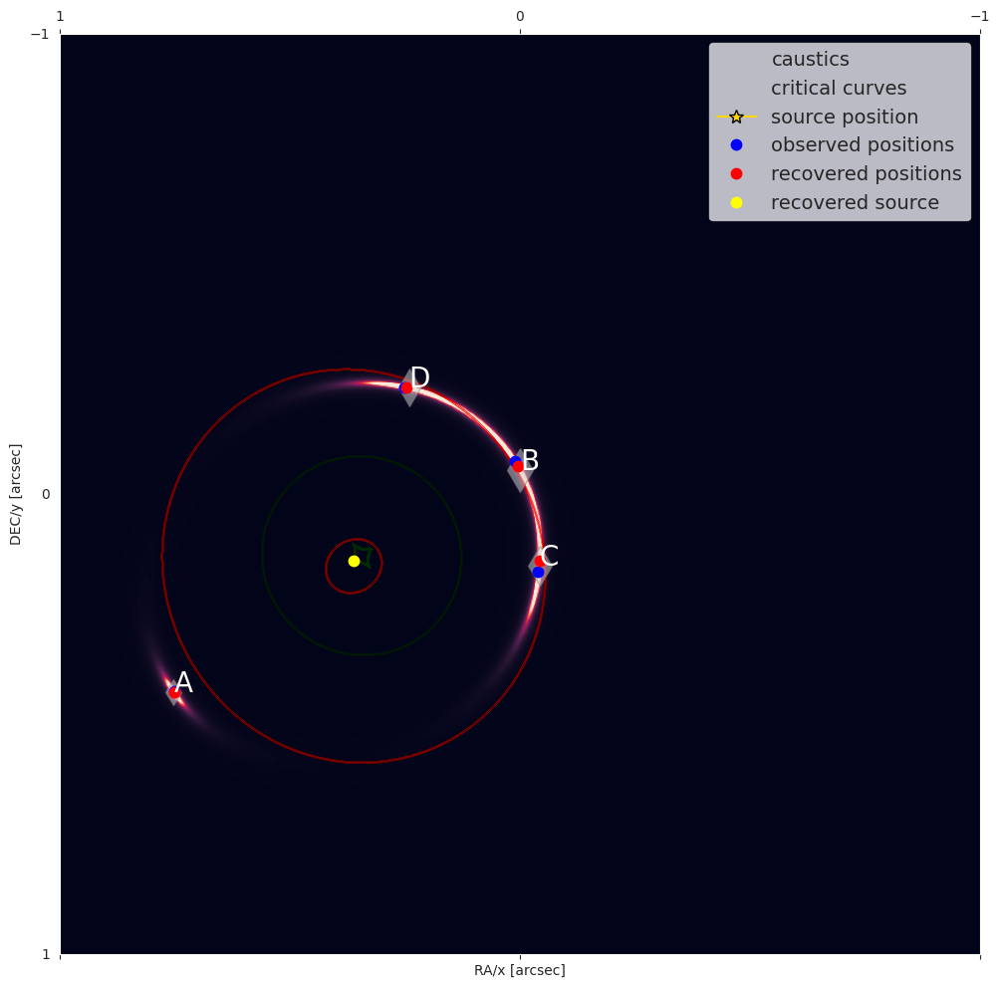


loss terms (in observed positions): tf.Tensor(
[[0.00017028]
 [0.00010131]
 [0.00468668]
 [0.00029903]
 [0.00315418]
 [0.00429888]], shape=(6, 1), dtype=float32)

flux ratios observed: tf.Tensor(
[[ 2.100399 ]
 [ 4.938272 ]
 [18.903591 ]
 [ 2.3511112]
 [ 9.       ]
 [ 3.827977 ]], shape=(6, 1), dtype=float32)

flux ratios recovered (in observed positions): tf.Tensor(
[[ 3.32999  ]
 [ 5.669826 ]
 [52.74648  ]
 [ 1.7026557]
 [15.83983  ]
 [ 9.303015 ]], shape=(6, 1), dtype=float32)
flux1/flux2: 58.54%
flux1/flux3: 14.81%
flux1/flux4: 179.03%
flux2/flux3: 27.58%
flux2/flux4: 76.00%
flux3/flux4: 143.03%

observed_magnifications SN Zicky: tf.Tensor([0.06666667 0.046      0.03       0.01533333], shape=(4,), dtype=float32)

Predicted magnifications (in recovered positions). The ordering may have changed: tf.Tensor(
[[ 94.49311 ]
 [-68.8894  ]
 [-40.03926 ]
 [ 11.388466]], shape=(4, 1), dtype=float32)

Predicted magnifications (in observed positions): tf.Tensor(
[[ 85.19813 ]
 [-46.567135]
 [

  0%|          | 0/3000 [00:00<?, ?it/s]


----- real system. comparing flux ratio difference ----

Best parameters:
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.41686678], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.9625044], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.04911156], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.0101653], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.16781345], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.3729109], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.06563469], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.01660635], dtype=float32)>}]


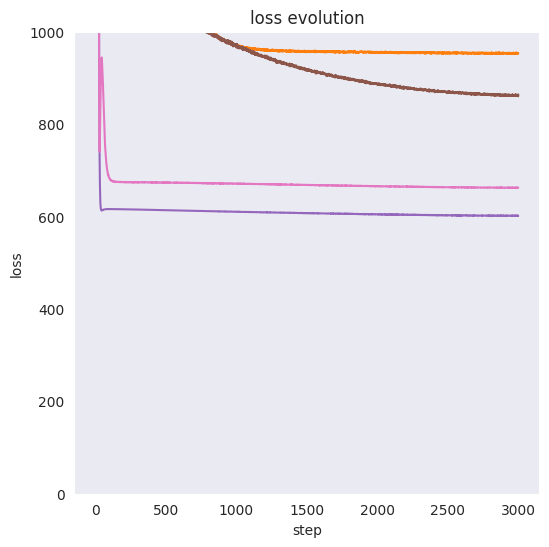


Relative errors:

theta_E: 177.91%
gamma: 3.29%
e1: 64.95%
e2: 7.34%
center_x: 1964.55%
center_y: 571.25%
gamma1: 38.39%
gamma2: 362.54%




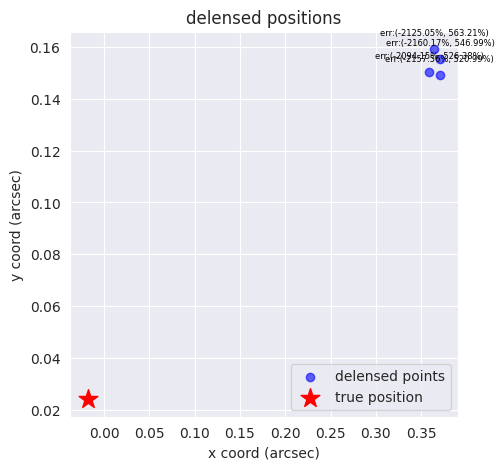


results when only the distance term is included in the loss with no prior --------------------------------------------------



  0%|          | 0/3000 [00:00<?, ?it/s]


Best parameters (only distance term):
 [{'theta_E': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.60126454], dtype=float32)>, 'gamma': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.9999423], dtype=float32)>, 'e2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20585187], dtype=float32)>, 'e1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05908329], dtype=float32)>, 'center_y': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.43183863], dtype=float32)>, 'center_x': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.7333815], dtype=float32)>}, {'gamma2': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.20583628], dtype=float32)>, 'gamma1': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([-0.05907518], dtype=float32)>}]

Relative errors:

theta_E: 300.84%
gamma: 47.37%
e1: 303.74%
e2: 288.40%
center_x: 3766.91%
center_y: 1627.35%
gamma1: 592.29%
gamma2: 923.35%




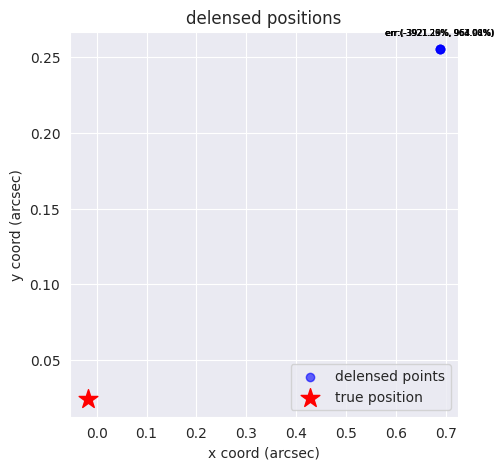


----- real system. comparing flux ratio difference ----


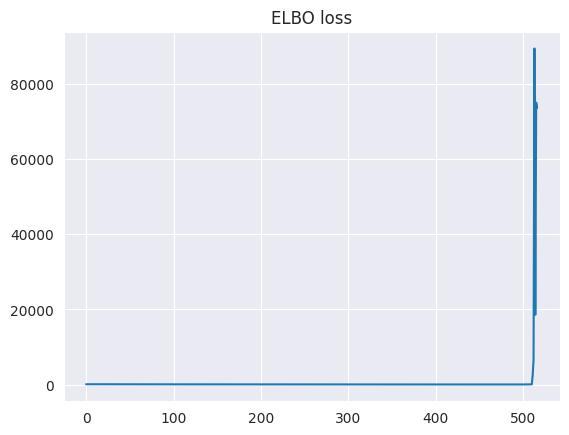


----- real system. comparing flux ratio difference ----


In [ ]:
x_q = tf.constant([0.01, -0.04, 0.25, 0.75])
y_q = tf.constant([-0.07, 0.17, -0.23, 0.43])

mags_q = tf.constant([1.00, 0.69, 0.45, 0.23])


# quasar
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.0025
num_pix = 800
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_q, y_q], tf.square(mags_q)]


weight_dist_values = [1e3, 5e3, 1e4,]
weight_flux_values = [1e2, 5e2, 1e3, 5e3, 1e4,]
for w_dist in weight_dist_values:
    for w_flux in weight_flux_values:
        print("\nModel:")
        print("\n-------------- w_dist-------------:", w_dist)
        print("\n-------------- w_flux-------------:", w_flux)

        analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                                     weight_dist=w_dist,weight_flux=w_flux,
                                     truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                                     observed_data = observed_data, simulation = False, flux_ratios = True)
        analysis.run_map(n_map = 5000, n_steps = 3000)
        analysis.run_vi()
        samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

In [ ]:
# broad prior, since gamma is pushing the wall. in the paper, they fix it to 2 and they cant recover flux ratios
lens_prior = tfd.JointDistributionSequential( #UNIFORM PRIOR
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.2, high = 0.6),
           # gamma=tfd.Uniform(1.8, 2.3,),
           # gamma=tfd.Uniform(1.5, 2.5,),
           # gamma=tfd.Uniform(1., 3.,),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.4, 2.3),
           # e1=tfd.Uniform(-0.2, 0.2),
           # e2=tfd.Uniform(-0.2, 0.2),
          e1=tfd.Normal(0, 0.1),
          e2=tfd.Normal(0, 0.1),
          #  e1=tfd.Uniform(-0.2, 0.2),
          #  e2=tfd.Uniform(-0.2, 0.2),
          center_x=tfd.Normal(0, 0.1),
          center_y=tfd.Normal(0, 0.1),
           # center_x=tfd.Uniform(-0.2, 0.2),
           # center_y=tfd.Uniform(-0.2, 0.2),
          )
      ),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Normal(0, 0.1),
           gamma2=tfd.Normal(0, 0.1),
          # gamma1=tfd.Uniform(-0.2, 0.2),
          # gamma2=tfd.Uniform(-0.2, 0.2),
          ),
       ),
  ]
  )

In [ ]:
x_q = tf.constant([0.01, -0.04, 0.25, 0.75])
y_q = tf.constant([-0.07, 0.17, -0.23, 0.43])

mags_q = tf.constant([1.00, 0.69, 0.45, 0.23])


# quasar
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.003
num_pix = 800
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_q, y_q], tf.square(mags_q)]


weight_dist_values = [1e3, 5e3, 1e4,]
weight_flux_values = [5e2, 1e3, 5e3, 1e4, 5e4]
for w_dist in weight_dist_values:
    for w_flux in weight_flux_values:
        print("\nModel:")
        print("\n-------------- w_dist-------------:", w_dist)
        print("\n-------------- w_flux-------------:", w_flux)

        analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                                     weight_dist=w_dist,weight_flux=w_flux,
                                     truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                                     observed_data = observed_data, simulation = False, flux_ratios = True)
        analysis.run_map(n_map = 5000, n_steps = 3000)
        analysis.run_vi()
        samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

## mass in CC and check regimes

## uncertainties reg

# 16geu tradeoffs

## model

In [ ]:
import numpy as np
import pandas as pd

def polar_to_cartesian(r, phi):
    x = r * np.cos(phi)
    y = r * np.sin(phi)
    return x, y

data = {
    "Image": [1, 2, 3, 4],
    "r [arcsec]": [0.251, 0.324, 0.297, 0.276],
    "φ [radians]": [4.468, 2.679, 1.013, 5.860],
    "tobs [days]": [0, -0.23, -1.43, 1.36],
    "µobs": [35.6, 15.7, 7.5, 9.1]
}

df = pd.DataFrame(data)
df["x [arcsec]"], df["y [arcsec]"] = polar_to_cartesian(df["r [arcsec]"], df["φ [radians]"])
x = df["x [arcsec]"]
y = df["y [arcsec]"]

plt.figure(figsize=(8, 8))
plt.scatter(x, y, color='blue', marker='o')

for i, txt in enumerate(df["Image"]):
    plt.annotate(txt, (x[i], y[i]), textcoords="offset points", xytext=(5,-5), ha='center')

plt.xlabel('x [arcsec]')
plt.ylabel('y [arcsec]')
plt.title('iPTF16geu')
plt.axis('equal')

plt.grid(False)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.show()
df


# SNZwicky flux ratios

# SN Zwicky flux fitting with ordering right

In [ ]:
with open('/content/drive/MyDrive/point-source-updates/F475W-photm.pkl', 'rb') as fh1:
    ri_cut475, result_tab475 = pickle.load(fh1)

with open('/content/drive/MyDrive/point-source-updates/F625W-photm.pkl', 'rb') as fh2:
    ri_cut625, result_tab625 = pickle.load(fh2)

with open('/content/drive/MyDrive/point-source-updates/F814W-photm.pkl', 'rb') as fh3:
    ri_cut814, result_tab814 = pickle.load(fh3)



from copy import copy
result_tab = copy(result_tab814)
result_tab['flux_fit'] = result_tab475['flux_fit'] + result_tab625['flux_fit'] + result_tab814['flux_fit']

x_fit = (result_tab475['x_fit'] + result_tab625['x_fit'] + result_tab814['x_fit'])/3
y_fit = (result_tab475['y_fit'] + result_tab625['y_fit'] + result_tab814['y_fit'])/3
result_tab['x_fit'] = x_fit
result_tab['y_fit'] = y_fit

In [ ]:
delta_pix = 0.02

background_rms475 = 0.00519
t_exp475 =  378.

background_rms625 = 0.006907
t_exp625 =  291.0

background_rms814 = 0.00590
t_exp814 = 312.0

background_rms = np.sqrt(background_rms475**2 + background_rms625**2 +background_rms814**2)
t_exp = t_exp475 + t_exp625 + t_exp814
exp_time = t_exp

In [ ]:
num_pix = 40
observed_img = ri_cut814[:num_pix,:num_pix]
# converter = BrightestPoints(number_of_images = 4, num_pixels=num_pix, grid_size=20, delta_pix=delta_pix, supersample=1)
# brightest_pixels = converter.find_brightest_points(observed_img)
# x_arcsec, y_arcsec = converter.pix_to_arcsec(brightest_pixels)

pixels_fit = np.array([result_tab['y_fit'].data,result_tab['x_fit'].data]).T
converter = BrightestPoints(number_of_images = 4, num_pixels=num_pix, grid_size=20, delta_pix=delta_pix, supersample=1)
x_arcsec, y_arcsec = converter.pix_to_arcsec(pixels_fit)

print(x_arcsec,y_arcsec)

fig,ax = plt.subplots(1,1,figsize = (10,8), sharex=False, sharey=False)
plt.imshow(observed_img,)
# plt.plot(brightest_pixels[:,1], brightest_pixels[:,0], 'kd', ms = 5, alpha = 0.8, label = 'Position of the images', markerfacecolor = 'none')
plt.plot(pixels_fit[:,1], pixels_fit[:,0], 'kd', ms = 5, alpha = 0.8, label = 'Position of the images', markerfacecolor = 'none')
plt.title('Observed image')
plt.legend()
plt.colorbar()
plt.grid(False)
plt.show()

In [ ]:
print((result_tab['x_fit']-20)*delta_pix)
print((result_tab['y_fit']-20)*delta_pix)
print(result_tab['flux_fit'])

In [ ]:
chains = 1
observed_img = ri_cut814[:num_pix,:num_pix]
# converter = BrightestPoints(number_of_images = 4, num_pixels=num_pix, grid_size=20, delta_pix=delta_pix, supersample=1)
# brightest_pixels = converter.find_brightest_points(observed_img)
# x_arcsec, y_arcsec = converter.pix_to_arcsec(brightest_pixels)

pixels_fit = np.array([result_tab['y_fit'].data,result_tab['x_fit'].data]).T
converter = BrightestPoints(number_of_images = 4, num_pixels=num_pix, grid_size=20, delta_pix=delta_pix, supersample=1)
x_arcsec, y_arcsec = converter.pix_to_arcsec(pixels_fit)
print(x_arcsec)
print(x_arcsec,y_arcsec)
x = tf.repeat(x_arcsec[..., tf.newaxis], [chains], axis=-1)
y = tf.repeat(y_arcsec[..., tf.newaxis], [chains], axis=-1)
print(x,y)

flux_truth_test = tf.constant(result_tab['flux_fit'], dtype = tf.float32)
tf.repeat(flux_truth_test[..., tf.newaxis], [chains], axis=-1)

## model

In [ ]:
lens_prior = tfd.JointDistributionSequential( #UNIFORM PRIOR
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.0, high = 0.3),
           # gamma=tfd.Uniform(1.8, 2.3,),
           # gamma=tfd.Uniform(1.5, 2.5,),
           # gamma=tfd.Uniform(1., 3.,),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.5, 2.5),
           # e1=tfd.Uniform(-0.2, 0.2),
           # e2=tfd.Uniform(-0.2, 0.2),
          e1=tfd.Normal(0, 0.1),
          e2=tfd.Normal(0, 0.1),
          #  e1=tfd.Uniform(-0.2, 0.2),
          #  e2=tfd.Uniform(-0.2, 0.2),
          center_x=tfd.Normal(0, 0.1),
          center_y=tfd.Normal(0, 0.1),
           # center_x=tfd.Uniform(-0.2, 0.2),
           # center_y=tfd.Uniform(-0.2, 0.2),
          )
      ),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Normal(0, 0.1),
           gamma2=tfd.Normal(0, 0.1),
          # gamma1=tfd.Uniform(-0.2, 0.2),
          # gamma2=tfd.Uniform(-0.2, 0.2),
          ),
       ),
  ]
  )


#prior = tfd.JointDistributionSequential(
#    [lens_prior,]
#)


#prob_model = ForwardProbModel(prior, observed_img, background_rms=background_rms, exp_time=exp_time)

#example = lens_prior.sample(seed = 0)
#size = int(tf.size(tf.nest.flatten(example)))

In [ ]:

prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.001
num_pix = 800
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_arcsec, y_arcsec], flux_truth_test**2]


weight_dist_values = [1e3, 5e3, 1e4,]
weight_flux_values = [1e7, 5e7, 1e8, 5e8,]
for w_dist in weight_dist_values:
    for w_flux in weight_flux_values:
        print("\nModel:")
        print("\n-------------- w_dist-------------:", w_dist)
        print("\n-------------- w_flux-------------:", w_flux)

        analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                                     weight_dist=w_dist,weight_flux=w_flux,
                                     truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                                     observed_data = observed_data, simulation = False, flux_ratios = False)
        analysis.run_map(n_map = 5000, n_steps = 3000)
        analysis.run_vi()
        samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

In [ ]:
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.0005
num_pix = 1600
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_arcsec, y_arcsec], flux_truth_test**2]


weight_dist_values = [5e3, 1e4,]
weight_flux_values = [5e8, 7e8, 9e8, 1e9, 5e9]
for w_dist in weight_dist_values:
    for w_flux in weight_flux_values:
        print("\nModel:")
        print("\n-------------- w_dist-------------:", w_dist)
        print("\n-------------- w_flux-------------:", w_flux)

        analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                                     weight_dist=w_dist,weight_flux=w_flux,
                                     truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                                     observed_data = observed_data, simulation = False, flux_ratios = False)
        analysis.run_map(n_map = 5000, n_steps = 3000)
        analysis.run_vi()
        samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

In [ ]:
# -------------- w_dist-------------: 5000.0
# -------------- w_flux-------------: 500000000.0
# esto nos da el modelo usual de snzwicky pero el problema es que el mas brillante nos lo detecta como el de arriba, pero debe ser el de abajo, pues tiene mas flux.
# quiza subiendo el weight del flux, puede detectar la diferencia entre el mas brilllante y el segundo mas brillante, porque parece que por ahora le da igual en terminos de loss
# pero hay que tener cuidado de no llegar al VI malo. otra opcion podria ser darle un weight muy grande al de arriba y al resto darles weights mas bajos, asi primero fiteamos el de arriba.
# porque como dije, lo que pensaba yo que estaba pasando es lo siguiente.

## we see the flux ratios are recovered really bad, as expected. check modeling with flux ratios but with weights around 1e8 for flux?

In [ ]:
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.001
num_pix = 800
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_arcsec, y_arcsec], flux_truth_test**2]


weight_dist_values = [5e3, 1e4,]
weight_flux_values = [1e8, 5e8,]
for w_dist in weight_dist_values:
    for w_flux in weight_flux_values:
        print("\nModel:")
        print("\n-------------- w_dist-------------:", w_dist)
        print("\n-------------- w_flux-------------:", w_flux)

        analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                                     weight_dist=w_dist,weight_flux=w_flux,
                                     truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                                     observed_data = observed_data, simulation = False, flux_ratios = True)
        analysis.run_map(n_map = 5000, n_steps = 3000)
        analysis.run_vi()
        samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

# Extra systems from STRIDES

## J2038-4008

In [ ]:
lens_prior = tfd.JointDistributionSequential( #UNIFORM PRIOR
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.9, high = 1.6),
           # gamma=tfd.Uniform(1.8, 2.3,),
           # gamma=tfd.Uniform(1.5, 2.5,),
           # gamma=tfd.Uniform(1., 3.,),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.7, 2.6),
           # e1=tfd.Uniform(-0.2, 0.2),
           # e2=tfd.Uniform(-0.2, 0.2),
          e1=tfd.Normal(0, 0.1),
          e2=tfd.Normal(0, 0.1),
          #  e1=tfd.Uniform(-0.2, 0.2),
          #  e2=tfd.Uniform(-0.2, 0.2),
          center_x=tfd.Normal(0, 0.1),
          center_y=tfd.Normal(0, 0.1),
           # center_x=tfd.Uniform(-0.2, 0.2),
           # center_y=tfd.Uniform(-0.2, 0.2),
          )
      ),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Normal(0, 0.1),
           gamma2=tfd.Normal(0, 0.1),
          # gamma1=tfd.Uniform(-0.2, 0.2),
          # gamma2=tfd.Uniform(-0.2, 0.2),
          ),
       ),
  ]
  )

In [ ]:
x_quasar_4 = tf.constant([0.819, 0.945, -0.572, -1.367])
y_quasar_4 = tf.constant([0.938, -1.141, -1.112, 0.569])


mags_4 = tf.constant([1.05, 2.88, 2.28, 2.38])

# quasar
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.005
num_pix = 800
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_quasar_4, y_quasar_4], tf.square(mags_4)]


analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                              weight_dist=5000,weight_flux=1000,
                              truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                              observed_data = observed_data, simulation = False, flux_ratios = True)
analysis.run_map(n_map = 5000, n_steps = 3000)
analysis.run_vi()
samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

## WG0214-2105

In [ ]:
lens_prior = tfd.JointDistributionSequential( #UNIFORM PRIOR
  [tfd.JointDistributionNamed(
      dict(
          theta_E=tfd.Uniform(low = 0.7, high = 1.),
           # gamma=tfd.Uniform(1.8, 2.3,),
           # gamma=tfd.Uniform(1.5, 2.5,),
           # gamma=tfd.Uniform(1., 3.,),
          gamma=tfd.TruncatedNormal(2, 0.25, 1.7, 2.6),
           # e1=tfd.Uniform(-0.2, 0.2),
           # e2=tfd.Uniform(-0.2, 0.2),
          e1=tfd.Normal(0, 0.1),
          e2=tfd.Normal(0, 0.1),
          #  e1=tfd.Uniform(-0.2, 0.2),
          #  e2=tfd.Uniform(-0.2, 0.2),
          center_x=tfd.Normal(0, 0.1),
          center_y=tfd.Normal(0, 0.1),
           # center_x=tfd.Uniform(-0.2, 0.2),
           # center_y=tfd.Uniform(-0.2, 0.2),
          )
      ),
   tfd.JointDistributionNamed(
       dict(
           gamma1=tfd.Normal(0, 0.1),
           gamma2=tfd.Normal(0, 0.1),
          # gamma1=tfd.Uniform(-0.2, 0.2),
          # gamma2=tfd.Uniform(-0.2, 0.2),
          ),
       ),
  ]
  )

In [ ]:
x_quasar_5 = tf.constant([0.556, -0.706, -0.260, 0.633])
y_quasar_5 = tf.constant([-0.868, -0.136, 0.790, 0.517])


mags_5 = tf.constant([4.46, -4.66, 7.56, 5.71])

# quasar
prior = tfd.JointDistributionSequential([lens_prior_uniform,])
prob_model_uniform = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)

prior = tfd.JointDistributionSequential([lens_prior,])
prob_model = ForwardProbModel(prior, 0, background_rms=0.2, exp_time=100)


delta_pix = 0.005
num_pix = 800
truth_test = [[
        {'theta_E': 0.150, 'gamma': 1.9, 'e1': 0.029, 'e2': 0.053, 'center_x': -0.02, 'center_y': 0.025},
        {'gamma1': 0.012, 'gamma2': -0.025}
      ],
       [
        {'R_sersic': 0.350, 'n_sersic': 2.586, 'e1': -0.262, 'e2': 0.239, 'center_x': 0.011, 'center_y': 0.005, 'Ie': 25.055}
    ],

               [
        {'center_x': -0.018, 'center_y': 0.024, 'Ie': 2815.973},
      ],]




observed_data = [[x_quasar_5, y_quasar_5], tf.square(mags_5)]


analysis = LensModelAnalysis(delta_pix=delta_pix, num_pix=num_pix,
                            weight_dist=5000,weight_flux=100,
                            truth_test=truth_test, prob_model=prob_model, prior=prior, prob_model_uniform=prob_model_uniform,
                            observed_data = observed_data, simulation = False, flux_ratios = True)
analysis.run_map(n_map = 5000, n_steps = 3000)
analysis.run_vi()
samples_phys = analysis.run_hmc(n_hmc=50, num_burnin_steps=200, num_results=1000)

In [ ]:
# todo: write paper part about flux ratios and tradeoff very carefully and very concise. maybe dont even add different sections? also that will help me to remember the results and prepare for meeting.
# todo:tryhardear lo de la mass sheet y escribirlo bien

# todo: responder a las preguntas del paper para antes de la reunion.
# abrir de nuevo todos los papers q trabaje incluso holicow y poder apuntar rapido a los datos.

# ver lo de las simulations el codigo que mandaron